# **Projeto Pairs Trading - Membros 2024.2**

### **Hugo Villanova, Antonio Tuychi, Marcelo Bettarello, Rosa Zhu e João Pedro Conte**

### FGV Quant x Avantgarde Asset Management

## **1. Importação de Bibliotecas e Configurações Iniciais**

In [1]:
# Importação de bibliotecas

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf
import statsmodels.api as sm
from statsmodels.tsa.stattools import coint, adfuller
from statsmodels.regression.linear_model import OLS
from statsmodels.tools.tools import add_constant
from matplotlib.pyplot import figure
import seaborn as sns
import statistics as st
import warnings
import math
from hurst import compute_Hc
from bcb import sgs

# Configurações iniciais

warnings.filterwarnings('ignore')
sns.set(style="whitegrid")

In [2]:
acoes_escolhidas = ['ALUP11.SA', 'AMBP3.SA', 'CEBR3.SA', 'CGAS3.SA', 'CLSC4.SA', 
                    'CMIG4.SA', 'COCE5.SA', 'CPFE3.SA', 'CPLE6.SA', 'CSMG3.SA', 
                    'EGIE3.SA', 'EKTR4.SA', 'ELET3.SA', 'EMAE4.SA', 'ENEV3.SA', 
                    'ENGI11.SA', 'EQPA3.SA', 'EQTL3.SA', 'GEPA4.SA', 'LIGT3.SA', 
                    'NEOE3.SA', 'REDE3.SA', 'SAPR11.SA', 'SBSP3.SA', 'TAEE11.SA', 
                    'TRPL4.SA']

## **2. Estratégia de Vários Períodos**

### **2.1. Período 1**

#### **2.1.1. Cotações das Ações**

In [3]:
cotacoes_formacao_1 = yf.download(acoes_escolhidas, start='2018-01-01', end='2018-12-31')['Adj Close']
cotacoes_trading_1 = yf.download(acoes_escolhidas, start='2019-01-01', end='2019-06-30')['Adj Close']

[*********************100%%**********************]  26 of 26 completed

3 Failed downloads:
['AMBP3.SA', 'NEOE3.SA']: Exception("%ticker%: Data doesn't exist for startDate = 1514772000, endDate = 1546221600")
['TRPL4.SA']: Exception('%ticker%: No data found, symbol may be delisted')
[*********************100%%**********************]  26 of 26 completed

3 Failed downloads:
['TRPL4.SA']: Exception('%ticker%: No data found, symbol may be delisted')
['AMBP3.SA', 'NEOE3.SA']: Exception("%ticker%: Data doesn't exist for startDate = 1546308000, endDate = 1561863600")


In [4]:
cotacoes_formacao_1 = cotacoes_formacao_1.dropna(axis=1)
cotacoes_trading_1 = cotacoes_trading_1.dropna(axis=1)

In [5]:
# Garantindo que ambos os períodos tenham as mesmas colunas
acoes_intersecao_1 = cotacoes_formacao_1.columns.intersection(cotacoes_trading_1.columns)
cotacoes_formacao_1 = cotacoes_formacao_1[acoes_intersecao_1]
cotacoes_trading_1 = cotacoes_trading_1[acoes_intersecao_1]

# Exibindo as colunas restantes para confirmação
cotacoes_formacao_1.columns, cotacoes_trading_1.columns

(Index(['ALUP11.SA', 'CEBR3.SA', 'CGAS3.SA', 'CLSC4.SA', 'CMIG4.SA', 'COCE5.SA',
        'CPFE3.SA', 'CPLE6.SA', 'CSMG3.SA', 'EGIE3.SA', 'EKTR4.SA', 'ELET3.SA',
        'EMAE4.SA', 'ENEV3.SA', 'ENGI11.SA', 'EQPA3.SA', 'EQTL3.SA', 'GEPA4.SA',
        'LIGT3.SA', 'REDE3.SA', 'SAPR11.SA', 'SBSP3.SA', 'TAEE11.SA'],
       dtype='object', name='Ticker'),
 Index(['ALUP11.SA', 'CEBR3.SA', 'CGAS3.SA', 'CLSC4.SA', 'CMIG4.SA', 'COCE5.SA',
        'CPFE3.SA', 'CPLE6.SA', 'CSMG3.SA', 'EGIE3.SA', 'EKTR4.SA', 'ELET3.SA',
        'EMAE4.SA', 'ENEV3.SA', 'ENGI11.SA', 'EQPA3.SA', 'EQTL3.SA', 'GEPA4.SA',
        'LIGT3.SA', 'REDE3.SA', 'SAPR11.SA', 'SBSP3.SA', 'TAEE11.SA'],
       dtype='object', name='Ticker'))

In [6]:
# Calculando os retornos cumulativos normalizados para o período de formação
cumret_formacao_1 = np.log(cotacoes_formacao_1).diff().cumsum() + 1
cumret_formacao_1.dropna(inplace=True)

# Calculando os retornos cumulativos normalizados para o período de trading
cumret_trading_1 = np.log(cotacoes_trading_1).diff().cumsum() + 1
cumret_trading_1.dropna(inplace=True)

#### **2.1.2. Dados do CDI**

In [7]:
cdi_trading_1 = sgs.get({'CDI': 12}, start='2019-01-01', end='2019-06-30')

# Convertendo o CDI de % diária para formato decimal
cdi_trading_1['CDI'] = cdi_trading_1['CDI'] / 100

# Ajustando o índice para ser compatível com os resultados da estratégia
cdi_trading_1.index = pd.to_datetime(cdi_trading_1.index)

indices_trading_1 = pd.DataFrame(index = cotacoes_trading_1.index)
indices_trading_1['CDI'] = cdi_trading_1['CDI']

#### **2.1.3. Seleção de Pares**

In [8]:
# Função para calcular as distâncias euclidianas entre pares
def calculate_distances(cumret):
    """
    Calcula a distância euclidiana para cada par de ações no DataFrame.
    Retorna um dicionário com as distâncias calculadas.
    """
    distances = {}
    for s1 in cumret.columns:
        for s2 in cumret.columns:
            if s1 != s2 and f'{s1}-{s2}' not in distances and f'{s2}-{s1}' not in distances:
                dist = np.sqrt(np.sum((cumret[s1] - cumret[s2])**2))
                distances[f'{s1}-{s2}'] = dist
    return distances
    
# Testar cointegração para todos os pares
def test_cointegration(cotacoes, significance_level=0.05):
    """
    Testa cointegração para todos os pares de ações no DataFrame de preços ajustados.
    Remove pares que contêm séries constantes.
    Retorna uma lista de pares cointegrados e seus p-valores.
    """
    cointegrated_pairs = []
    
    # Removendo séries constantes
    cotacoes = cotacoes.loc[:, (cotacoes != cotacoes.iloc[0]).any()]  # Filtra séries com pelo menos uma variação
    
    for s1 in cotacoes.columns:
        for s2 in cotacoes.columns:
            if s1 != s2:
                try:
                    # Calcula o p-valor do teste de cointegração
                    p_value = coint(cotacoes[s1], cotacoes[s2])[1]
                    if p_value < significance_level:
                        cointegrated_pairs.append((s1, s2, p_value))
                except ValueError as e:
                    print(f"Erro ao testar {s1} e {s2}: {e}")
    return cointegrated_pairs

# Selecionar pares cointegrados com menores distâncias euclidianas, sem duplicatas
def select_top_pairs(cointegrated_pairs, cotacoes, top_n=5):
    """
    Seleciona os pares cointegrados com as menores distâncias euclidianas.
    Garante que cada par seja único, independentemente da ordem.
    """
    # Calcula os retornos acumulados normalizados
    cumret = np.log(cotacoes).diff().cumsum().dropna()
    distances = calculate_distances(cumret)
    
    # Filtra pares cointegrados e calcula suas distâncias
    seen_pairs = set()  # Para armazenar pares únicos
    filtered_pairs = []
    
    for s1, s2, p_value in cointegrated_pairs:
        # Cria uma representação única para o par
        pair_key = tuple(sorted([s1, s2]))  # Ordena para garantir unicidade
        if pair_key not in seen_pairs:
            distance_key = f'{s1}-{s2}' if f'{s1}-{s2}' in distances else f'{s2}-{s1}'
            if distance_key in distances:
                seen_pairs.add(pair_key)
                filtered_pairs.append((s1, s2, p_value, distances[distance_key]))
    
    # Ordena por distância e seleciona os top_n
    sorted_pairs = sorted(filtered_pairs, key=lambda x: x[3])
    return sorted_pairs[:top_n]

In [9]:
# Exemplo de uso com cotacoes_formacao_1
# Usando preços ajustados para o teste de cointegração
pares_cointegrados_1 = test_cointegration(cotacoes_formacao_1)

# Selecionar os 5 pares cointegrados com menores distâncias
top_pairs = select_top_pairs(pares_cointegrados_1, cotacoes_formacao_1, top_n = 5)

# Exibir resultados
print("Top 5 pares cointegrados com menores distâncias:")
for s1, s2, p_value, distance in top_pairs:
    print(f"{s1} - {s2} | p-valor: {p_value:.4f} | Distância Euclidiana: {distance:.4f}")

Top 5 pares cointegrados com menores distâncias:
ENGI11.SA - CPFE3.SA | p-valor: 0.0288 | Distância Euclidiana: 0.5803
ALUP11.SA - EQTL3.SA | p-valor: 0.0069 | Distância Euclidiana: 1.0780
EGIE3.SA - TAEE11.SA | p-valor: 0.0104 | Distância Euclidiana: 1.3177
EQPA3.SA - CSMG3.SA | p-valor: 0.0249 | Distância Euclidiana: 1.4514
EKTR4.SA - COCE5.SA | p-valor: 0.0491 | Distância Euclidiana: 1.7663


#### **2.1.4. Calculando os Spreads**

In [10]:
# Função para calcular alpha, beta e o spread no período de formação
def calcular_spread(serie1, serie2):
    modelo = sm.OLS(serie1, sm.add_constant(serie2)).fit()
    alpha = modelo.params[0]
    beta = modelo.params[1]
    spread = serie1 - (alpha + beta * serie2)
    return spread, alpha, beta

# Lista para armazenar os resultados dos spreads no período de trading
resultados_spreads_trading_1 = []

# Iterando sobre os pares selecionados no 'top_pairs'
for s1, s2, p_value, distance in top_pairs:
    # Calculando o spread no período de formação para estimar alpha e beta
    serie1_formacao = cotacoes_formacao_1[s1]
    serie2_formacao = cotacoes_formacao_1[s2]
    spread_formacao, alpha, beta = calcular_spread(serie1_formacao, serie2_formacao)
    
    # Calculando o spread no período de trading usando os valores de alpha e beta do período de formação
    serie1_trading = cotacoes_trading_1[s1]
    serie2_trading = cotacoes_trading_1[s2]
    spread_trading = serie1_trading - (alpha + beta * serie2_trading)
    
    # Armazenando os resultados para o período de trading
    media_spread = spread_formacao.mean()
    desvio_spread = spread_formacao.std()
    resultados_spreads_trading_1.append((s1, s2, spread_trading, alpha, beta, media_spread, desvio_spread))

# Exibindo um exemplo dos resultados para verificação
for resultado in resultados_spreads_trading_1[:5]:  # Mostrando apenas os 5 primeiros pares para verificação
    print(f"Par: {resultado[0]} - {resultado[1]}")
    print(f"Alpha: {resultado[3]:.4f}, Beta: {resultado[4]:.4f}")
    print(f"Média do Spread de Formação: {resultado[5]:.4f}, Desvio Padrão do Spread de Formação: {resultado[6]:.4f}")
    print(f"Spread de Trading (primeiros valores):\n{resultado[2].head()}\n")

Par: ENGI11.SA - CPFE3.SA
Alpha: 0.4851, Beta: 1.5464
Média do Spread de Formação: 0.0000, Desvio Padrão do Spread de Formação: 0.8818
Spread de Trading (primeiros valores):
Date
2019-01-02   -0.715175
2019-01-03   -0.188329
2019-01-04   -0.013034
2019-01-07   -0.021355
2019-01-08   -0.201289
dtype: float64

Par: ALUP11.SA - EQTL3.SA
Alpha: 3.4085, Beta: 0.7456
Média do Spread de Formação: 0.0000, Desvio Padrão do Spread de Formação: 0.3171
Spread de Trading (primeiros valores):
Date
2019-01-02    0.122178
2019-01-03   -0.135587
2019-01-04   -0.450783
2019-01-07   -0.720871
2019-01-08   -0.609727
dtype: float64

Par: EGIE3.SA - TAEE11.SA
Alpha: 1.2127, Beta: 1.6774
Média do Spread de Formação: 0.0000, Desvio Padrão do Spread de Formação: 0.7727
Spread de Trading (primeiros valores):
Date
2019-01-02   -0.530198
2019-01-03    0.192734
2019-01-04   -0.201468
2019-01-07    0.047324
2019-01-08    0.352988
dtype: float64

Par: EQPA3.SA - CSMG3.SA
Alpha: 0.0116, Beta: 0.1469
Média do Spread d

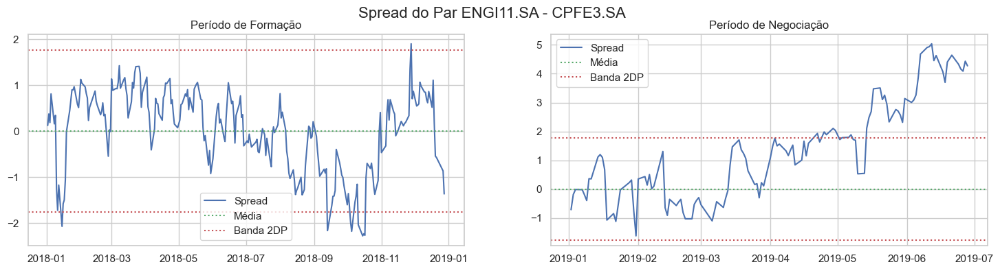

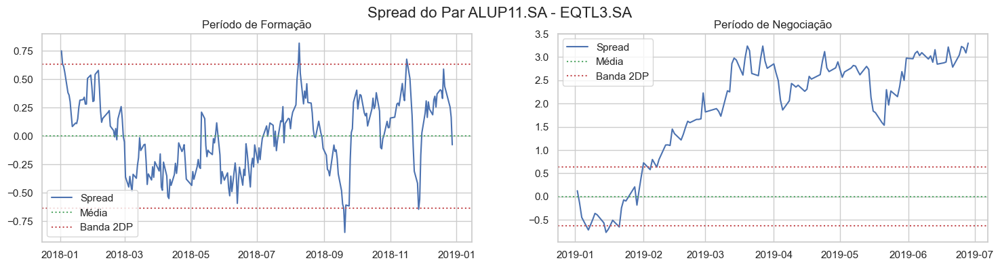

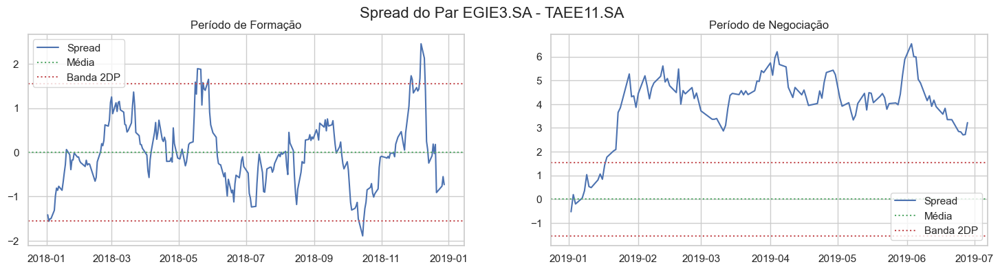

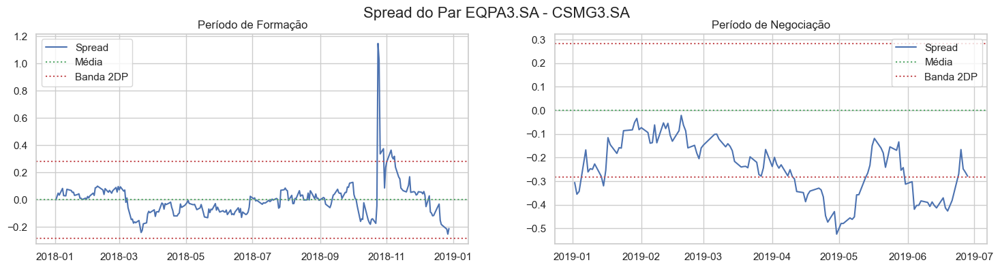

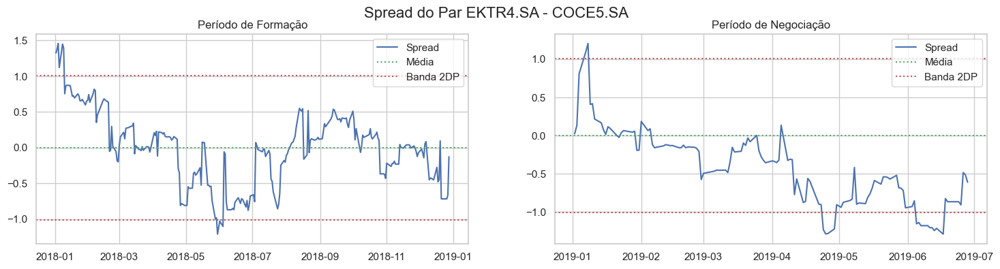

In [11]:
def plot_spreads(resultados_spreads_trading):
    """
    Plota os spreads de formação e de negociação para os pares selecionados.
    """
    for s1, s2, spread_trading, alpha, beta, media_spread, desvio_spread in resultados_spreads_trading:
        # Calculando o spread para o período de formação usando os valores armazenados
        spread_formacao = cotacoes_formacao_1[s1] - (alpha + beta * cotacoes_formacao_1[s2])

        # Criando gráficos lado a lado
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 4))
        fig.suptitle(f'Spread do Par {s1} - {s2}', fontsize=16)

        # Período de formação
        ax1.plot(spread_formacao, label='Spread')
        ax1.axhline(y=media_spread, color='g', linestyle='dotted', label='Média')
        ax1.axhline(y=media_spread + 2 * desvio_spread, color='r', linestyle='dotted', label='Banda 2DP')
        ax1.axhline(y=media_spread - 2 * desvio_spread, color='r', linestyle='dotted')
        ax1.set_title('Período de Formação')
        ax1.legend()

        # Período de negociação
        ax2.plot(spread_trading, label='Spread')
        ax2.axhline(y=media_spread, color='g', linestyle='dotted', label='Média')
        ax2.axhline(y=media_spread + 2 * desvio_spread, color='r', linestyle='dotted', label='Banda 2DP')
        ax2.axhline(y=media_spread - 2 * desvio_spread, color='r', linestyle='dotted')
        ax2.set_title('Período de Negociação')
        ax2.legend()

        plt.show()

# Chamando a função para os pares em resultados_spreads_trading_1
plot_spreads(resultados_spreads_trading_1)

#### **2.1.5. Definindo os Sinais da Estratégia**

In [12]:
# Lista para armazenar os resultados dos Z-scores no período de trading
resultados_z_scores_trading_1 = []

# Calculando os Z-scores para cada par no período de trading
for acao1, acao2, spread_trading, alpha, beta, media_spread, desvio_spread in resultados_spreads_trading_1:
    
    # Calculando o Z-score diário
    z_score_trading = (spread_trading - media_spread) / desvio_spread
    
    # Armazenando os resultados
    resultados_z_scores_trading_1.append((acao1, acao2, z_score_trading))

    # Exibindo um resumo do Z-score para conferência
    print(f"Par: {acao1} e {acao2} - Média do Z-score: {z_score_trading.mean():.4f}, Desvio Padrão do Z-score: {z_score_trading.std():.4f}\n")

Par: ENGI11.SA e CPFE3.SA - Média do Z-score: 1.5103, Desvio Padrão do Z-score: 1.9191

Par: ALUP11.SA e EQTL3.SA - Média do Z-score: 5.9756, Desvio Padrão do Z-score: 3.8120

Par: EGIE3.SA e TAEE11.SA - Média do Z-score: 5.1443, Desvio Padrão do Z-score: 1.8512

Par: EQPA3.SA e CSMG3.SA - Média do Z-score: -1.7190, Desvio Padrão do Z-score: 0.8477

Par: EKTR4.SA e COCE5.SA - Média do Z-score: -0.8407, Desvio Padrão do Z-score: 0.9589



In [13]:
# Lista para armazenar DataFrames com os sinais de trade para cada par
sinais_trade_list_1 = []

# Parâmetros de entrada e saída
sinal_entrada = 1.75  # Limite de entrada (1 desvio padrão)
sinal_saida = 0.5  # Limite de saída (0 desvio padrão)

# Iterando sobre cada par cointegrado para calcular os sinais de trade
for acao1, acao2, z_score_trading in resultados_z_scores_trading_1:
    
    # Criando DataFrame para armazenar os sinais de trade do par atual
    sinais_trade = pd.DataFrame(index=z_score_trading.index)
    
    # Usando os nomes dos ativos diretamente nas colunas
    sinais_trade[f'Preços {acao1}'] = cotacoes_trading_1[acao1]
    sinais_trade[f'Preços {acao2}'] = cotacoes_trading_1[acao2]

    # Inicializando variáveis de controle de posição
    posicao_short_ativa = False
    posicao_long_ativa = False

    # Inicializando as listas de entrada e saída ajustadas
    entradas_short = []
    entradas_long = []
    saidas_short = []
    saidas_long = []

    for i in range(len(sinais_trade)):
        # Verificando entradas
        if not posicao_short_ativa and not posicao_long_ativa:
            # Verifica se há uma nova entrada Short
            if (z_score_trading.iloc[i] > sinal_entrada) and (z_score_trading.shift(1).iloc[i] < sinal_entrada):
                entradas_short.append(True)
                entradas_long.append(False)
                posicao_short_ativa = True
            # Verifica se há uma nova entrada Long
            elif (z_score_trading.iloc[i] < -sinal_entrada) and (z_score_trading.shift(1).iloc[i] > -sinal_entrada):
                entradas_long.append(True)
                entradas_short.append(False)
                posicao_long_ativa = True
            else:
                entradas_short.append(False)
                entradas_long.append(False)
        else:
            entradas_short.append(False)
            entradas_long.append(False)

        # Verificando saídas
        if posicao_short_ativa:
            saida = (z_score_trading.iloc[i] < sinal_saida) and (z_score_trading.shift(1).iloc[i] > sinal_saida)
            saidas_short.append(saida)
            saidas_long.append(False)
            if saida:
                posicao_short_ativa = False  # Reseta posição após saída
        elif posicao_long_ativa:
            saida = (z_score_trading.iloc[i] > -sinal_saida) and (z_score_trading.shift(1).iloc[i] < -sinal_saida)
            saidas_long.append(saida)
            saidas_short.append(False)
            if saida:
                posicao_long_ativa = False  # Reseta posição após saída
        else:
            saidas_short.append(False)
            saidas_long.append(False)

    # Adicionando as colunas de entrada e saída ao DataFrame
    sinais_trade['Entrada Short'] = entradas_short
    sinais_trade['Entrada Long'] = entradas_long
    sinais_trade['Saida Short'] = saidas_short
    sinais_trade['Saida Long'] = saidas_long

    # Adicionando o DataFrame do par à lista
    sinais_trade_list_1.append((acao1, acao2, z_score_trading, sinais_trade))

#### **2.1.6. Calculando os Retornos**

In [14]:
# Lista para armazenar os resultados do backtest de todos os pares
resultado_backtest_todos_pares_1 = []

# Iterando sobre cada par e seus sinais de trade
for acao1, acao2, z_score_trading, sinais_trade in sinais_trade_list_1:
    # Criando um DataFrame para armazenar os resultados de retorno
    resultado = pd.DataFrame(index = sinais_trade.index)
    resultado[f'{acao1}'] = cotacoes_trading_1[acao1]
    resultado[f'{acao2}'] = cotacoes_trading_1[acao2]
    resultado['CDI'] = indices_trading_1['CDI']
    resultado['Entrada Short'] = sinais_trade['Entrada Short']
    resultado['Saida Short'] = sinais_trade['Saida Short']
    resultado['Entrada Long'] = sinais_trade['Entrada Long']
    resultado['Saida Long'] = sinais_trade['Saida Long']

    # Inicializando colunas de retorno
    retorno_acao1 = []
    retorno_acao2 = []

    # Inicializando variáveis de controle de posição
    posicao_short_ativa = False
    posicao_long_ativa = False

    # Iterando sobre as datas do DataFrame
    for i in range(len(sinais_trade)):
        if sinais_trade['Entrada Short'].iloc[i]:
            # Entrada Short: registrar o custo de transação inicial
            posicao_short_ativa = True
            retorno_acao1.append(-0.001)
            retorno_acao2.append(-0.001)
        elif sinais_trade['Entrada Long'].iloc[i]:
            # Entrada Long: registrar o custo de transação inicial
            posicao_long_ativa = True
            retorno_acao1.append(-0.001)
            retorno_acao2.append(-0.001)
        elif posicao_short_ativa:
            if sinais_trade['Saida Short'].iloc[i]:
                # Saída Short: registrar o custo de transação de saída
                retorno_acao1.append(-0.001)
                retorno_acao2.append(-0.001)
                posicao_short_ativa = False  # Fechar posição
            else:
                # Retorno diário em uma posição Short
                retorno_acao1.append(-(cotacoes_trading_1[acao1].iloc[i] / cotacoes_trading_1[acao1].iloc[i-1] - 1))
                retorno_acao2.append(cotacoes_trading_1[acao2].iloc[i] / cotacoes_trading_1[acao2].iloc[i-1] - 1)
        elif posicao_long_ativa:
            if sinais_trade['Saida Long'].iloc[i]:
                # Saída Long: registrar o custo de transação de saída
                retorno_acao1.append(-0.001)
                retorno_acao2.append(-0.001)
                posicao_long_ativa = False  # Fechar posição
            else:
                # Retorno diário em uma posição Long
                retorno_acao1.append(cotacoes_trading_1[acao1].iloc[i] / cotacoes_trading_1[acao1].iloc[i-1] - 1)
                retorno_acao2.append(-(cotacoes_trading_1[acao2].iloc[i] / cotacoes_trading_1[acao2].iloc[i-1] - 1))
        else:
            # Nenhuma posição ativa
            retorno_acao1.append(resultado['CDI'].iloc[i])
            retorno_acao2.append(resultado['CDI'].iloc[i])

    # Adicionando as colunas de retorno ao DataFrame
    resultado[f"Retorno {acao1}"] = retorno_acao1
    resultado[f"Retorno {acao2}"] = retorno_acao2

    # Adicionando o DataFrame de resultados para cada par à lista
    resultado_backtest_todos_pares_1.append((acao1, acao2, z_score_trading, resultado))

In [15]:
# Lista para armazenar os retornos acumulados de cada par e da estratégia conjunta
resultados_retornos_1 = []

# Iterando sobre cada resultado do backtest em resultado_backtest_todos_pares
for acao1, acao2, z_score_trading, resultado in resultado_backtest_todos_pares_1:
    # Inicializando os retornos acumulados
    retorno_acumulado_acao1 = 1
    retorno_acumulado_acao2 = 1
    cdi_acumulado = 1
    retorno_acumulado_acao1_list = []
    retorno_acumulado_acao2_list = []
    cdi_acumulado_list = []
    retorno_acumulado_conjunto_list = []

    # Iterando sobre as datas do DataFrame para calcular os retornos acumulados
    for i in range(len(resultado)):
        # Calculando o retorno acumulado de nome1, nome2 e cdi
        retorno_acumulado_acao1 *= (1 + resultado[f"Retorno {acao1}"].iloc[i])
        retorno_acumulado_acao2 *= (1 + resultado[f"Retorno {acao2}"].iloc[i])
        cdi_acumulado *= (1 + resultado['CDI'].iloc[i])

        # Adicionando os valores à lista de retorno acumulado
        retorno_acumulado_acao1_list.append(retorno_acumulado_acao1)
        retorno_acumulado_acao2_list.append(retorno_acumulado_acao2)
        cdi_acumulado_list.append(cdi_acumulado)

        # Calculando o retorno acumulado conjunto (média dos acumulados)
        retorno_acumulado_conjunto = (retorno_acumulado_acao1 + retorno_acumulado_acao2) / 2
        retorno_acumulado_conjunto_list.append(retorno_acumulado_conjunto)

    # Adicionando os retornos acumulados ao DataFrame de resultado
    resultado[f"Retorno Acumulado {acao1}"] = retorno_acumulado_acao1_list
    resultado[f"Retorno Acumulado {acao2}"] = retorno_acumulado_acao2_list
    resultado['CDI Acumulado'] = cdi_acumulado_list
    resultado['Retorno Acumulado Conjunto'] = retorno_acumulado_conjunto_list

    # Adicionando o resultado do par à lista de resultados acumulados
    resultados_retornos_1.append((acao1, acao2, z_score_trading, resultado))

In [16]:
# Inicializando um DataFrame vazio com o índice de datas baseado no primeiro resultado
resultado_retornos_periodo_1 = pd.DataFrame(index=resultados_retornos_1[0][3].index)

# Adicionando as colunas de retorno acumulado conjunto de cada par
for acao1, acao2, z_score_trading, resultado in resultados_retornos_1:
    coluna_nome = f"{acao1}-{acao2} Retorno Acumulado Conjunto"
    resultado_retornos_periodo_1[coluna_nome] = resultado['Retorno Acumulado Conjunto']

# Calculando a média dos retornos acumulados de todos os pares para criar a coluna 'Retorno Acumulado da Estratégia'
resultado_retornos_periodo_1['Retorno Acumulado da Estratégia'] = resultado_retornos_periodo_1.mean(axis=1)

# Adicionando a coluna de 'CDI Acumulado' para comparação
resultado_retornos_periodo_1['CDI Acumulado'] = resultados_retornos_1[0][3]['CDI Acumulado']

# Exibindo o DataFrame resultante
display(resultado_retornos_periodo_1)

,ENGI11.SA-CPFE3.SA Retorno Acumulado Conjunto,ALUP11.SA-EQTL3.SA Retorno Acumulado Conjunto,EGIE3.SA-TAEE11.SA Retorno Acumulado Conjunto,EQPA3.SA-CSMG3.SA Retorno Acumulado Conjunto,EKTR4.SA-COCE5.SA Retorno Acumulado Conjunto,Retorno Acumulado da Estratégia,CDI Acumulado
Date,,,,,,,
2019-01-02,1.000246,1.000246,1.000246,1.000246,1.000246,1.000246,1.000246
2019-01-03,1.000492,1.000492,1.000492,1.000492,1.000492,1.000492,1.000492
2019-01-04,1.000739,1.000739,1.000739,1.000739,1.000739,1.000739,1.000739
2019-01-07,1.000985,0.999738,1.000985,1.000985,0.999738,1.000486,1.000985
2019-01-08,1.001232,1.003692,1.001232,0.999984,0.985910,0.998410,1.001232
...,...,...,...,...,...,...,...
2019-06-24,0.984950,0.943288,0.973847,1.055934,1.027796,0.997163,1.029474
2019-06-25,0.985324,0.935346,0.971730,1.091634,1.023830,1.001573,1.029727
2019-06-26,0.986628,0.935710,0.974586,1.062713,1.049798,1.001887,1.029981


#### **2.1.7. Visualizando os Retornos**

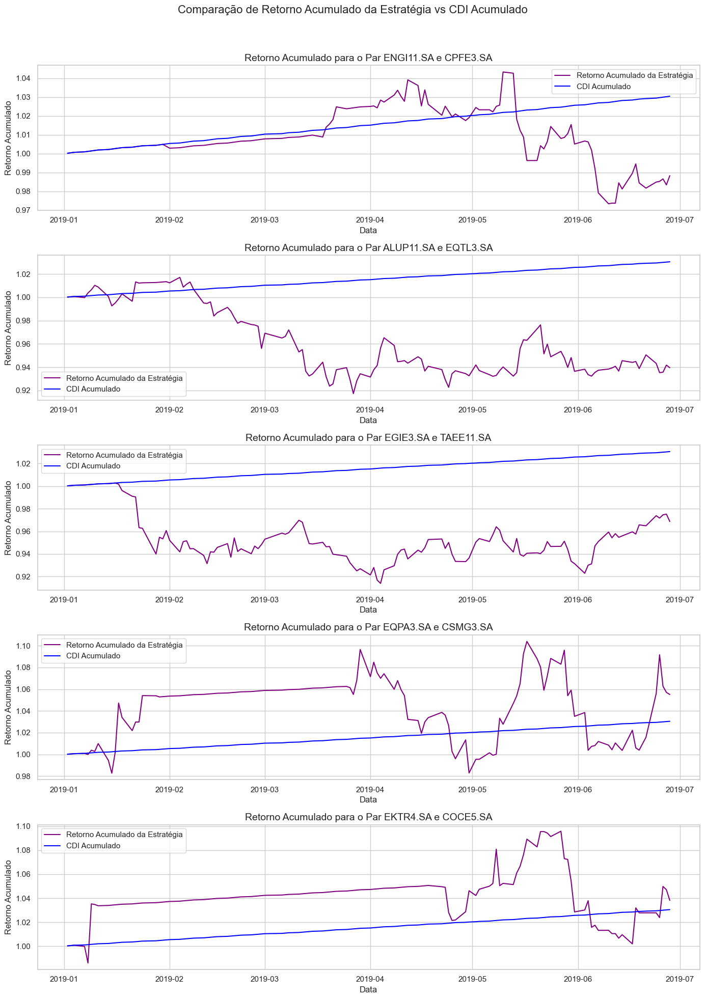

In [17]:
# Definindo a quantidade de pares que queremos visualizar (ajuste conforme necessário)
num_pares_visualizar = 5

# Criando subplots para visualizar as curvas de equity dos primeiros pares cointegrados
fig, ax = plt.subplots(num_pares_visualizar, 1, figsize=(14, 4 * num_pares_visualizar))
fig.suptitle("Comparação de Retorno Acumulado da Estratégia vs CDI Acumulado", fontsize=16)

# Iterando sobre os pares e plotando
for i, (acao1, acao2, z_score_trading, resultado) in enumerate(resultados_retornos_1[:num_pares_visualizar]):
    # Plotando o Retorno Acumulado Conjunto e CDI Acumulado
    ax[i].plot(resultado.index, resultado['Retorno Acumulado Conjunto'], color='purple', label='Retorno Acumulado da Estratégia')
    ax[i].plot(resultado.index, resultado['CDI Acumulado'], color='blue', label='CDI Acumulado')
    
    # Título e configurações do gráfico
    ax[i].set_title(f"Retorno Acumulado para o Par {acao1} e {acao2}", fontsize=14)
    ax[i].set_xlabel("Data")
    ax[i].set_ylabel("Retorno Acumulado")
    ax[i].legend()

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

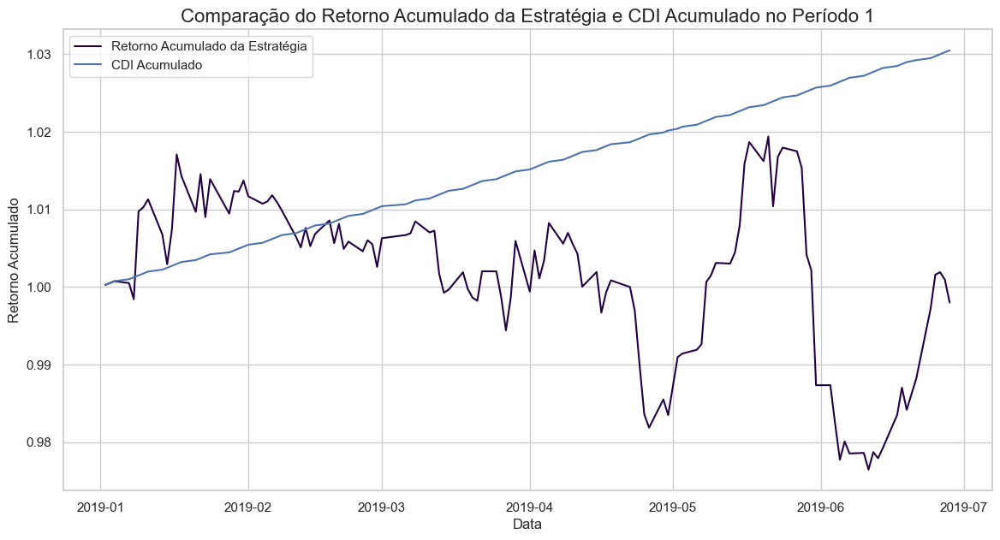

In [18]:
# Plotando o gráfico de comparação
plt.figure(figsize=(14, 7))

# Plotando a curva de Retorno Acumulado da Estratégia
plt.plot(resultado_retornos_periodo_1.index, resultado_retornos_periodo_1['Retorno Acumulado da Estratégia'], label='Retorno Acumulado da Estratégia', color='#220042')

# Plotando a curva de CDI Acumulado
plt.plot(resultado_retornos_periodo_1.index, resultado_retornos_periodo_1['CDI Acumulado'], label='CDI Acumulado', color='b')

# Configurando o título e os rótulos
plt.title('Comparação do Retorno Acumulado da Estratégia e CDI Acumulado no Período 1', fontsize=16)
plt.xlabel('Data', fontsize=12)
plt.ylabel('Retorno Acumulado', fontsize=12)
plt.legend()

# Exibindo o gráfico
plt.show()

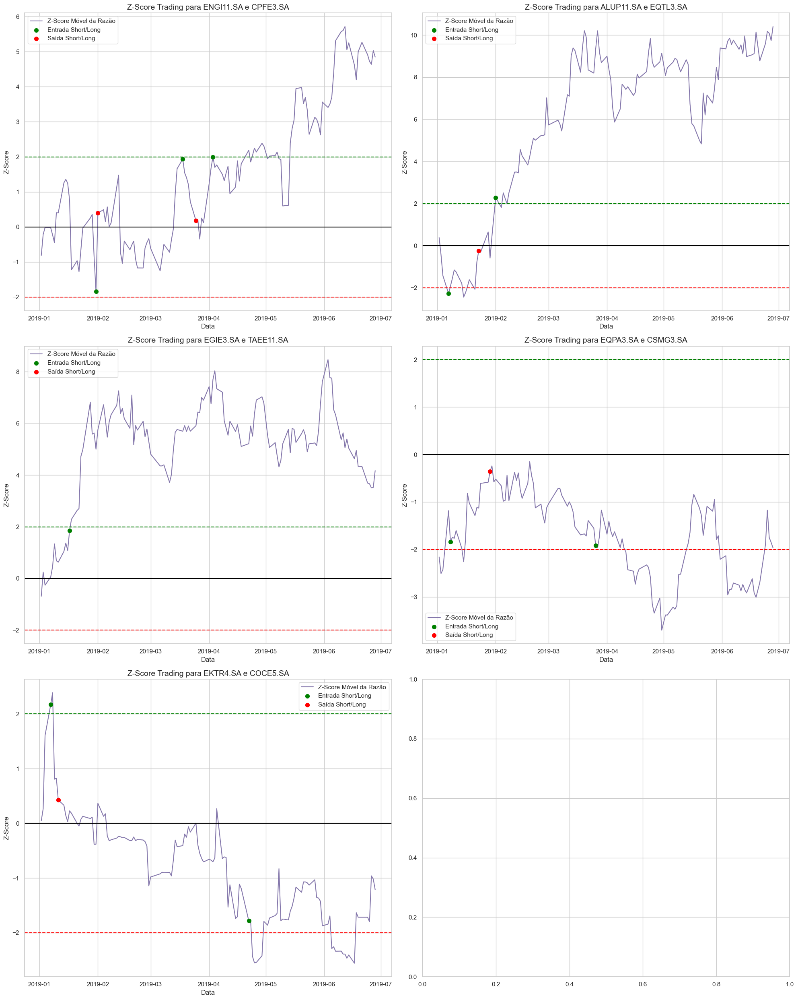

In [19]:
# Criando subplots para visualizar os gráficos de z-score com entradas e saídas para cada par
fig, ax = plt.subplots(3, 2, figsize=(20, 25))  # Ajuste conforme a quantidade de pares

# Iterando sobre os pares em resultados_retornos_1
for i, (acao1, acao2, z_score_trading, resultado) in enumerate(resultados_retornos_1):
    # Determinando a posição do gráfico (linha e coluna)
    row = i // 2
    col = i % 2

    # Plotando o z-score trading
    ax[row, col].plot(z_score_trading.index, z_score_trading, color='#8477ab', label='Z-Score Móvel da Razão', zorder=1)

    # Adicionando as linhas de referência
    ax[row, col].axhline(0, color='black', zorder=2)
    ax[row, col].axhline(2.0, color='green', linestyle='--', zorder=2)
    ax[row, col].axhline(-2.0, color='red', linestyle='--', zorder=2)

    # Adicionando pontos verdes para Entrada Short e Long
    entradas_short = resultado[resultado['Entrada Short']]
    entradas_long = resultado[resultado['Entrada Long']]
    ax[row, col].scatter(entradas_short.index, z_score_trading.loc[entradas_short.index], color='green', s=50, label='Entrada Short/Long', zorder=3)
    ax[row, col].scatter(entradas_long.index, z_score_trading.loc[entradas_long.index], color='green', s=50, zorder=3)

    # Adicionando pontos vermelhos para Saída Short e Long
    saidas_short = resultado[resultado['Saida Short']]
    saidas_long = resultado[resultado['Saida Long']]
    ax[row, col].scatter(saidas_short.index, z_score_trading.loc[saidas_short.index], color='red', s=50, label='Saída Short/Long', zorder=3)
    ax[row, col].scatter(saidas_long.index, z_score_trading.loc[saidas_long.index], color='red', s=50, zorder=3)

    # Configurando os detalhes do gráfico
    ax[row, col].set_title(f"Z-Score Trading para {acao1} e {acao2}", fontsize=14)
    ax[row, col].set_xlabel("Data")
    ax[row, col].set_ylabel("Z-Score")
    ax[row, col].legend()

# Ajustando o layout para evitar sobreposição
plt.tight_layout()
plt.show()

### **2.2. Período 2**

#### **2.2.1. Cotações das Ações**

In [20]:
cotacoes_formacao_2 = yf.download(acoes_escolhidas, start='2018-07-01', end='2019-06-30')['Adj Close']
cotacoes_trading_2 = yf.download(acoes_escolhidas, start='2019-07-01', end='2019-12-31')['Adj Close']

[*********************100%%**********************]  26 of 26 completed

3 Failed downloads:
['TRPL4.SA']: Exception('%ticker%: No data found, symbol may be delisted')
['AMBP3.SA', 'NEOE3.SA']: Exception("%ticker%: Data doesn't exist for startDate = 1530414000, endDate = 1561863600")
[*********************100%%**********************]  26 of 26 completed

2 Failed downloads:
['TRPL4.SA']: Exception('%ticker%: No data found, symbol may be delisted')
['AMBP3.SA']: Exception("%ticker%: Data doesn't exist for startDate = 1561950000, endDate = 1577761200")


In [21]:
cotacoes_formacao_2 = cotacoes_formacao_2.dropna(axis=1)
cotacoes_trading_2 = cotacoes_trading_2.dropna(axis=1)

In [22]:
# Garantindo que ambos os períodos tenham as mesmas colunas
acoes_intersecao_2 = cotacoes_formacao_2.columns.intersection(cotacoes_trading_2.columns)
cotacoes_formacao_2 = cotacoes_formacao_2[acoes_intersecao_2]
cotacoes_trading_2 = cotacoes_trading_2[acoes_intersecao_2]

# Exibindo as colunas restantes para confirmação
cotacoes_formacao_2.columns, cotacoes_trading_2.columns

(Index(['ALUP11.SA', 'CEBR3.SA', 'CGAS3.SA', 'CLSC4.SA', 'CMIG4.SA', 'COCE5.SA',
        'CPFE3.SA', 'CPLE6.SA', 'CSMG3.SA', 'EGIE3.SA', 'EKTR4.SA', 'ELET3.SA',
        'EMAE4.SA', 'ENEV3.SA', 'ENGI11.SA', 'EQPA3.SA', 'EQTL3.SA', 'GEPA4.SA',
        'LIGT3.SA', 'REDE3.SA', 'SAPR11.SA', 'SBSP3.SA', 'TAEE11.SA'],
       dtype='object', name='Ticker'),
 Index(['ALUP11.SA', 'CEBR3.SA', 'CGAS3.SA', 'CLSC4.SA', 'CMIG4.SA', 'COCE5.SA',
        'CPFE3.SA', 'CPLE6.SA', 'CSMG3.SA', 'EGIE3.SA', 'EKTR4.SA', 'ELET3.SA',
        'EMAE4.SA', 'ENEV3.SA', 'ENGI11.SA', 'EQPA3.SA', 'EQTL3.SA', 'GEPA4.SA',
        'LIGT3.SA', 'REDE3.SA', 'SAPR11.SA', 'SBSP3.SA', 'TAEE11.SA'],
       dtype='object', name='Ticker'))

In [23]:
# Calculando os retornos cumulativos normalizados para o período de formação
cumret_formacao_2 = np.log(cotacoes_formacao_2).diff().cumsum() + 1
cumret_formacao_2.dropna(inplace=True)

# Calculando os retornos cumulativos normalizados para o período de trading
cumret_trading_2 = np.log(cotacoes_trading_2).diff().cumsum() + 1
cumret_trading_2.dropna(inplace=True)

#### **2.2.2. Dados do CDI**

In [24]:
cdi_trading_2 = sgs.get({'CDI': 12}, start='2019-07-01', end='2019-12-31')

# Convertendo o CDI de % diária para formato decimal
cdi_trading_2['CDI'] = cdi_trading_2['CDI'] / 100

# Ajustando o índice para ser compatível com os resultados da estratégia
cdi_trading_2.index = pd.to_datetime(cdi_trading_2.index)

indices_trading_2 = pd.DataFrame(index = cotacoes_trading_2.index)
indices_trading_2['CDI'] = cdi_trading_2['CDI']

#### **2.2.3. Seleção de Pares**

In [25]:
# Exemplo de uso com cotacoes_formacao_1
# Usando preços ajustados para o teste de cointegração
pares_cointegrados_2 = test_cointegration(cotacoes_formacao_2)

# Selecionar os 5 pares cointegrados com menores distâncias
top_pairs_2 = select_top_pairs(pares_cointegrados_2, cotacoes_formacao_2, top_n=5)

# Exibir resultados
print("Top 5 pares cointegrados com menores distâncias:")
for s1, s2, p_value, distance in top_pairs_2:
    print(f"{s1} - {s2} | p-valor: {p_value:.4f} | Distância Euclidiana: {distance:.4f}")

Top 5 pares cointegrados com menores distâncias:
ENGI11.SA - TAEE11.SA | p-valor: 0.0275 | Distância Euclidiana: 0.6882
CPFE3.SA - TAEE11.SA | p-valor: 0.0293 | Distância Euclidiana: 0.8761
CSMG3.SA - TAEE11.SA | p-valor: 0.0069 | Distância Euclidiana: 0.9517
EQTL3.SA - TAEE11.SA | p-valor: 0.0237 | Distância Euclidiana: 0.9713
CSMG3.SA - ENGI11.SA | p-valor: 0.0184 | Distância Euclidiana: 1.1216


#### **2.1.4. Calculando os Spreads**

In [26]:
# Lista para armazenar os resultados dos spreads no período de trading
resultados_spreads_trading_2 = []

# Iterando sobre os pares selecionados no 'top_pairs'
for s1, s2, p_value, distance in top_pairs_2:
    # Calculando o spread no período de formação para estimar alpha e beta
    serie1_formacao = cotacoes_formacao_2[s1]
    serie2_formacao = cotacoes_formacao_2[s2]
    spread_formacao, alpha, beta = calcular_spread(serie1_formacao, serie2_formacao)
    
    # Calculando o spread no período de trading usando os valores de alpha e beta do período de formação
    serie1_trading = cotacoes_trading_2[s1]
    serie2_trading = cotacoes_trading_2[s2]
    spread_trading = serie1_trading - (alpha + beta * serie2_trading)
    
    # Armazenando os resultados para o período de trading
    media_spread = spread_formacao.mean()
    desvio_spread = spread_formacao.std()
    resultados_spreads_trading_2.append((s1, s2, spread_trading, alpha, beta, media_spread, desvio_spread))

# Exibindo um exemplo dos resultados para verificação
for resultado in resultados_spreads_trading_2[:5]:  # Mostrando apenas os 5 primeiros pares para verificação
    print(f"Par: {resultado[0]} - {resultado[1]}")
    print(f"Alpha: {resultado[3]:.4f}, Beta: {resultado[4]:.4f}")
    print(f"Média do Spread de Formação: {resultado[5]:.4f}, Desvio Padrão do Spread de Formação: {resultado[6]:.4f}")
    print(f"Spread de Trading (primeiros valores):\n{resultado[2].head()}\n")

Par: ENGI11.SA - TAEE11.SA
Alpha: -3.2168, Beta: 2.4685
Média do Spread de Formação: -0.0000, Desvio Padrão do Spread de Formação: 1.0257
Spread de Trading (primeiros valores):
Date
2019-07-01    0.445583
2019-07-02    0.186305
2019-07-03    0.467516
2019-07-04    1.118344
2019-07-05    0.188831
dtype: float64

Par: CPFE3.SA - TAEE11.SA
Alpha: 2.3469, Beta: 1.2166
Média do Spread de Formação: -0.0000, Desvio Padrão do Spread de Formação: 0.7336
Spread de Trading (primeiros valores):
Date
2019-07-01   -0.990238
2019-07-02   -1.024786
2019-07-03   -0.609617
2019-07-04   -0.467097
2019-07-05   -0.652582
dtype: float64

Par: CSMG3.SA - TAEE11.SA
Alpha: -2.8339, Beta: 0.9837
Média do Spread de Formação: -0.0000, Desvio Padrão do Spread de Formação: 0.4480
Spread de Trading (primeiros valores):
Date
2019-07-01   -0.111557
2019-07-02   -0.038953
2019-07-03   -0.265578
2019-07-04   -0.413173
2019-07-05   -0.519350
dtype: float64

Par: EQTL3.SA - TAEE11.SA
Alpha: -1.3912, Beta: 1.0959
Média do 

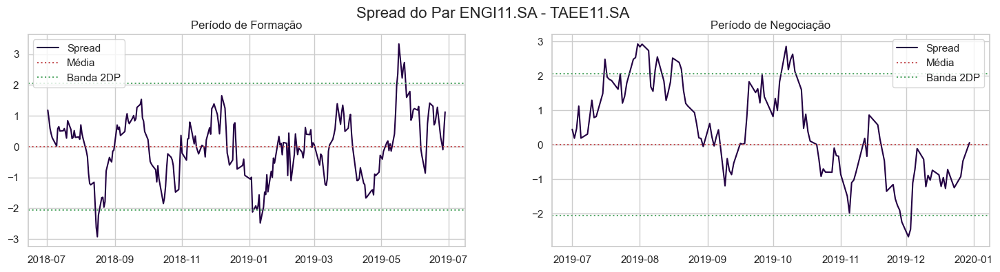

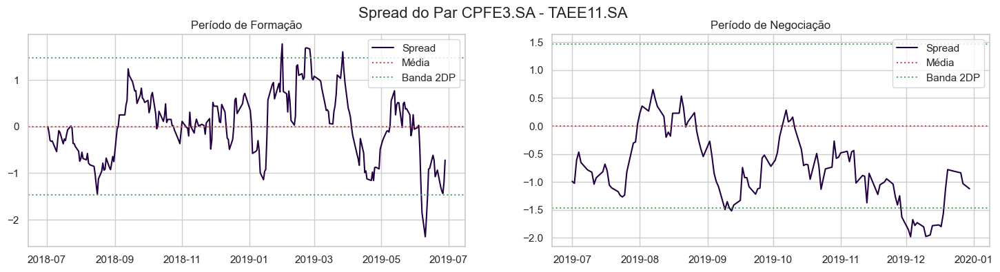

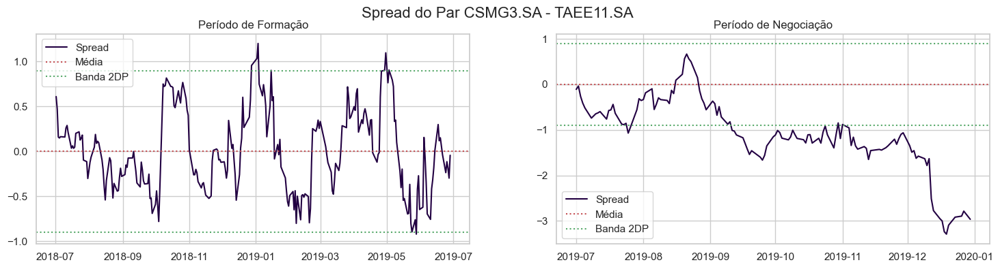

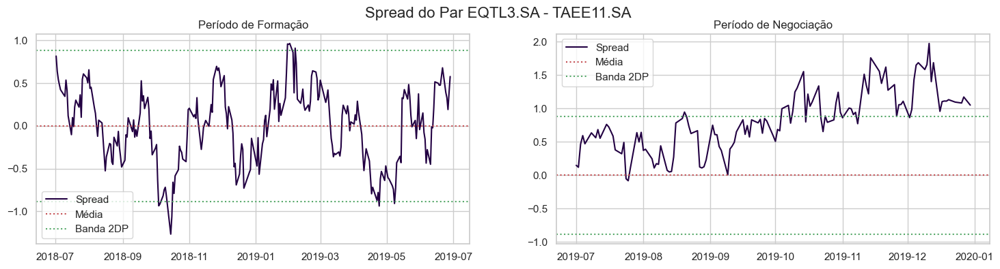

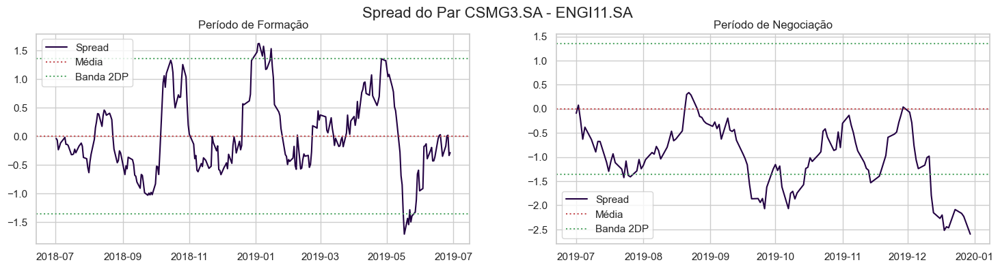

In [27]:
def plot_spreads(resultados_spreads_trading):
    """
    Plota os spreads de formação e de negociação para os pares selecionados.
    """
    for s1, s2, spread_trading, alpha, beta, media_spread, desvio_spread in resultados_spreads_trading:
        # Calculando o spread para o período de formação usando os valores armazenados
        spread_formacao = cotacoes_formacao_2[s1] - (alpha + beta * cotacoes_formacao_2[s2])

        # Criando gráficos lado a lado
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 4))
        fig.suptitle(f'Spread do Par {s1} - {s2}', fontsize=16)

        # Período de formação
        ax1.plot(spread_formacao, label='Spread', color='#220042')
        ax1.axhline(y=media_spread, color='r', linestyle='dotted', label='Média')
        ax1.axhline(y=media_spread + 2 * desvio_spread, color='g', linestyle='dotted', label='Banda 2DP')
        ax1.axhline(y=media_spread - 2 * desvio_spread, color='g', linestyle='dotted')
        ax1.set_title('Período de Formação')
        ax1.legend()

        # Período de negociação
        ax2.plot(spread_trading, label='Spread', color='#220042')
        ax2.axhline(y=media_spread, color='r', linestyle='dotted', label='Média')
        ax2.axhline(y=media_spread + 2 * desvio_spread, color='g', linestyle='dotted', label='Banda 2DP')
        ax2.axhline(y=media_spread - 2 * desvio_spread, color='g', linestyle='dotted')
        ax2.set_title('Período de Negociação')
        ax2.legend()

        plt.show()

#Chamando a função para os pares em resultados_spreads_trading_1
plot_spreads(resultados_spreads_trading_2)

#### **2.2.5. Definindo os Sinais da Estratégia**

In [28]:
# Lista para armazenar os resultados dos Z-scores no período de trading
resultados_z_scores_trading_2 = []

# Calculando os Z-scores para cada par no período de trading
for acao1, acao2, spread_trading, alpha, beta, media_spread, desvio_spread in resultados_spreads_trading_2:
    
    # Calculando o Z-score diário
    z_score_trading = (spread_trading - media_spread) / desvio_spread
    
    # Armazenando os resultados
    resultados_z_scores_trading_2.append((acao1, acao2, z_score_trading))

    # Exibindo um resumo do Z-score para conferência
    print(f"Par: {acao1} e {acao2} - Média do Z-score: {z_score_trading.mean():.4f}, Desvio Padrão do Z-score: {z_score_trading.std():.4f}\n")

Par: ENGI11.SA e TAEE11.SA - Média do Z-score: 0.4418, Desvio Padrão do Z-score: 1.3165

Par: CPFE3.SA e TAEE11.SA - Média do Z-score: -1.0298, Desvio Padrão do Z-score: 0.8532

Par: CSMG3.SA e TAEE11.SA - Média do Z-score: -2.3700, Desvio Padrão do Z-score: 1.7565

Par: EQTL3.SA e TAEE11.SA - Média do Z-score: 1.8130, Desvio Padrão do Z-score: 1.0036

Par: CSMG3.SA e ENGI11.SA - Média do Z-score: -1.4458, Desvio Padrão do Z-score: 0.9737



In [29]:
sinais_trade_list_2 = []

for acao1, acao2, z_score_trading in resultados_z_scores_trading_2:
    sinais_trade = pd.DataFrame(index=z_score_trading.index)
    sinais_trade[f'Preços {acao1}'] = cotacoes_trading_2[acao1]
    sinais_trade[f'Preços {acao2}'] = cotacoes_trading_2[acao2]

    posicao_short_ativa = False
    posicao_long_ativa = False

    entradas_short = []
    entradas_long = []
    saidas_short = []
    saidas_long = []

    for i in range(len(sinais_trade)):
        if not posicao_short_ativa and not posicao_long_ativa:
            if (z_score_trading.iloc[i] > sinal_entrada) and (z_score_trading.shift(1).iloc[i] < sinal_entrada):
                entradas_short.append(True)
                entradas_long.append(False)
                posicao_short_ativa = True
            elif (z_score_trading.iloc[i] < -sinal_entrada) and (z_score_trading.shift(1).iloc[i] > -sinal_entrada):
                entradas_long.append(True)
                entradas_short.append(False)
                posicao_long_ativa = True
            else:
                entradas_short.append(False)
                entradas_long.append(False)
        else:
            entradas_short.append(False)
            entradas_long.append(False)

        if posicao_short_ativa:
            saida = (z_score_trading.iloc[i] < sinal_saida) and (z_score_trading.shift(1).iloc[i] > sinal_saida)
            saidas_short.append(saida)
            saidas_long.append(False)
            if saida:
                posicao_short_ativa = False
        elif posicao_long_ativa:
            saida = (z_score_trading.iloc[i] > -sinal_saida) and (z_score_trading.shift(1).iloc[i] < -sinal_saida)
            saidas_long.append(saida)
            saidas_short.append(False)
            if saida:
                posicao_long_ativa = False
        else:
            saidas_short.append(False)
            saidas_long.append(False)

    sinais_trade['Entrada Short'] = entradas_short
    sinais_trade['Entrada Long'] = entradas_long
    sinais_trade['Saida Short'] = saidas_short
    sinais_trade['Saida Long'] = saidas_long

    sinais_trade_list_2.append((acao1, acao2, z_score_trading, sinais_trade))

#### **2.2.6. Calculando os Retornos**

In [30]:
# Lista para armazenar os resultados do backtest de todos os pares
resultado_backtest_todos_pares_2 = []

# Iterando sobre cada par e seus sinais de trade
for acao1, acao2, z_score_trading, sinais_trade in sinais_trade_list_2:
    # Criando um DataFrame para armazenar os resultados de retorno
    resultado = pd.DataFrame(index = sinais_trade.index)
    resultado[f'{acao1}'] = cotacoes_trading_2[acao1]
    resultado[f'{acao2}'] = cotacoes_trading_2[acao2]
    resultado['CDI'] = indices_trading_2['CDI']
    resultado['Entrada Short'] = sinais_trade['Entrada Short']
    resultado['Saida Short'] = sinais_trade['Saida Short']
    resultado['Entrada Long'] = sinais_trade['Entrada Long']
    resultado['Saida Long'] = sinais_trade['Saida Long']

    # Inicializando colunas de retorno
    retorno_acao1 = []
    retorno_acao2 = []

    # Inicializando variáveis de controle de posição
    posicao_short_ativa = False
    posicao_long_ativa = False

    # Iterando sobre as datas do DataFrame
    for i in range(len(sinais_trade)):
        if sinais_trade['Entrada Short'].iloc[i]:
            # Entrada Short: registrar o custo de transação inicial
            posicao_short_ativa = True
            retorno_acao1.append(-0.001)
            retorno_acao2.append(-0.001)
        elif sinais_trade['Entrada Long'].iloc[i]:
            # Entrada Long: registrar o custo de transação inicial
            posicao_long_ativa = True
            retorno_acao1.append(-0.001)
            retorno_acao2.append(-0.001)
        elif posicao_short_ativa:
            if sinais_trade['Saida Short'].iloc[i]:
                # Saída Short: registrar o custo de transação de saída
                retorno_acao1.append(-0.001)
                retorno_acao2.append(-0.001)
                posicao_short_ativa = False  # Fechar posição
            else:
                # Retorno diário em uma posição Short
                retorno_acao1.append(-(cotacoes_trading_2[acao1].iloc[i] / cotacoes_trading_2[acao1].iloc[i-1] - 1))
                retorno_acao2.append(cotacoes_trading_2[acao2].iloc[i] / cotacoes_trading_2[acao2].iloc[i-1] - 1)
        elif posicao_long_ativa:
            if sinais_trade['Saida Long'].iloc[i]:
                # Saída Long: registrar o custo de transação de saída
                retorno_acao1.append(-0.001)
                retorno_acao2.append(-0.001)
                posicao_long_ativa = False  # Fechar posição
            else:
                # Retorno diário em uma posição Long
                retorno_acao1.append(cotacoes_trading_2[acao1].iloc[i] / cotacoes_trading_2[acao1].iloc[i-1] - 1)
                retorno_acao2.append(-(cotacoes_trading_2[acao2].iloc[i] / cotacoes_trading_2[acao2].iloc[i-1] - 1))
        else:
            # Nenhuma posição ativa
            retorno_acao1.append(resultado['CDI'].iloc[i])
            retorno_acao2.append(resultado['CDI'].iloc[i])

    # Adicionando as colunas de retorno ao DataFrame
    resultado[f"Retorno {acao1}"] = retorno_acao1
    resultado[f"Retorno {acao2}"] = retorno_acao2

    # Adicionando o DataFrame de resultados para cada par à lista
    resultado_backtest_todos_pares_2.append((acao1, acao2, z_score_trading, resultado))

In [31]:
# Lista para armazenar os retornos acumulados de cada par e da estratégia conjunta
resultados_retornos_2 = []

# Iterando sobre cada resultado do backtest em resultado_backtest_todos_pares
for acao1, acao2, z_score_trading, resultado in resultado_backtest_todos_pares_2:
    # Inicializando os retornos acumulados
    retorno_acumulado_acao1 = 1
    retorno_acumulado_acao2 = 1
    cdi_acumulado = 1
    retorno_acumulado_acao1_list = []
    retorno_acumulado_acao2_list = []
    cdi_acumulado_list = []
    retorno_acumulado_conjunto_list = []

    # Iterando sobre as datas do DataFrame para calcular os retornos acumulados
    for i in range(len(resultado)):
        # Calculando o retorno acumulado de nome1, nome2 e cdi
        retorno_acumulado_acao1 *= (1 + resultado[f"Retorno {acao1}"].iloc[i])
        retorno_acumulado_acao2 *= (1 + resultado[f"Retorno {acao2}"].iloc[i])
        cdi_acumulado *= (1 + resultado['CDI'].iloc[i])

        # Adicionando os valores à lista de retorno acumulado
        retorno_acumulado_acao1_list.append(retorno_acumulado_acao1)
        retorno_acumulado_acao2_list.append(retorno_acumulado_acao2)
        cdi_acumulado_list.append(cdi_acumulado)

        # Calculando o retorno acumulado conjunto (média dos acumulados)
        retorno_acumulado_conjunto = (retorno_acumulado_acao1 + retorno_acumulado_acao2) / 2
        retorno_acumulado_conjunto_list.append(retorno_acumulado_conjunto)

    # Adicionando os retornos acumulados ao DataFrame de resultado
    resultado[f"Retorno Acumulado {acao1}"] = retorno_acumulado_acao1_list
    resultado[f"Retorno Acumulado {acao2}"] = retorno_acumulado_acao2_list
    resultado['CDI Acumulado'] = cdi_acumulado_list
    resultado['Retorno Acumulado Conjunto'] = retorno_acumulado_conjunto_list

    # Adicionando o resultado do par à lista de resultados acumulados
    resultados_retornos_2.append((acao1, acao2, z_score_trading, resultado))

In [32]:
# Inicializando um DataFrame vazio com o índice de datas baseado no primeiro resultado
resultado_retornos_periodo_2 = pd.DataFrame(index=resultados_retornos_2[0][3].index)

# Adicionando as colunas de retorno acumulado conjunto de cada par
for acao1, acao2, z_score_trading, resultado in resultados_retornos_2:
    coluna_nome = f"{acao1}-{acao2} Retorno Acumulado Conjunto"
    resultado_retornos_periodo_2[coluna_nome] = resultado['Retorno Acumulado Conjunto']

# Calculando a média dos retornos acumulados de todos os pares para criar a coluna 'Retorno Acumulado da Estratégia'
resultado_retornos_periodo_2['Retorno Acumulado da Estratégia'] = resultado_retornos_periodo_2.mean(axis=1)

# Adicionando a coluna de 'CDI Acumulado' para comparação
resultado_retornos_periodo_2['CDI Acumulado'] = resultados_retornos_2[0][3]['CDI Acumulado']

# Exibindo o DataFrame resultante
display(resultado_retornos_periodo_2)

,ENGI11.SA-TAEE11.SA Retorno Acumulado Conjunto,CPFE3.SA-TAEE11.SA Retorno Acumulado Conjunto,CSMG3.SA-TAEE11.SA Retorno Acumulado Conjunto,EQTL3.SA-TAEE11.SA Retorno Acumulado Conjunto,CSMG3.SA-ENGI11.SA Retorno Acumulado Conjunto,Retorno Acumulado da Estratégia,CDI Acumulado
Date,,,,,,,
2019-07-01,1.000246,1.000246,1.000246,1.000246,1.000246,1.000246,1.000246
2019-07-02,1.000492,1.000492,1.000492,1.000492,1.000492,1.000492,1.000492
2019-07-03,1.000739,1.000739,1.000739,1.000739,1.000739,1.000739,1.000739
2019-07-04,1.000985,1.000985,1.000985,1.000985,1.000985,1.000985,1.000985
2019-07-05,1.001232,1.001232,1.001232,1.001232,1.001232,1.001232,1.001232
...,...,...,...,...,...,...,...
2019-12-20,1.067400,1.055259,0.956921,0.997367,1.039583,1.023306,1.026495
2019-12-23,1.067582,1.055032,0.965546,0.998532,1.054526,1.028244,1.026670
2019-12-26,1.067765,1.055892,0.970838,0.999886,1.054489,1.029774,1.026846


#### **2.2.7. Visualizando os Retornos**

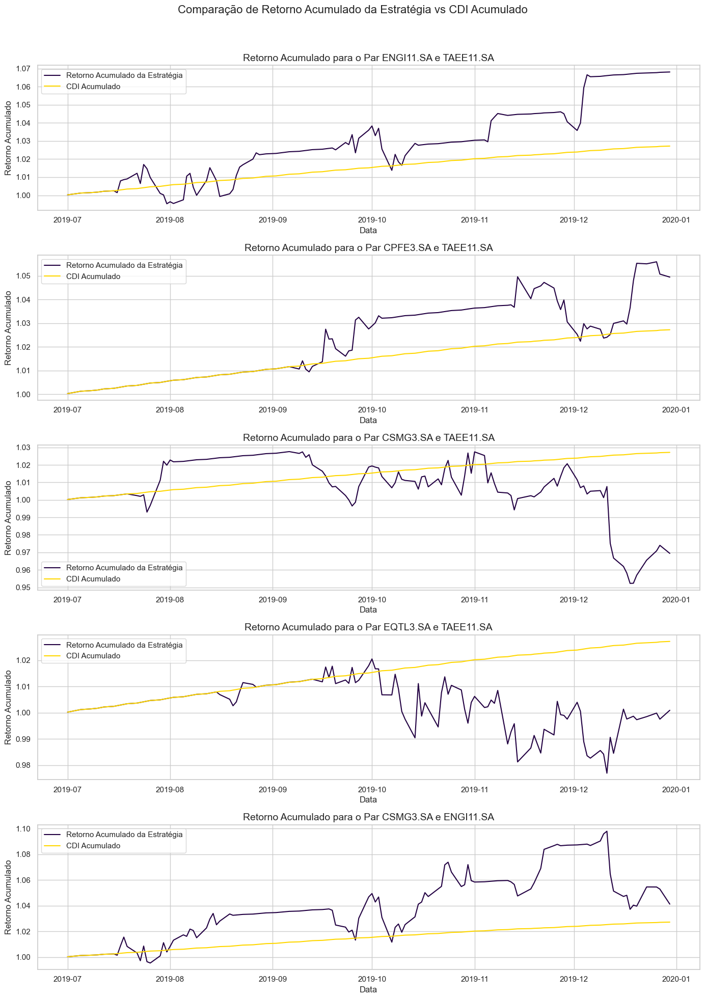

In [33]:
# Definindo a quantidade de pares que queremos visualizar (ajuste conforme necessário)
num_pares_visualizar = 5

# Criando subplots para visualizar as curvas de equity dos primeiros pares cointegrados
fig, ax = plt.subplots(num_pares_visualizar, 1, figsize=(14, 4 * num_pares_visualizar))
fig.suptitle("Comparação de Retorno Acumulado da Estratégia vs CDI Acumulado", fontsize=16)

# Iterando sobre os pares e plotando
for i, (acao1, acao2, z_score_trading, resultado) in enumerate(resultados_retornos_2[:num_pares_visualizar]):
    # Plotando o Retorno Acumulado Conjunto e CDI Acumulado
    ax[i].plot(resultado.index, resultado['Retorno Acumulado Conjunto'], color='#220042', label='Retorno Acumulado da Estratégia')
    ax[i].plot(resultado.index, resultado['CDI Acumulado'], color='gold', label='CDI Acumulado')
    
    # Título e configurações do gráfico
    ax[i].set_title(f"Retorno Acumulado para o Par {acao1} e {acao2}", fontsize=14)
    ax[i].set_xlabel("Data")
    ax[i].set_ylabel("Retorno Acumulado")
    ax[i].legend()

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

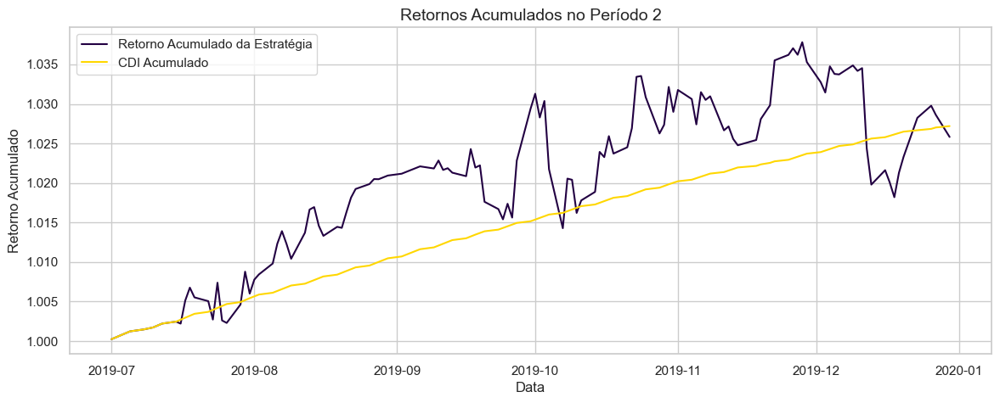

In [34]:
# Plotando o gráfico de comparação
plt.figure(figsize=(14, 5))

# Plotando a curva de Retorno Acumulado da Estratégia
plt.plot(resultado_retornos_periodo_2.index, resultado_retornos_periodo_2['Retorno Acumulado da Estratégia'], label='Retorno Acumulado da Estratégia', color='#220042')

# Plotando a curva de CDI Acumulado
plt.plot(resultado_retornos_periodo_2.index, resultado_retornos_periodo_2['CDI Acumulado'], label='CDI Acumulado', color='gold')

# Configurando o título e os rótulos
plt.title('Retornos Acumulados no Período 2', fontsize=14)
plt.xlabel('Data', fontsize=12)
plt.ylabel('Retorno Acumulado', fontsize=12)
plt.legend()

# Exibindo o gráfico
plt.show()

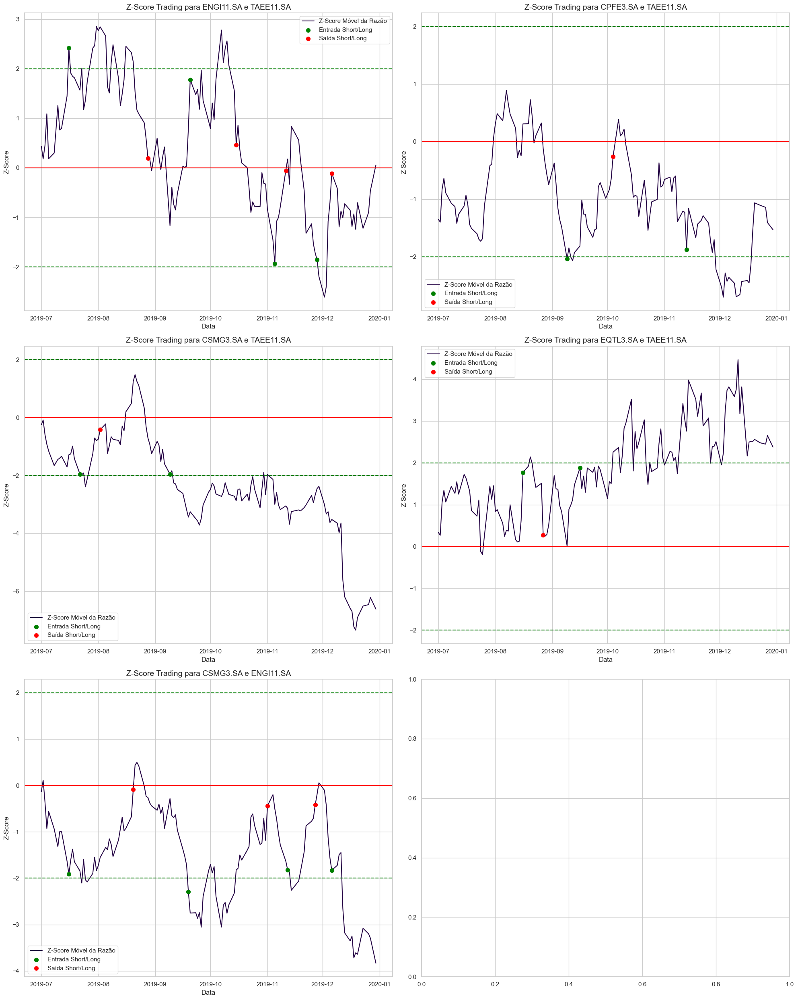

In [35]:
# Criando subplots para visualizar os gráficos de z-score com entradas e saídas para cada par
fig, ax = plt.subplots(3, 2, figsize=(20, 25))  # Ajuste conforme a quantidade de pares

# Iterando sobre os pares em resultados_retornos_1
for i, (acao1, acao2, z_score_trading, resultado) in enumerate(resultados_retornos_2):
    # Determinando a posição do gráfico (linha e coluna)
    row = i // 2
    col = i % 2

    # Plotando o z-score trading
    ax[row, col].plot(z_score_trading.index, z_score_trading, color='#220042', label='Z-Score Móvel da Razão', zorder=1)

    # Adicionando as linhas de referência
    ax[row, col].axhline(0, color='red', zorder=2)
    ax[row, col].axhline(2.0, color='green', linestyle='--', zorder=2)
    ax[row, col].axhline(-2.0, color='green', linestyle='--', zorder=2)

    # Adicionando pontos verdes para Entrada Short e Long
    entradas_short = resultado[resultado['Entrada Short']]
    entradas_long = resultado[resultado['Entrada Long']]
    ax[row, col].scatter(entradas_short.index, z_score_trading.loc[entradas_short.index], color='green', s=50, label='Entrada Short/Long', zorder=3)
    ax[row, col].scatter(entradas_long.index, z_score_trading.loc[entradas_long.index], color='green', s=50, zorder=3)

    # Adicionando pontos vermelhos para Saída Short e Long
    saidas_short = resultado[resultado['Saida Short']]
    saidas_long = resultado[resultado['Saida Long']]
    ax[row, col].scatter(saidas_short.index, z_score_trading.loc[saidas_short.index], color='red', s=50, label='Saída Short/Long', zorder=3)
    ax[row, col].scatter(saidas_long.index, z_score_trading.loc[saidas_long.index], color='red', s=50, zorder=3)

    # Configurando os detalhes do gráfico
    ax[row, col].set_title(f"Z-Score Trading para {acao1} e {acao2}", fontsize=14)
    ax[row, col].set_xlabel("Data")
    ax[row, col].set_ylabel("Z-Score")
    ax[row, col].legend()

# Ajustando o layout para evitar sobreposição
plt.tight_layout()
plt.show()

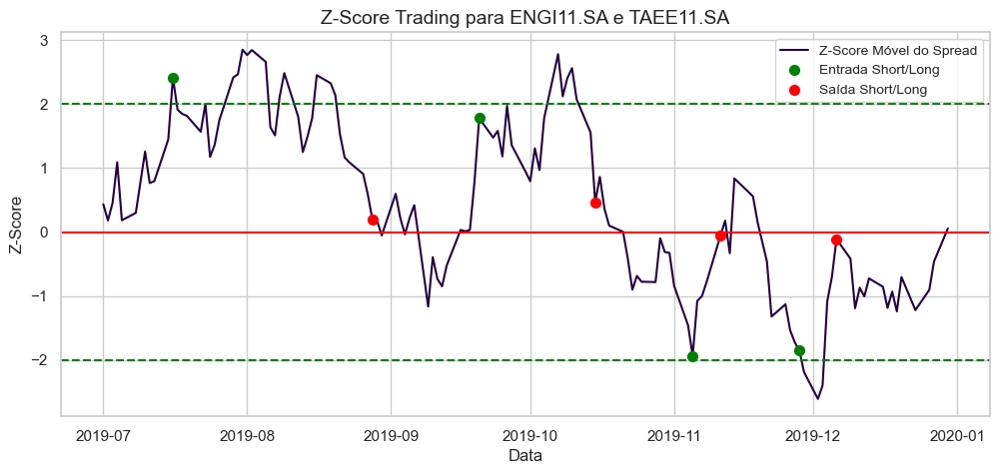

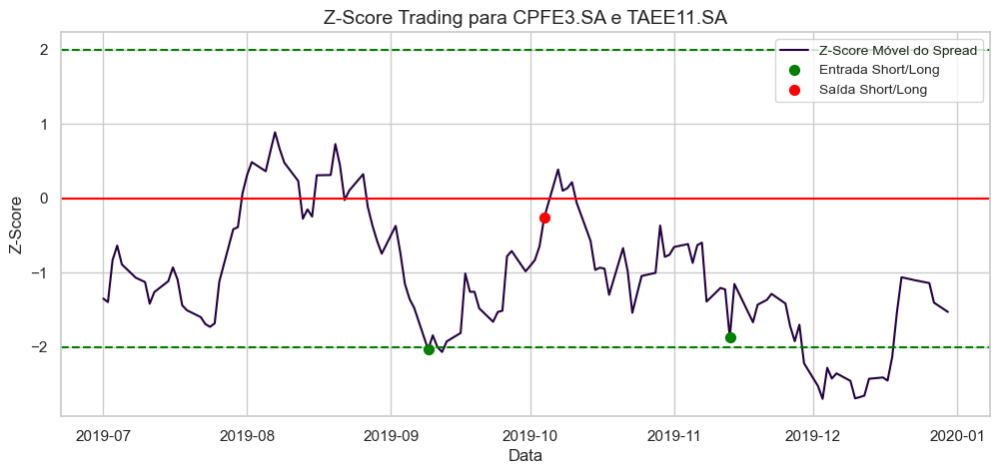

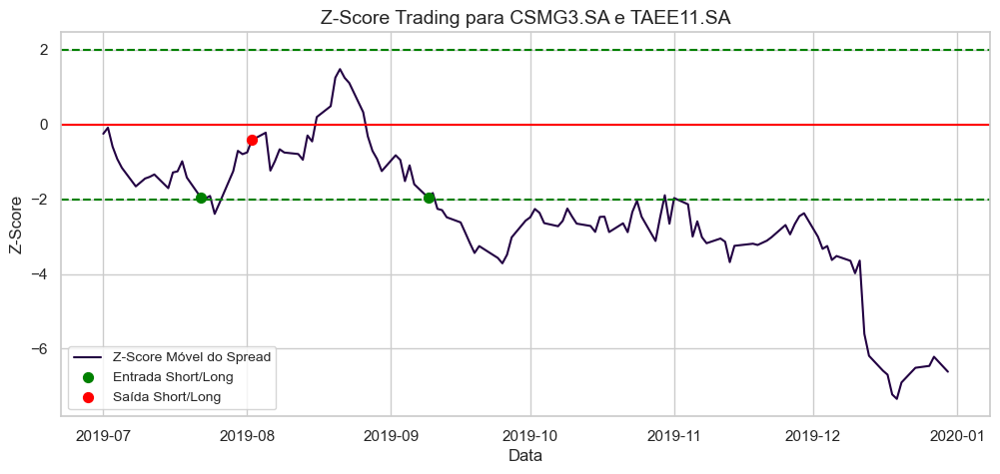

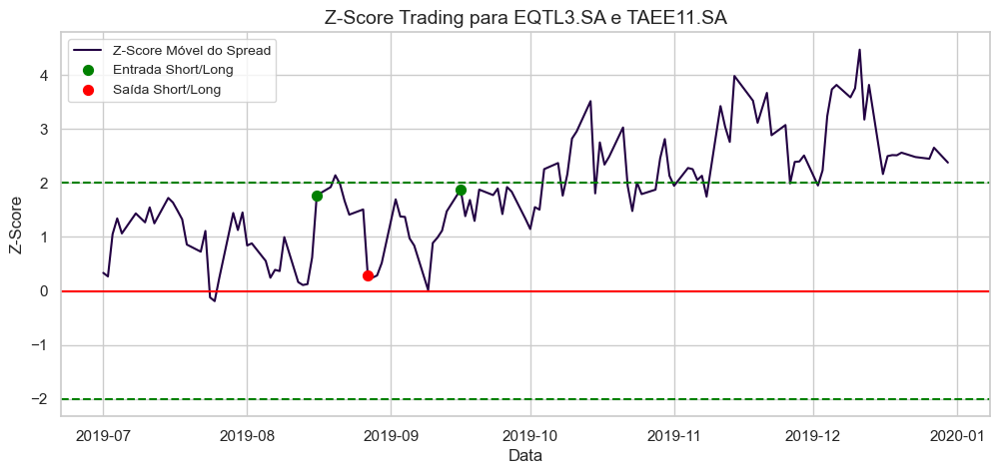

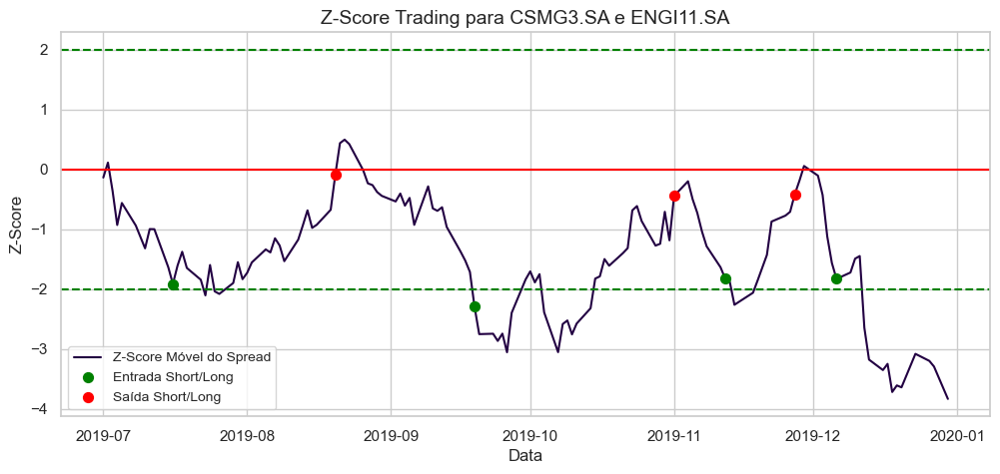

In [36]:
# Iterando sobre os pares em resultados_retornos_2
for i, (acao1, acao2, z_score_trading, resultado) in enumerate(resultados_retornos_2):
    # Criando um gráfico para cada par
    plt.figure(figsize=(12, 5))
    
    # Plotando o z-score trading
    plt.plot(z_score_trading.index, z_score_trading, color='#220042', label='Z-Score Móvel do Spread', zorder=1)

    # Adicionando as linhas de referência
    plt.axhline(0, color='red', zorder=2)
    plt.axhline(2.0, color='green', linestyle='--', zorder=2)
    plt.axhline(-2.0, color='green', linestyle='--', zorder=2)

    # Adicionando pontos verdes para Entrada Short e Long
    entradas_short = resultado[resultado['Entrada Short']]
    entradas_long = resultado[resultado['Entrada Long']]
    plt.scatter(entradas_short.index, z_score_trading.loc[entradas_short.index], color='green', s=50, label='Entrada Short/Long', zorder=3)
    plt.scatter(entradas_long.index, z_score_trading.loc[entradas_long.index], color='green', s=50, zorder=3)

    # Adicionando pontos vermelhos para Saída Short e Long
    saidas_short = resultado[resultado['Saida Short']]
    saidas_long = resultado[resultado['Saida Long']]
    plt.scatter(saidas_short.index, z_score_trading.loc[saidas_short.index], color='red', s=50, label='Saída Short/Long', zorder=3)
    plt.scatter(saidas_long.index, z_score_trading.loc[saidas_long.index], color='red', s=50, zorder=3)

    # Configurando os detalhes do gráfico
    plt.title(f"Z-Score Trading para {acao1} e {acao2}", fontsize=14)
    plt.xlabel("Data", fontsize=12)
    plt.ylabel("Z-Score", fontsize=12)
    plt.legend(fontsize=10)
    plt.grid(True)
    
    # Mostrando o gráfico
    plt.show()

In [37]:
resultados_retornos_2

[('ENGI11.SA',
  'TAEE11.SA',
  Date
  2019-07-01    0.434412
  2019-07-02    0.181635
  2019-07-03    0.455796
  2019-07-04    1.090307
  2019-07-05    0.184097
                  ...   
  2019-12-20   -0.702755
  2019-12-23   -1.218592
  2019-12-26   -0.902432
  2019-12-27   -0.461941
  2019-12-30    0.057180
  Length: 126, dtype: float64,
              ENGI11.SA  TAEE11.SA       CDI  Entrada Short  Saida Short  \
  Date                                                                     
  2019-07-01  36.939472  16.087135  0.000246          False        False   
  2019-07-02  36.680195  16.087135  0.000246          False        False   
  2019-07-03  37.352703  16.245653  0.000246          False        False   
  2019-07-04  38.162956  16.310238  0.000246          False        False   
  2019-07-05  37.595776  16.457022  0.000246          False        False   
  ...               ...        ...       ...            ...          ...   
  2019-12-20  42.270763  18.719408  0.000171     

### **2.3. Período 3**

#### **2.3.1. Cotações das Ações**

In [38]:
cotacoes_formacao_3 = yf.download(acoes_escolhidas, start='2019-01-01', end='2019-12-31')['Adj Close']
cotacoes_trading_3 = yf.download(acoes_escolhidas, start='2020-01-01', end='2020-06-30')['Adj Close']

[*********************100%%**********************]  26 of 26 completed

2 Failed downloads:
['TRPL4.SA']: Exception('%ticker%: No data found, symbol may be delisted')
['AMBP3.SA']: Exception("%ticker%: Data doesn't exist for startDate = 1546308000, endDate = 1577761200")
[*********************100%%**********************]  26 of 26 completed

2 Failed downloads:
['AMBP3.SA']: Exception("%ticker%: Data doesn't exist for startDate = 1577847600, endDate = 1593486000")
['TRPL4.SA']: Exception('%ticker%: No data found, symbol may be delisted')


In [39]:
cotacoes_formacao_3 = cotacoes_formacao_3.dropna(axis=1)
cotacoes_trading_3 = cotacoes_trading_3.dropna(axis=1)

In [40]:
# Garantindo que ambos os períodos tenham as mesmas colunas
acoes_intersecao_3 = cotacoes_formacao_3.columns.intersection(cotacoes_trading_3.columns)
cotacoes_formacao_3 = cotacoes_formacao_3[acoes_intersecao_3]
cotacoes_trading_3 = cotacoes_trading_3[acoes_intersecao_3]

# Exibindo as colunas restantes para confirmação
cotacoes_formacao_3.columns, cotacoes_trading_3.columns

(Index(['ALUP11.SA', 'CEBR3.SA', 'CGAS3.SA', 'CLSC4.SA', 'CMIG4.SA', 'COCE5.SA',
        'CPFE3.SA', 'CPLE6.SA', 'CSMG3.SA', 'EGIE3.SA', 'EKTR4.SA', 'ELET3.SA',
        'EMAE4.SA', 'ENEV3.SA', 'ENGI11.SA', 'EQPA3.SA', 'EQTL3.SA', 'GEPA4.SA',
        'LIGT3.SA', 'REDE3.SA', 'SAPR11.SA', 'SBSP3.SA', 'TAEE11.SA'],
       dtype='object', name='Ticker'),
 Index(['ALUP11.SA', 'CEBR3.SA', 'CGAS3.SA', 'CLSC4.SA', 'CMIG4.SA', 'COCE5.SA',
        'CPFE3.SA', 'CPLE6.SA', 'CSMG3.SA', 'EGIE3.SA', 'EKTR4.SA', 'ELET3.SA',
        'EMAE4.SA', 'ENEV3.SA', 'ENGI11.SA', 'EQPA3.SA', 'EQTL3.SA', 'GEPA4.SA',
        'LIGT3.SA', 'REDE3.SA', 'SAPR11.SA', 'SBSP3.SA', 'TAEE11.SA'],
       dtype='object', name='Ticker'))

In [41]:
# Calculando os retornos cumulativos normalizados para o período de formação
cumret_formacao_3 = np.log(cotacoes_formacao_3).diff().cumsum() + 1
cumret_formacao_3.dropna(inplace=True)

# Calculando os retornos cumulativos normalizados para o período de trading
cumret_trading_3 = np.log(cotacoes_trading_3).diff().cumsum() + 1
cumret_trading_3.dropna(inplace=True)

#### **2.3.2. Dados do CDI**

In [42]:
cdi_trading_3 = sgs.get({'CDI': 12}, start='2020-01-01', end='2020-06-30')

# Convertendo o CDI de % diária para formato decimal
cdi_trading_3['CDI'] = cdi_trading_3['CDI'] / 100

# Ajustando o índice para ser compatível com os resultados da estratégia
cdi_trading_3.index = pd.to_datetime(cdi_trading_3.index)

indices_trading_3 = pd.DataFrame(index = cotacoes_trading_3.index)
indices_trading_3['CDI'] = cdi_trading_3['CDI']

#### **2.3.3. Seleção de Pares**

In [43]:
# Usando preços ajustados para o teste de cointegração
pares_cointegrados_3 = test_cointegration(cotacoes_formacao_3)

# Selecionar os 5 pares cointegrados com menores distâncias
top_pairs_3 = select_top_pairs(pares_cointegrados_3, cotacoes_formacao_3, top_n=5)

# Exibir resultados
print("Top 5 pares cointegrados com menores distâncias:")
for s1, s2, p_value, distance in top_pairs_3:
    print(f"{s1} - {s2} | p-valor: {p_value:.4f} | Distância Euclidiana: {distance:.4f}")

Top 5 pares cointegrados com menores distâncias:
REDE3.SA - TAEE11.SA | p-valor: 0.0105 | Distância Euclidiana: 0.6284
ENGI11.SA - GEPA4.SA | p-valor: 0.0000 | Distância Euclidiana: 0.7532
CPFE3.SA - EKTR4.SA | p-valor: 0.0031 | Distância Euclidiana: 0.8769
CPFE3.SA - REDE3.SA | p-valor: 0.0443 | Distância Euclidiana: 0.9442
EQPA3.SA - TAEE11.SA | p-valor: 0.0470 | Distância Euclidiana: 0.9580


#### **2.3.4. Calculando os Spreads**

In [44]:
# Lista para armazenar os resultados dos spreads no período de trading
resultados_spreads_trading_3 = []

# Iterando sobre os pares selecionados no 'top_pairs'
for s1, s2, p_value, distance in top_pairs_3:
    # Calculando o spread no período de formação para estimar alpha e beta
    serie1_formacao = cotacoes_formacao_3[s1]
    serie2_formacao = cotacoes_formacao_3[s2]
    spread_formacao, alpha, beta = calcular_spread(serie1_formacao, serie2_formacao)
    
    # Calculando o spread no período de trading usando os valores de alpha e beta do período de formação
    serie1_trading = cotacoes_trading_3[s1]
    serie2_trading = cotacoes_trading_3[s2]
    spread_trading = serie1_trading - (alpha + beta * serie2_trading)
    
    # Armazenando os resultados para o período de trading
    media_spread = spread_formacao.mean()
    desvio_spread = spread_formacao.std()
    resultados_spreads_trading_3.append((s1, s2, spread_trading, alpha, beta, media_spread, desvio_spread))

# Exibindo um exemplo dos resultados para verificação
for resultado in resultados_spreads_trading_3[:5]:  # Mostrando apenas os 5 primeiros pares para verificação
    print(f"Par: {resultado[0]} - {resultado[1]}")
    print(f"Alpha: {resultado[3]:.4f}, Beta: {resultado[4]:.4f}")
    print(f"Média do Spread de Formação: {resultado[5]:.4f}, Desvio Padrão do Spread de Formação: {resultado[6]:.4f}")
    print(f"Spread de Trading (primeiros valores):\n{resultado[2].head()}\n")

Par: REDE3.SA - TAEE11.SA
Alpha: 0.6603, Beta: 0.2627
Média do Spread de Formação: 0.0000, Desvio Padrão do Spread de Formação: 0.1634
Spread de Trading (primeiros valores):
Date
2020-01-02    0.024528
2020-01-03    0.037664
2020-01-06    0.093222
2020-01-07    0.153246
2020-01-08    0.203536
dtype: float64

Par: ENGI11.SA - GEPA4.SA
Alpha: -7.1638, Beta: 1.8533
Média do Spread de Formação: -0.0000, Desvio Padrão do Spread de Formação: 1.1577
Spread de Trading (primeiros valores):
Date
2020-01-02   -2.284763
2020-01-03   -2.657029
2020-01-06   -3.856131
2020-01-07   -2.835024
2020-01-08   -4.431779
dtype: float64

Par: CPFE3.SA - EKTR4.SA
Alpha: 10.0804, Beta: 1.2053
Média do Spread de Formação: 0.0000, Desvio Padrão do Spread de Formação: 0.7579
Spread de Trading (primeiros valores):
Date
2020-01-02   -0.072319
2020-01-03    0.056461
2020-01-06   -0.002042
2020-01-07   -0.495601
2020-01-08   -0.647607
dtype: float64

Par: CPFE3.SA - REDE3.SA
Alpha: 10.2341, Beta: 2.3071
Média do Sprea

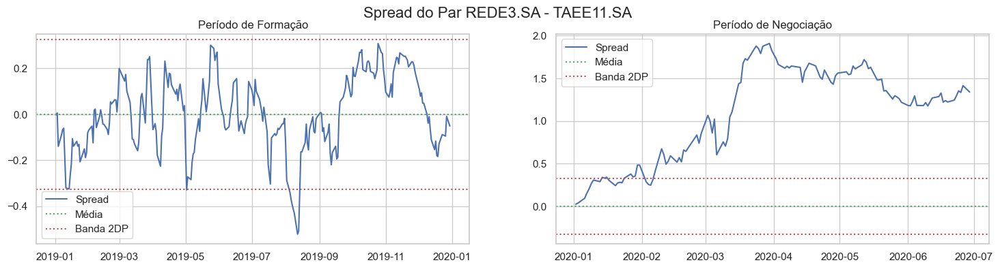

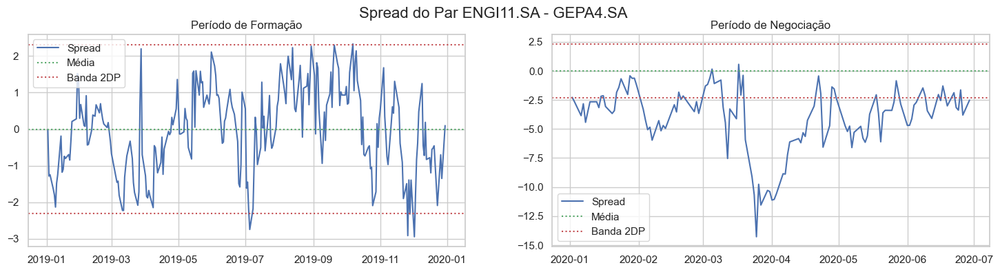

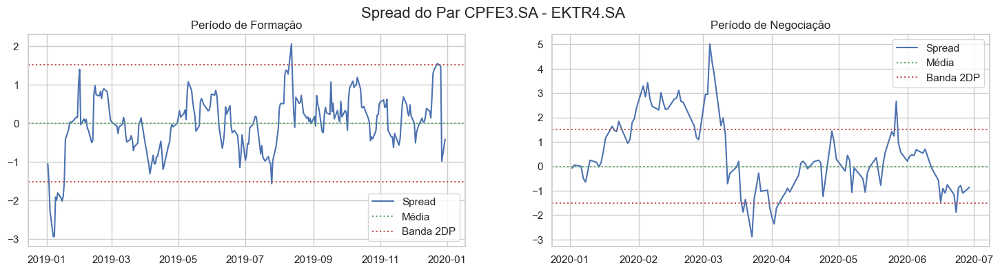

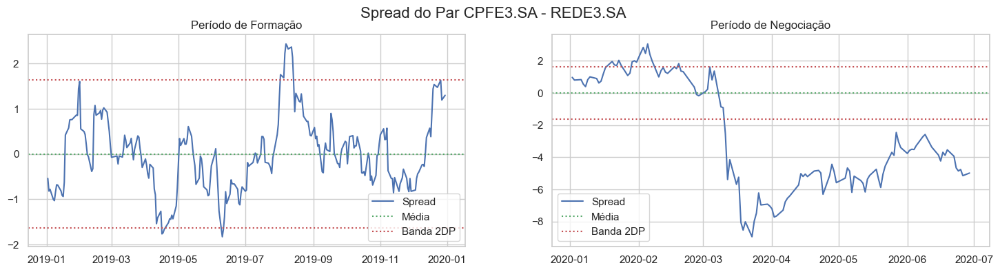

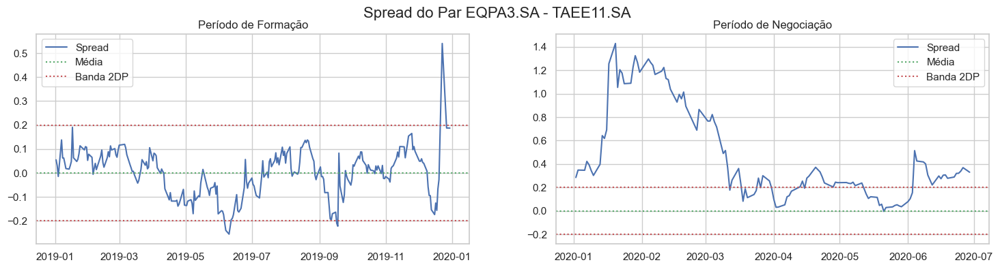

In [45]:
def plot_spreads(resultados_spreads_trading):
    """
    Plota os spreads de formação e de negociação para os pares selecionados.
    """
    for s1, s2, spread_trading, alpha, beta, media_spread, desvio_spread in resultados_spreads_trading:
        # Calculando o spread para o período de formação usando os valores armazenados
        spread_formacao = cotacoes_formacao_3[s1] - (alpha + beta * cotacoes_formacao_3[s2])

        # Criando gráficos lado a lado
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 4))
        fig.suptitle(f'Spread do Par {s1} - {s2}', fontsize=16)

        # Período de formação
        ax1.plot(spread_formacao, label='Spread')
        ax1.axhline(y=media_spread, color='g', linestyle='dotted', label='Média')
        ax1.axhline(y=media_spread + 2 * desvio_spread, color='r', linestyle='dotted', label='Banda 2DP')
        ax1.axhline(y=media_spread - 2 * desvio_spread, color='r', linestyle='dotted')
        ax1.set_title('Período de Formação')
        ax1.legend()

        # Período de negociação
        ax2.plot(spread_trading, label='Spread')
        ax2.axhline(y=media_spread, color='g', linestyle='dotted', label='Média')
        ax2.axhline(y=media_spread + 2 * desvio_spread, color='r', linestyle='dotted', label='Banda 2DP')
        ax2.axhline(y=media_spread - 2 * desvio_spread, color='r', linestyle='dotted')
        ax2.set_title('Período de Negociação')
        ax2.legend()

        plt.show()

# Chamando a função para os pares em resultados_spreads_trading_3
plot_spreads(resultados_spreads_trading_3)

#### **2.3.5. Definindo os Sinais da Estratégia**

In [46]:
resultados_z_scores_trading_3 = []

for acao1, acao2, spread_trading, alpha, beta, media_spread, desvio_spread in resultados_spreads_trading_3:
    z_score_trading = (spread_trading - media_spread) / desvio_spread
    resultados_z_scores_trading_3.append((acao1, acao2, z_score_trading))
    print(f"Par: {acao1} e {acao2} - Média do Z-score: {z_score_trading.mean():.4f}, Desvio Padrão do Z-score: {z_score_trading.std():.4f}\n")

Par: REDE3.SA e TAEE11.SA - Média do Z-score: 6.6513, Desvio Padrão do Z-score: 3.3600

Par: ENGI11.SA e GEPA4.SA - Média do Z-score: -3.4462, Desvio Padrão do Z-score: 2.3940

Par: CPFE3.SA e EKTR4.SA - Média do Z-score: 0.6551, Desvio Padrão do Z-score: 2.0168

Par: CPFE3.SA e REDE3.SA - Média do Z-score: -3.3336, Desvio Padrão do Z-score: 4.1541

Par: EQPA3.SA e TAEE11.SA - Média do Z-score: 4.7624, Desvio Padrão do Z-score: 4.0511



In [47]:
sinais_trade_list_3 = []

for acao1, acao2, z_score_trading in resultados_z_scores_trading_3:
    sinais_trade = pd.DataFrame(index=z_score_trading.index)
    sinais_trade[f'Preços {acao1}'] = cotacoes_trading_3[acao1]
    sinais_trade[f'Preços {acao2}'] = cotacoes_trading_3[acao2]

    posicao_short_ativa = False
    posicao_long_ativa = False

    entradas_short = []
    entradas_long = []
    saidas_short = []
    saidas_long = []

    for i in range(len(sinais_trade)):
        if not posicao_short_ativa and not posicao_long_ativa:
            if (z_score_trading.iloc[i] > sinal_entrada) and (z_score_trading.shift(1).iloc[i] < sinal_entrada):
                entradas_short.append(True)
                entradas_long.append(False)
                posicao_short_ativa = True
            elif (z_score_trading.iloc[i] < -sinal_entrada) and (z_score_trading.shift(1).iloc[i] > -sinal_entrada):
                entradas_long.append(True)
                entradas_short.append(False)
                posicao_long_ativa = True
            else:
                entradas_short.append(False)
                entradas_long.append(False)
        else:
            entradas_short.append(False)
            entradas_long.append(False)

        if posicao_short_ativa:
            saida = (z_score_trading.iloc[i] < sinal_saida) and (z_score_trading.shift(1).iloc[i] > sinal_saida)
            saidas_short.append(saida)
            saidas_long.append(False)
            if saida:
                posicao_short_ativa = False
        elif posicao_long_ativa:
            saida = (z_score_trading.iloc[i] > -sinal_saida) and (z_score_trading.shift(1).iloc[i] < -sinal_saida)
            saidas_long.append(saida)
            saidas_short.append(False)
            if saida:
                posicao_long_ativa = False
        else:
            saidas_short.append(False)
            saidas_long.append(False)

    sinais_trade['Entrada Short'] = entradas_short
    sinais_trade['Entrada Long'] = entradas_long
    sinais_trade['Saida Short'] = saidas_short
    sinais_trade['Saida Long'] = saidas_long

    sinais_trade_list_3.append((acao1, acao2, z_score_trading, sinais_trade))

#### **2.3.6. Calculando os Retornos**

In [48]:
resultado_backtest_todos_pares_3 = []

for acao1, acao2, z_score_trading, sinais_trade in sinais_trade_list_3:
    resultado = pd.DataFrame(index=sinais_trade.index)
    resultado[f'{acao1}'] = cotacoes_trading_3[acao1]
    resultado[f'{acao2}'] = cotacoes_trading_3[acao2]
    resultado['CDI'] = indices_trading_3['CDI']
    resultado['Entrada Short'] = sinais_trade['Entrada Short']
    resultado['Saida Short'] = sinais_trade['Saida Short']
    resultado['Entrada Long'] = sinais_trade['Entrada Long']
    resultado['Saida Long'] = sinais_trade['Saida Long']

    retorno_acao1 = []
    retorno_acao2 = []

    posicao_short_ativa = False
    posicao_long_ativa = False

    for i in range(len(sinais_trade)):
        if sinais_trade['Entrada Short'].iloc[i]:
            posicao_short_ativa = True
            retorno_acao1.append(-0.001)
            retorno_acao2.append(-0.001)
        elif sinais_trade['Entrada Long'].iloc[i]:
            posicao_long_ativa = True
            retorno_acao1.append(-0.001)
            retorno_acao2.append(-0.001)
        elif posicao_short_ativa:
            if sinais_trade['Saida Short'].iloc[i]:
                retorno_acao1.append(-0.001)
                retorno_acao2.append(-0.001)
                posicao_short_ativa = False
            else:
                retorno_acao1.append(-(cotacoes_trading_3[acao1].iloc[i] / cotacoes_trading_3[acao1].iloc[i-1] - 1))
                retorno_acao2.append(cotacoes_trading_3[acao2].iloc[i] / cotacoes_trading_3[acao2].iloc[i-1] - 1)
        elif posicao_long_ativa:
            if sinais_trade['Saida Long'].iloc[i]:
                retorno_acao1.append(-0.001)
                retorno_acao2.append(-0.001)
                posicao_long_ativa = False
            else:
                retorno_acao1.append(cotacoes_trading_3[acao1].iloc[i] / cotacoes_trading_3[acao1].iloc[i-1] - 1)
                retorno_acao2.append(-(cotacoes_trading_3[acao2].iloc[i] / cotacoes_trading_3[acao2].iloc[i-1] - 1))
        else:
            retorno_acao1.append(resultado['CDI'].iloc[i])
            retorno_acao2.append(resultado['CDI'].iloc[i])

    resultado[f"Retorno {acao1}"] = retorno_acao1
    resultado[f"Retorno {acao2}"] = retorno_acao2

    resultado_backtest_todos_pares_3.append((acao1, acao2, z_score_trading, resultado))

In [49]:
# Lista para armazenar os retornos acumulados de cada par e da estratégia conjunta
resultados_retornos_3 = []

# Iterando sobre cada resultado do backtest em resultado_backtest_todos_pares
for acao1, acao2, z_score_trading, resultado in resultado_backtest_todos_pares_3:
    # Inicializando os retornos acumulados
    retorno_acumulado_acao1 = 1
    retorno_acumulado_acao2 = 1
    cdi_acumulado = 1
    retorno_acumulado_acao1_list = []
    retorno_acumulado_acao2_list = []
    cdi_acumulado_list = []
    retorno_acumulado_conjunto_list = []

    # Iterando sobre as datas do DataFrame para calcular os retornos acumulados
    for i in range(len(resultado)):
        # Calculando o retorno acumulado de nome1, nome2 e cdi
        retorno_acumulado_acao1 *= (1 + resultado[f"Retorno {acao1}"].iloc[i])
        retorno_acumulado_acao2 *= (1 + resultado[f"Retorno {acao2}"].iloc[i])
        cdi_acumulado *= (1 + resultado['CDI'].iloc[i])

        # Adicionando os valores à lista de retorno acumulado
        retorno_acumulado_acao1_list.append(retorno_acumulado_acao1)
        retorno_acumulado_acao2_list.append(retorno_acumulado_acao2)
        cdi_acumulado_list.append(cdi_acumulado)

        # Calculando o retorno acumulado conjunto (média dos acumulados)
        retorno_acumulado_conjunto = (retorno_acumulado_acao1 + retorno_acumulado_acao2) / 2
        retorno_acumulado_conjunto_list.append(retorno_acumulado_conjunto)

    # Adicionando os retornos acumulados ao DataFrame de resultado
    resultado[f"Retorno Acumulado {acao1}"] = retorno_acumulado_acao1_list
    resultado[f"Retorno Acumulado {acao2}"] = retorno_acumulado_acao2_list
    resultado['CDI Acumulado'] = cdi_acumulado_list
    resultado['Retorno Acumulado Conjunto'] = retorno_acumulado_conjunto_list

    # Adicionando o resultado do par à lista de resultados acumulados
    resultados_retornos_3.append((acao1, acao2, z_score_trading, resultado))

In [50]:
# Inicializando um DataFrame vazio com o índice de datas baseado no primeiro resultado
resultado_retornos_periodo_3 = pd.DataFrame(index=resultados_retornos_3[0][3].index)

# Adicionando as colunas de retorno acumulado conjunto de cada par
for acao1, acao2, z_score_trading, resultado in resultados_retornos_3:
    coluna_nome = f"{acao1}-{acao2} Retorno Acumulado Conjunto"
    resultado_retornos_periodo_3[coluna_nome] = resultado['Retorno Acumulado Conjunto']

# Calculando a média dos retornos acumulados de todos os pares para criar a coluna 'Retorno Acumulado da Estratégia'
resultado_retornos_periodo_3['Retorno Acumulado da Estratégia'] = resultado_retornos_periodo_3.mean(axis=1)

# Adicionando a coluna de 'CDI Acumulado' para comparação
resultado_retornos_periodo_3['CDI Acumulado'] = resultados_retornos_3[0][3]['CDI Acumulado']

# Exibindo o DataFrame resultante
display(resultado_retornos_periodo_3)

,REDE3.SA-TAEE11.SA Retorno Acumulado Conjunto,ENGI11.SA-GEPA4.SA Retorno Acumulado Conjunto,CPFE3.SA-EKTR4.SA Retorno Acumulado Conjunto,CPFE3.SA-REDE3.SA Retorno Acumulado Conjunto,EQPA3.SA-TAEE11.SA Retorno Acumulado Conjunto,Retorno Acumulado da Estratégia,CDI Acumulado
Date,,,,,,,
2020-01-02,1.000171,1.000171,1.000171,1.000171,1.000171,1.000171,1.000171
2020-01-03,1.000342,1.000342,1.000342,1.000342,1.000342,1.000342,1.000342
2020-01-06,1.000513,1.000513,1.000513,1.000513,1.000513,1.000513,1.000513
2020-01-07,1.000684,1.000684,1.000684,1.000684,1.000684,1.000684,1.000684
2020-01-08,1.000855,1.000855,1.000855,1.000855,1.000855,1.000855,1.000855
...,...,...,...,...,...,...,...
2020-06-23,0.915896,1.073160,1.009352,0.936383,1.081166,1.003191,1.017115
2020-06-24,0.909961,1.069944,1.041292,0.931872,1.081704,1.006955,1.017200
2020-06-25,0.911827,1.091433,1.044058,0.934128,1.076664,1.011622,1.017286


#### **2.3.7. Visualizando os Retornos**

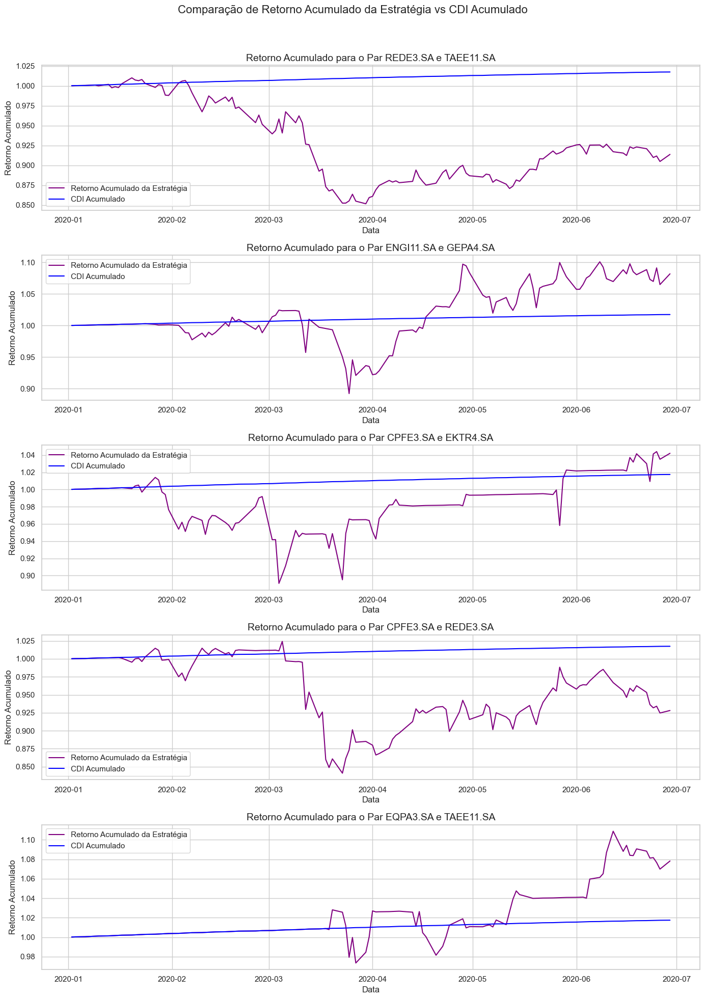

In [51]:
# Definindo a quantidade de pares que queremos visualizar (ajuste conforme necessário)
num_pares_visualizar = 5

# Criando subplots para visualizar as curvas de equity dos primeiros pares cointegrados
fig, ax = plt.subplots(num_pares_visualizar, 1, figsize=(14, 4 * num_pares_visualizar))
fig.suptitle("Comparação de Retorno Acumulado da Estratégia vs CDI Acumulado", fontsize=16)

# Iterando sobre os pares e plotando
for i, (acao1, acao2, z_score_trading, resultado) in enumerate(resultados_retornos_3[:num_pares_visualizar]):
    # Plotando o Retorno Acumulado Conjunto e CDI Acumulado
    ax[i].plot(resultado.index, resultado['Retorno Acumulado Conjunto'], color='purple', label='Retorno Acumulado da Estratégia')
    ax[i].plot(resultado.index, resultado['CDI Acumulado'], color='blue', label='CDI Acumulado')
    
    # Título e configurações do gráfico
    ax[i].set_title(f"Retorno Acumulado para o Par {acao1} e {acao2}", fontsize=14)
    ax[i].set_xlabel("Data")
    ax[i].set_ylabel("Retorno Acumulado")
    ax[i].legend()

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

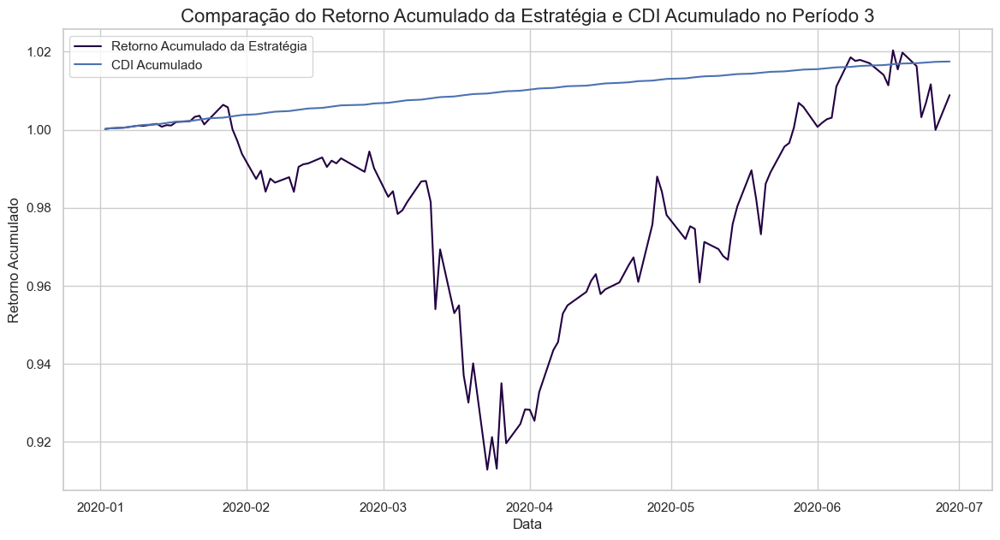

In [52]:
# Plotando o gráfico de comparação
plt.figure(figsize=(14, 7))

# Plotando a curva de Retorno Acumulado da Estratégia
plt.plot(resultado_retornos_periodo_3.index, resultado_retornos_periodo_3['Retorno Acumulado da Estratégia'], label='Retorno Acumulado da Estratégia', color='#220042')

# Plotando a curva de CDI Acumulado
plt.plot(resultado_retornos_periodo_3.index, resultado_retornos_periodo_3['CDI Acumulado'], label='CDI Acumulado', color='b')

# Configurando o título e os rótulos
plt.title('Comparação do Retorno Acumulado da Estratégia e CDI Acumulado no Período 3', fontsize=16)
plt.xlabel('Data', fontsize=12)
plt.ylabel('Retorno Acumulado', fontsize=12)
plt.legend()

# Exibindo o gráfico
plt.show()

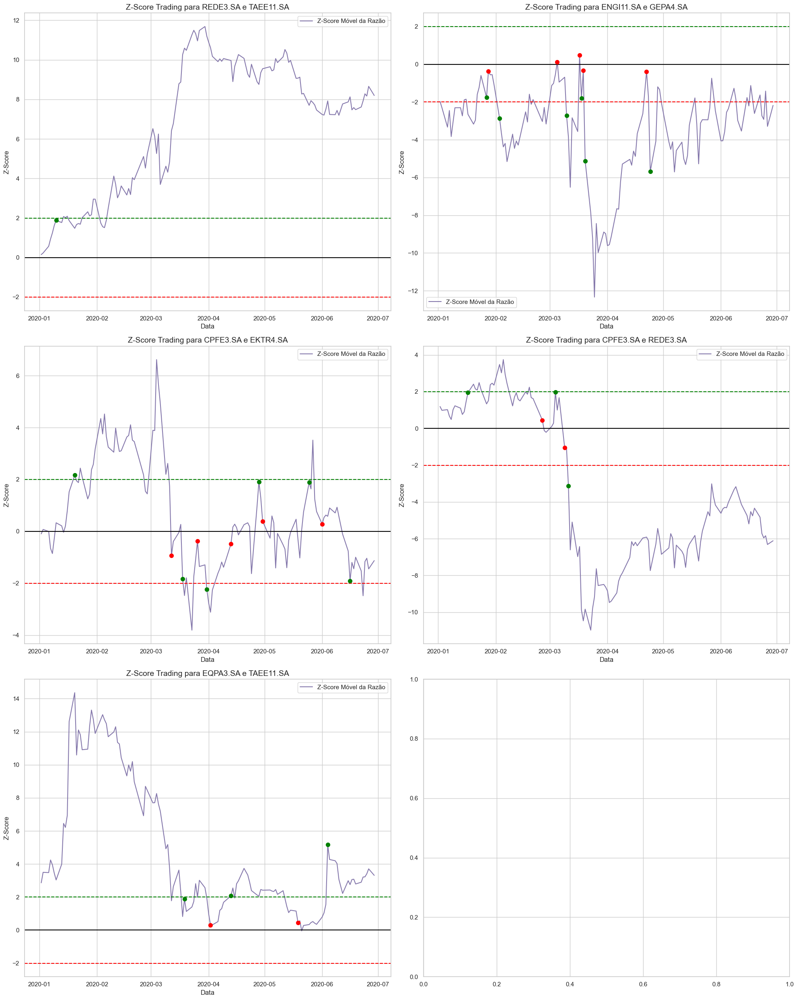

In [53]:
fig, ax = plt.subplots(3, 2, figsize=(20, 25))

for i, (acao1, acao2, z_score_trading, resultado) in enumerate(resultados_retornos_3):
    row = i // 2
    col = i % 2

    ax[row, col].plot(z_score_trading.index, z_score_trading, color='#8477ab', label='Z-Score Móvel da Razão', zorder=1)
    ax[row, col].axhline(0, color='black', zorder=2)
    ax[row, col].axhline(2.0, color='green', linestyle='--', zorder=2)
    ax[row, col].axhline(-2.0, color='red', linestyle='--', zorder=2)

    entradas_short = resultado[resultado['Entrada Short']]
    entradas_long = resultado[resultado['Entrada Long']]
    ax[row, col].scatter(entradas_short.index, z_score_trading.loc[entradas_short.index], color='green', s=50, zorder=3)
    ax[row, col].scatter(entradas_long.index, z_score_trading.loc[entradas_long.index], color='green', s=50, zorder=3)

    saidas_short = resultado[resultado['Saida Short']]
    saidas_long = resultado[resultado['Saida Long']]
    ax[row, col].scatter(saidas_short.index, z_score_trading.loc[saidas_short.index], color='red', s=50, zorder=3)
    ax[row, col].scatter(saidas_long.index, z_score_trading.loc[saidas_long.index], color='red', s=50, zorder=3)

    ax[row, col].set_title(f"Z-Score Trading para {acao1} e {acao2}", fontsize=14)
    ax[row, col].set_xlabel("Data")
    ax[row, col].set_ylabel("Z-Score")
    ax[row, col].legend()

plt.tight_layout()
plt.show()

### **2.4. Período 4**

#### **2.4.1. Cotações das Ações**

In [54]:
cotacoes_formacao_4 = yf.download(acoes_escolhidas, start='2019-07-01', end='2020-06-30')['Adj Close']
cotacoes_trading_4 = yf.download(acoes_escolhidas, start='2020-07-01', end='2020-12-31')['Adj Close']

[*********************100%%**********************]  26 of 26 completed

2 Failed downloads:
['TRPL4.SA']: Exception('%ticker%: No data found, symbol may be delisted')
['AMBP3.SA']: Exception("%ticker%: Data doesn't exist for startDate = 1561950000, endDate = 1593486000")
[*********************100%%**********************]  26 of 26 completed

1 Failed download:
['TRPL4.SA']: Exception('%ticker%: No data found, symbol may be delisted')


In [55]:
cotacoes_formacao_4 = cotacoes_formacao_4.dropna(axis=1)
cotacoes_trading_4 = cotacoes_trading_4.dropna(axis=1)

In [56]:
# Garantindo que ambos os períodos tenham as mesmas colunas
acoes_intersecao_4 = cotacoes_formacao_4.columns.intersection(cotacoes_trading_4.columns)
cotacoes_formacao_4 = cotacoes_formacao_4[acoes_intersecao_4]
cotacoes_trading_4 = cotacoes_trading_4[acoes_intersecao_4]

# Exibindo as colunas restantes para confirmação
cotacoes_formacao_4.columns, cotacoes_trading_4.columns

(Index(['ALUP11.SA', 'CEBR3.SA', 'CGAS3.SA', 'CLSC4.SA', 'CMIG4.SA', 'COCE5.SA',
        'CPFE3.SA', 'CPLE6.SA', 'CSMG3.SA', 'EGIE3.SA', 'EKTR4.SA', 'ELET3.SA',
        'EMAE4.SA', 'ENEV3.SA', 'ENGI11.SA', 'EQPA3.SA', 'EQTL3.SA', 'GEPA4.SA',
        'LIGT3.SA', 'NEOE3.SA', 'REDE3.SA', 'SAPR11.SA', 'SBSP3.SA',
        'TAEE11.SA'],
       dtype='object', name='Ticker'),
 Index(['ALUP11.SA', 'CEBR3.SA', 'CGAS3.SA', 'CLSC4.SA', 'CMIG4.SA', 'COCE5.SA',
        'CPFE3.SA', 'CPLE6.SA', 'CSMG3.SA', 'EGIE3.SA', 'EKTR4.SA', 'ELET3.SA',
        'EMAE4.SA', 'ENEV3.SA', 'ENGI11.SA', 'EQPA3.SA', 'EQTL3.SA', 'GEPA4.SA',
        'LIGT3.SA', 'NEOE3.SA', 'REDE3.SA', 'SAPR11.SA', 'SBSP3.SA',
        'TAEE11.SA'],
       dtype='object', name='Ticker'))

In [57]:
# Calculando os retornos cumulativos normalizados para o período de formação
cumret_formacao_4 = np.log(cotacoes_formacao_4).diff().cumsum() + 1
cumret_formacao_4.dropna(inplace=True)

# Calculando os retornos cumulativos normalizados para o período de trading
cumret_trading_4 = np.log(cotacoes_trading_4).diff().cumsum() + 1
cumret_trading_4.dropna(inplace=True)

#### **2.4.2. Dados do CDI**

In [58]:
cdi_trading_4 = sgs.get({'CDI': 12}, start='2020-07-01', end='2020-12-31')

# Convertendo o CDI de % diária para formato decimal
cdi_trading_4['CDI'] = cdi_trading_4['CDI'] / 100

# Ajustando o índice para ser compatível com os resultados da estratégia
cdi_trading_4.index = pd.to_datetime(cdi_trading_4.index)

indices_trading_4 = pd.DataFrame(index = cotacoes_trading_4.index)
indices_trading_4['CDI'] = cdi_trading_4['CDI']

#### **2.4.3. Seleção de Pares**

In [59]:
# Usando preços ajustados para o teste de cointegração
pares_cointegrados_4 = test_cointegration(cotacoes_formacao_4)

# Selecionar os 5 pares cointegrados com menores distâncias
top_pairs_4 = select_top_pairs(pares_cointegrados_4, cotacoes_formacao_4, top_n=5)

# Exibir resultados
print("Top 5 pares cointegrados com menores distâncias:")
for s1, s2, p_value, distance in top_pairs_4:
    print(f"{s1} - {s2} | p-valor: {p_value:.4f} | Distância Euclidiana: {distance:.4f}")

Top 5 pares cointegrados com menores distâncias:
CPFE3.SA - ENGI11.SA | p-valor: 0.0003 | Distância Euclidiana: 0.5468
TAEE11.SA - GEPA4.SA | p-valor: 0.0412 | Distância Euclidiana: 0.8125
ALUP11.SA - EKTR4.SA | p-valor: 0.0008 | Distância Euclidiana: 1.0150
ALUP11.SA - EGIE3.SA | p-valor: 0.0443 | Distância Euclidiana: 1.1181
COCE5.SA - EKTR4.SA | p-valor: 0.0134 | Distância Euclidiana: 1.1978


#### **2.4.4. Calculando os Spreads**

In [60]:
# Lista para armazenar os resultados dos spreads no período de trading
resultados_spreads_trading_4 = []

# Iterando sobre os pares selecionados no 'top_pairs'
for s1, s2, p_value, distance in top_pairs_4:
    # Calculando o spread no período de formação para estimar alpha e beta
    serie1_formacao = cotacoes_formacao_4[s1]
    serie2_formacao = cotacoes_formacao_4[s2]
    spread_formacao, alpha, beta = calcular_spread(serie1_formacao, serie2_formacao)
    
    # Calculando o spread no período de trading usando os valores de alpha e beta do período de formação
    serie1_trading = cotacoes_trading_4[s1]
    serie2_trading = cotacoes_trading_4[s2]
    spread_trading = serie1_trading - (alpha + beta * serie2_trading)
    
    # Armazenando os resultados para o período de trading
    media_spread = spread_formacao.mean()
    desvio_spread = spread_formacao.std()
    resultados_spreads_trading_4.append((s1, s2, spread_trading, alpha, beta, media_spread, desvio_spread))

# Exibindo um exemplo dos resultados para verificação
for resultado in resultados_spreads_trading_4[:5]:  # Mostrando apenas os 5 primeiros pares para verificação
    print(f"Par: {resultado[0]} - {resultado[1]}")
    print(f"Alpha: {resultado[3]:.4f}, Beta: {resultado[4]:.4f}")
    print(f"Média do Spread de Formação: {resultado[5]:.4f}, Desvio Padrão do Spread de Formação: {resultado[6]:.4f}")
    print(f"Spread de Trading (primeiros valores):\n{resultado[2].head()}\n")

Par: CPFE3.SA - ENGI11.SA
Alpha: 3.4039, Beta: 0.4808
Média do Spread de Formação: -0.0000, Desvio Padrão do Spread de Formação: 0.6421
Spread de Trading (primeiros valores):
Date
2020-07-01   -1.165726
2020-07-02   -1.069751
2020-07-03   -0.739250
2020-07-06   -0.262508
2020-07-07   -0.589870
dtype: float64

Par: TAEE11.SA - GEPA4.SA
Alpha: 7.1327, Beta: 0.3958
Média do Spread de Formação: 0.0000, Desvio Padrão do Spread de Formação: 0.6116
Spread de Trading (primeiros valores):
Date
2020-07-01    0.581871
2020-07-02    0.506044
2020-07-03    0.499662
2020-07-06    0.112821
2020-07-07   -0.018588
dtype: float64

Par: ALUP11.SA - EKTR4.SA
Alpha: 7.8151, Beta: 1.1295
Média do Spread de Formação: -0.0000, Desvio Padrão do Spread de Formação: 0.8109
Spread de Trading (primeiros valores):
Date
2020-07-01   -0.362294
2020-07-02   -0.286032
2020-07-03   -0.324214
2020-07-06    0.258658
2020-07-07   -0.473415
dtype: float64

Par: ALUP11.SA - EGIE3.SA
Alpha: 5.1403, Beta: 0.4206
Média do Sprea

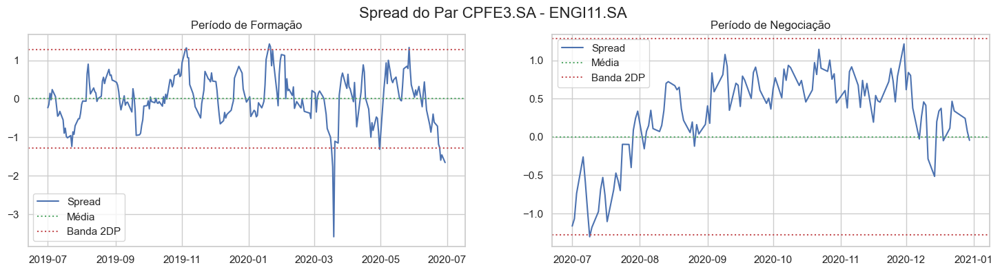

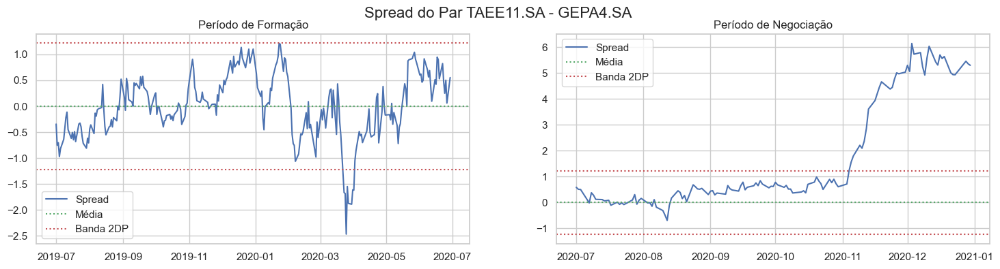

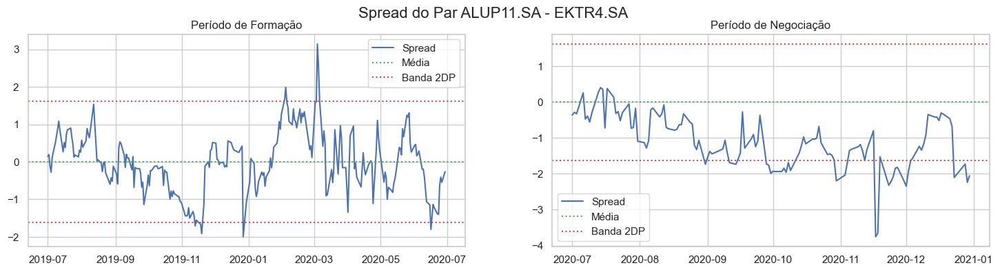

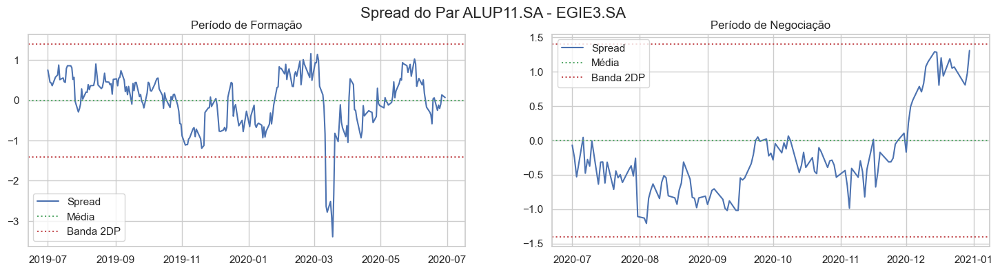

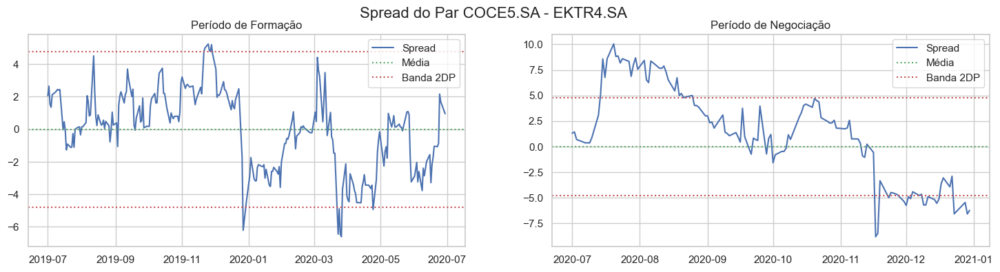

In [61]:
def plot_spreads(resultados_spreads_trading):
    """
    Plota os spreads de formação e de negociação para os pares selecionados.
    """
    for s1, s2, spread_trading, alpha, beta, media_spread, desvio_spread in resultados_spreads_trading:
        # Calculando o spread para o período de formação usando os valores armazenados
        spread_formacao = cotacoes_formacao_4[s1] - (alpha + beta * cotacoes_formacao_4[s2])

        # Criando gráficos lado a lado
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 4))
        fig.suptitle(f'Spread do Par {s1} - {s2}', fontsize=16)

        # Período de formação
        ax1.plot(spread_formacao, label='Spread')
        ax1.axhline(y=media_spread, color='g', linestyle='dotted', label='Média')
        ax1.axhline(y=media_spread + 2 * desvio_spread, color='r', linestyle='dotted', label='Banda 2DP')
        ax1.axhline(y=media_spread - 2 * desvio_spread, color='r', linestyle='dotted')
        ax1.set_title('Período de Formação')
        ax1.legend()

        # Período de negociação
        ax2.plot(spread_trading, label='Spread')
        ax2.axhline(y=media_spread, color='g', linestyle='dotted', label='Média')
        ax2.axhline(y=media_spread + 2 * desvio_spread, color='r', linestyle='dotted', label='Banda 2DP')
        ax2.axhline(y=media_spread - 2 * desvio_spread, color='r', linestyle='dotted')
        ax2.set_title('Período de Negociação')
        ax2.legend()

        plt.show()

# Chamando a função para os pares em resultados_spreads_trading_3
plot_spreads(resultados_spreads_trading_4)

#### **2.4.5. Definindo os Sinais da Estratégia**

In [62]:
resultados_z_scores_trading_4 = []

for acao1, acao2, spread_trading, alpha, beta, media_spread, desvio_spread in resultados_spreads_trading_4:
    z_score_trading = (spread_trading - media_spread) / desvio_spread
    resultados_z_scores_trading_4.append((acao1, acao2, z_score_trading))
    print(f"Par: {acao1} e {acao2} - Média do Z-score: {z_score_trading.mean():.4f}, Desvio Padrão do Z-score: {z_score_trading.std():.4f}\n")

Par: CPFE3.SA e ENGI11.SA - Média do Z-score: 0.4814, Desvio Padrão do Z-score: 0.8723

Par: TAEE11.SA e GEPA4.SA - Média do Z-score: 2.6645, Desvio Padrão do Z-score: 3.3849

Par: ALUP11.SA e EKTR4.SA - Média do Z-score: -1.3746, Desvio Padrão do Z-score: 0.9229

Par: ALUP11.SA e EGIE3.SA - Média do Z-score: -0.3686, Desvio Padrão do Z-score: 0.8496

Par: COCE5.SA e EKTR4.SA - Média do Z-score: 0.6022, Desvio Padrão do Z-score: 1.9130



In [63]:
sinais_trade_list_4 = []

for acao1, acao2, z_score_trading in resultados_z_scores_trading_4:
    sinais_trade = pd.DataFrame(index=z_score_trading.index)
    sinais_trade[f'Preços {acao1}'] = cotacoes_trading_4[acao1]
    sinais_trade[f'Preços {acao2}'] = cotacoes_trading_4[acao2]

    posicao_short_ativa = False
    posicao_long_ativa = False

    entradas_short = []
    entradas_long = []
    saidas_short = []
    saidas_long = []

    for i in range(len(sinais_trade)):
        if not posicao_short_ativa and not posicao_long_ativa:
            if (z_score_trading.iloc[i] > sinal_entrada) and (z_score_trading.shift(1).iloc[i] < sinal_entrada):
                entradas_short.append(True)
                entradas_long.append(False)
                posicao_short_ativa = True
            elif (z_score_trading.iloc[i] < -sinal_entrada) and (z_score_trading.shift(1).iloc[i] > -sinal_entrada):
                entradas_long.append(True)
                entradas_short.append(False)
                posicao_long_ativa = True
            else:
                entradas_short.append(False)
                entradas_long.append(False)
        else:
            entradas_short.append(False)
            entradas_long.append(False)

        if posicao_short_ativa:
            saida = (z_score_trading.iloc[i] < sinal_saida) and (z_score_trading.shift(1).iloc[i] > sinal_saida)
            saidas_short.append(saida)
            saidas_long.append(False)
            if saida:
                posicao_short_ativa = False
        elif posicao_long_ativa:
            saida = (z_score_trading.iloc[i] > -sinal_saida) and (z_score_trading.shift(1).iloc[i] < -sinal_saida)
            saidas_long.append(saida)
            saidas_short.append(False)
            if saida:
                posicao_long_ativa = False
        else:
            saidas_short.append(False)
            saidas_long.append(False)

    sinais_trade['Entrada Short'] = entradas_short
    sinais_trade['Entrada Long'] = entradas_long
    sinais_trade['Saida Short'] = saidas_short
    sinais_trade['Saida Long'] = saidas_long

    sinais_trade_list_4.append((acao1, acao2, z_score_trading, sinais_trade))

#### **2.4.6. Calculando os Retornos**

In [64]:
resultado_backtest_todos_pares_4 = []

for acao1, acao2, z_score_trading, sinais_trade in sinais_trade_list_4:
    resultado = pd.DataFrame(index=sinais_trade.index)
    resultado[f'{acao1}'] = cotacoes_trading_4[acao1]
    resultado[f'{acao2}'] = cotacoes_trading_4[acao2]
    resultado['CDI'] = indices_trading_4['CDI']
    resultado['Entrada Short'] = sinais_trade['Entrada Short']
    resultado['Saida Short'] = sinais_trade['Saida Short']
    resultado['Entrada Long'] = sinais_trade['Entrada Long']
    resultado['Saida Long'] = sinais_trade['Saida Long']

    retorno_acao1 = []
    retorno_acao2 = []

    posicao_short_ativa = False
    posicao_long_ativa = False

    for i in range(len(sinais_trade)):
        if sinais_trade['Entrada Short'].iloc[i]:
            posicao_short_ativa = True
            retorno_acao1.append(-0.001)
            retorno_acao2.append(-0.001)
        elif sinais_trade['Entrada Long'].iloc[i]:
            posicao_long_ativa = True
            retorno_acao1.append(-0.001)
            retorno_acao2.append(-0.001)
        elif posicao_short_ativa:
            if sinais_trade['Saida Short'].iloc[i]:
                retorno_acao1.append(-0.001)
                retorno_acao2.append(-0.001)
                posicao_short_ativa = False
            else:
                retorno_acao1.append(-(cotacoes_trading_4[acao1].iloc[i] / cotacoes_trading_4[acao1].iloc[i-1] - 1))
                retorno_acao2.append(cotacoes_trading_4[acao2].iloc[i] / cotacoes_trading_4[acao2].iloc[i-1] - 1)
        elif posicao_long_ativa:
            if sinais_trade['Saida Long'].iloc[i]:
                retorno_acao1.append(-0.001)
                retorno_acao2.append(-0.001)
                posicao_long_ativa = False
            else:
                retorno_acao1.append(cotacoes_trading_4[acao1].iloc[i] / cotacoes_trading_4[acao1].iloc[i-1] - 1)
                retorno_acao2.append(-(cotacoes_trading_4[acao2].iloc[i] / cotacoes_trading_4[acao2].iloc[i-1] - 1))
        else:
            retorno_acao1.append(resultado['CDI'].iloc[i])
            retorno_acao2.append(resultado['CDI'].iloc[i])

    resultado[f"Retorno {acao1}"] = retorno_acao1
    resultado[f"Retorno {acao2}"] = retorno_acao2

    resultado_backtest_todos_pares_4.append((acao1, acao2, z_score_trading, resultado))

In [65]:
# Lista para armazenar os retornos acumulados de cada par e da estratégia conjunta
resultados_retornos_4 = []

# Iterando sobre cada resultado do backtest em resultado_backtest_todos_pares
for acao1, acao2, z_score_trading, resultado in resultado_backtest_todos_pares_4:
    # Inicializando os retornos acumulados
    retorno_acumulado_acao1 = 1
    retorno_acumulado_acao2 = 1
    cdi_acumulado = 1
    retorno_acumulado_acao1_list = []
    retorno_acumulado_acao2_list = []
    cdi_acumulado_list = []
    retorno_acumulado_conjunto_list = []

    # Iterando sobre as datas do DataFrame para calcular os retornos acumulados
    for i in range(len(resultado)):
        # Calculando o retorno acumulado de nome1, nome2 e cdi
        retorno_acumulado_acao1 *= (1 + resultado[f"Retorno {acao1}"].iloc[i])
        retorno_acumulado_acao2 *= (1 + resultado[f"Retorno {acao2}"].iloc[i])
        cdi_acumulado *= (1 + resultado['CDI'].iloc[i])

        # Adicionando os valores à lista de retorno acumulado
        retorno_acumulado_acao1_list.append(retorno_acumulado_acao1)
        retorno_acumulado_acao2_list.append(retorno_acumulado_acao2)
        cdi_acumulado_list.append(cdi_acumulado)

        # Calculando o retorno acumulado conjunto (média dos acumulados)
        retorno_acumulado_conjunto = (retorno_acumulado_acao1 + retorno_acumulado_acao2) / 2
        retorno_acumulado_conjunto_list.append(retorno_acumulado_conjunto)

    # Adicionando os retornos acumulados ao DataFrame de resultado
    resultado[f"Retorno Acumulado {acao1}"] = retorno_acumulado_acao1_list
    resultado[f"Retorno Acumulado {acao2}"] = retorno_acumulado_acao2_list
    resultado['CDI Acumulado'] = cdi_acumulado_list
    resultado['Retorno Acumulado Conjunto'] = retorno_acumulado_conjunto_list

    # Adicionando o resultado do par à lista de resultados acumulados
    resultados_retornos_4.append((acao1, acao2, z_score_trading, resultado))

In [66]:
# Inicializando um DataFrame vazio com o índice de datas baseado no primeiro resultado
resultado_retornos_periodo_4 = pd.DataFrame(index=resultados_retornos_4[0][3].index)

# Adicionando as colunas de retorno acumulado conjunto de cada par
for acao1, acao2, z_score_trading, resultado in resultados_retornos_4:
    coluna_nome = f"{acao1}-{acao2} Retorno Acumulado Conjunto"
    resultado_retornos_periodo_4[coluna_nome] = resultado['Retorno Acumulado Conjunto']

# Calculando a média dos retornos acumulados de todos os pares para criar a coluna 'Retorno Acumulado da Estratégia'
resultado_retornos_periodo_4['Retorno Acumulado da Estratégia'] = resultado_retornos_periodo_4.mean(axis=1)

# Adicionando a coluna de 'CDI Acumulado' para comparação
resultado_retornos_periodo_4['CDI Acumulado'] = resultados_retornos_4[0][3]['CDI Acumulado']

# Exibindo o DataFrame resultante
display(resultado_retornos_periodo_4)

,CPFE3.SA-ENGI11.SA Retorno Acumulado Conjunto,TAEE11.SA-GEPA4.SA Retorno Acumulado Conjunto,ALUP11.SA-EKTR4.SA Retorno Acumulado Conjunto,ALUP11.SA-EGIE3.SA Retorno Acumulado Conjunto,COCE5.SA-EKTR4.SA Retorno Acumulado Conjunto,Retorno Acumulado da Estratégia,CDI Acumulado
Date,,,,,,,
2020-07-01,1.000084,1.000084,1.000084,1.000084,1.000084,1.000084,1.000084
2020-07-02,1.000169,1.000169,1.000169,1.000169,1.000169,1.000169,1.000169
2020-07-03,1.000253,1.000253,1.000253,1.000253,1.000253,1.000253,1.000253
2020-07-06,1.000338,1.000338,1.000338,1.000338,1.000338,1.000338,1.000338
2020-07-07,1.000422,1.000422,1.000422,1.000422,1.000422,1.000422,1.000422
...,...,...,...,...,...,...,...
2020-12-22,1.044714,0.917303,0.978765,1.010994,1.182418,1.026839,1.009333
2020-12-23,1.044792,0.917317,0.977786,1.011836,1.104816,1.011310,1.009409
2020-12-28,1.044870,0.906036,0.988523,1.022435,1.119648,1.016303,1.009484


#### **2.4.7. Visualizando os Retornos**

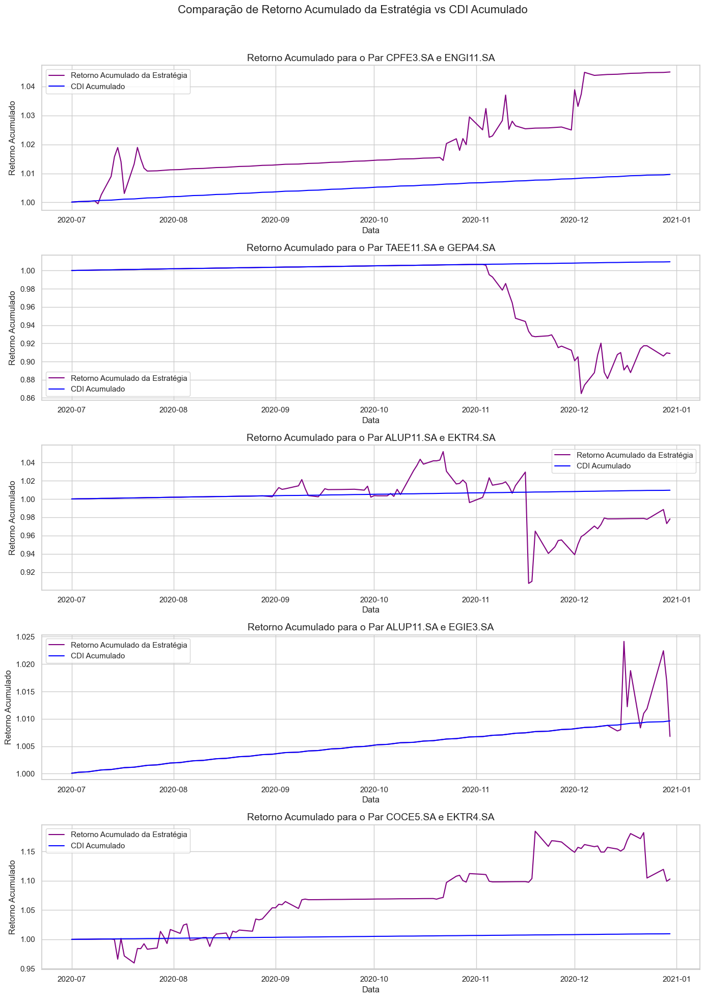

In [67]:
# Definindo a quantidade de pares que queremos visualizar (ajuste conforme necessário)
num_pares_visualizar = 5

# Criando subplots para visualizar as curvas de equity dos primeiros pares cointegrados
fig, ax = plt.subplots(num_pares_visualizar, 1, figsize=(14, 4 * num_pares_visualizar))
fig.suptitle("Comparação de Retorno Acumulado da Estratégia vs CDI Acumulado", fontsize=16)

# Iterando sobre os pares e plotando
for i, (acao1, acao2, z_score_trading, resultado) in enumerate(resultados_retornos_4[:num_pares_visualizar]):
    # Plotando o Retorno Acumulado Conjunto e CDI Acumulado
    ax[i].plot(resultado.index, resultado['Retorno Acumulado Conjunto'], color='purple', label='Retorno Acumulado da Estratégia')
    ax[i].plot(resultado.index, resultado['CDI Acumulado'], color='blue', label='CDI Acumulado')
    
    # Título e configurações do gráfico
    ax[i].set_title(f"Retorno Acumulado para o Par {acao1} e {acao2}", fontsize=14)
    ax[i].set_xlabel("Data")
    ax[i].set_ylabel("Retorno Acumulado")
    ax[i].legend()

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

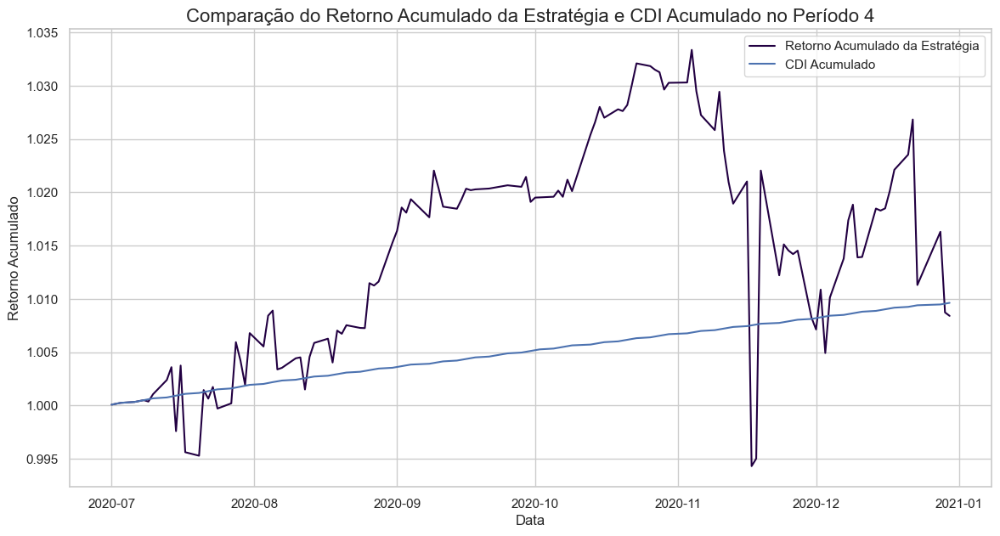

In [68]:
# Plotando o gráfico de comparação
plt.figure(figsize=(14, 7))

# Plotando a curva de Retorno Acumulado da Estratégia
plt.plot(resultado_retornos_periodo_4.index, resultado_retornos_periodo_4['Retorno Acumulado da Estratégia'], label='Retorno Acumulado da Estratégia', color='#220042')

# Plotando a curva de CDI Acumulado
plt.plot(resultado_retornos_periodo_4.index, resultado_retornos_periodo_4['CDI Acumulado'], label='CDI Acumulado', color='b')

# Configurando o título e os rótulos
plt.title('Comparação do Retorno Acumulado da Estratégia e CDI Acumulado no Período 4', fontsize=16)
plt.xlabel('Data', fontsize=12)
plt.ylabel('Retorno Acumulado', fontsize=12)
plt.legend()

# Exibindo o gráfico
plt.show()

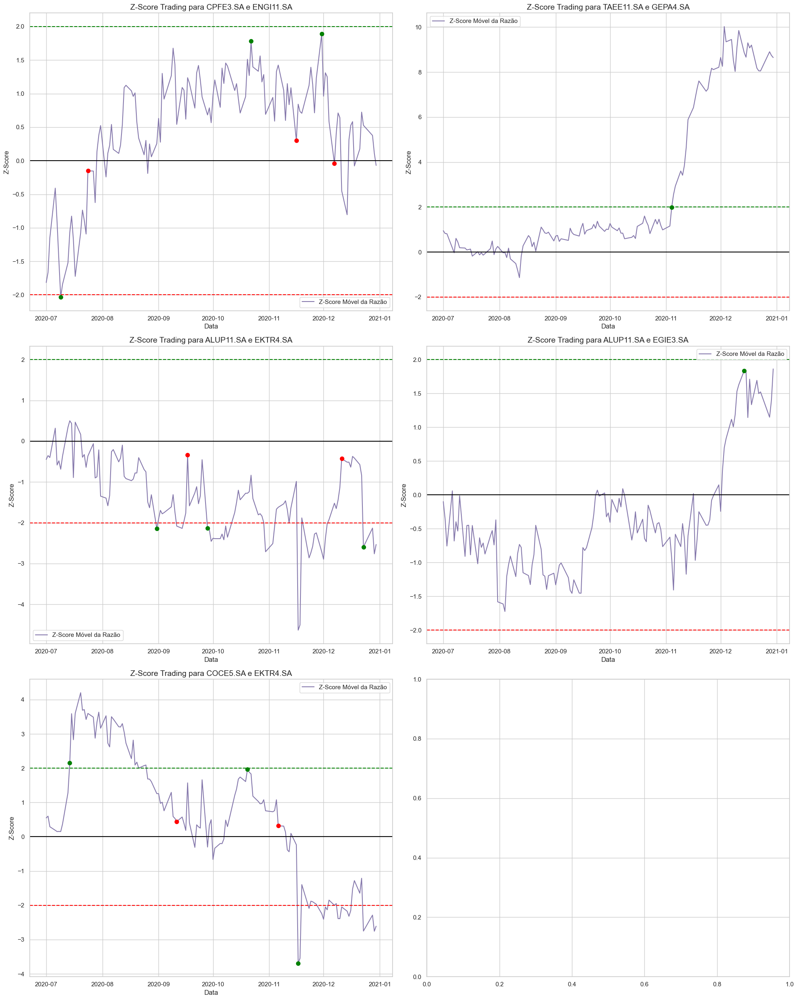

In [69]:
fig, ax = plt.subplots(3, 2, figsize=(20, 25))

for i, (acao1, acao2, z_score_trading, resultado) in enumerate(resultados_retornos_4):
    row = i // 2
    col = i % 2

    ax[row, col].plot(z_score_trading.index, z_score_trading, color='#8477ab', label='Z-Score Móvel da Razão', zorder=1)
    ax[row, col].axhline(0, color='black', zorder=2)
    ax[row, col].axhline(2.0, color='green', linestyle='--', zorder=2)
    ax[row, col].axhline(-2.0, color='red', linestyle='--', zorder=2)

    entradas_short = resultado[resultado['Entrada Short']]
    entradas_long = resultado[resultado['Entrada Long']]
    ax[row, col].scatter(entradas_short.index, z_score_trading.loc[entradas_short.index], color='green', s=50, zorder=3)
    ax[row, col].scatter(entradas_long.index, z_score_trading.loc[entradas_long.index], color='green', s=50, zorder=3)

    saidas_short = resultado[resultado['Saida Short']]
    saidas_long = resultado[resultado['Saida Long']]
    ax[row, col].scatter(saidas_short.index, z_score_trading.loc[saidas_short.index], color='red', s=50, zorder=3)
    ax[row, col].scatter(saidas_long.index, z_score_trading.loc[saidas_long.index], color='red', s=50, zorder=3)

    ax[row, col].set_title(f"Z-Score Trading para {acao1} e {acao2}", fontsize=14)
    ax[row, col].set_xlabel("Data")
    ax[row, col].set_ylabel("Z-Score")
    ax[row, col].legend()

plt.tight_layout()
plt.show()

### **2.5. Período 5**

#### **2.5.1. Cotações das Ações**

In [70]:
cotacoes_formacao_5 = yf.download(acoes_escolhidas, start='2020-01-01', end='2020-12-31')['Adj Close']
cotacoes_trading_5 = yf.download(acoes_escolhidas, start='2021-01-01', end='2021-06-30')['Adj Close']

[*********************100%%**********************]  26 of 26 completed

1 Failed download:
['TRPL4.SA']: Exception('%ticker%: No data found, symbol may be delisted')
[*********************100%%**********************]  26 of 26 completed

1 Failed download:
['TRPL4.SA']: Exception('%ticker%: No data found, symbol may be delisted')


In [71]:
cotacoes_formacao_5 = cotacoes_formacao_5.dropna(axis=1)
cotacoes_trading_5 = cotacoes_trading_5.dropna(axis=1)

In [72]:
# Garantindo que ambos os períodos tenham as mesmas colunas
acoes_intersecao_5 = cotacoes_formacao_5.columns.intersection(cotacoes_trading_5.columns)
cotacoes_formacao_5 = cotacoes_formacao_5[acoes_intersecao_5]
cotacoes_trading_5 = cotacoes_trading_5[acoes_intersecao_5]

# Exibindo as colunas restantes para confirmação
cotacoes_formacao_5.columns, cotacoes_trading_5.columns

(Index(['ALUP11.SA', 'CEBR3.SA', 'CGAS3.SA', 'CLSC4.SA', 'CMIG4.SA', 'COCE5.SA',
        'CPFE3.SA', 'CPLE6.SA', 'CSMG3.SA', 'EGIE3.SA', 'EKTR4.SA', 'ELET3.SA',
        'EMAE4.SA', 'ENEV3.SA', 'ENGI11.SA', 'EQPA3.SA', 'EQTL3.SA', 'GEPA4.SA',
        'LIGT3.SA', 'NEOE3.SA', 'REDE3.SA', 'SAPR11.SA', 'SBSP3.SA',
        'TAEE11.SA'],
       dtype='object', name='Ticker'),
 Index(['ALUP11.SA', 'CEBR3.SA', 'CGAS3.SA', 'CLSC4.SA', 'CMIG4.SA', 'COCE5.SA',
        'CPFE3.SA', 'CPLE6.SA', 'CSMG3.SA', 'EGIE3.SA', 'EKTR4.SA', 'ELET3.SA',
        'EMAE4.SA', 'ENEV3.SA', 'ENGI11.SA', 'EQPA3.SA', 'EQTL3.SA', 'GEPA4.SA',
        'LIGT3.SA', 'NEOE3.SA', 'REDE3.SA', 'SAPR11.SA', 'SBSP3.SA',
        'TAEE11.SA'],
       dtype='object', name='Ticker'))

In [73]:
# Calculando os retornos cumulativos normalizados para o período de formação
cumret_formacao_5 = np.log(cotacoes_formacao_5).diff().cumsum() + 1
cumret_formacao_5.dropna(inplace=True)

# Calculando os retornos cumulativos normalizados para o período de trading
cumret_trading_5 = np.log(cotacoes_trading_5).diff().cumsum() + 1
cumret_trading_5.dropna(inplace=True)

#### **2.5.2. Dados do CDI**

In [74]:
cdi_trading_5 = sgs.get({'CDI': 12}, start='2021-01-01', end='2021-06-30')

# Convertendo o CDI de % diária para formato decimal
cdi_trading_5['CDI'] = cdi_trading_5['CDI'] / 100

# Ajustando o índice para ser compatível com os resultados da estratégia
cdi_trading_5.index = pd.to_datetime(cdi_trading_5.index)

indices_trading_5 = pd.DataFrame(index = cotacoes_trading_5.index)
indices_trading_5['CDI'] = cdi_trading_5['CDI']

#### **2.5.3. Seleção de Pares**

In [75]:
# Usando preços ajustados para o teste de cointegração
pares_cointegrados_5 = test_cointegration(cotacoes_formacao_5)

# Selecionar os 5 pares cointegrados com menores distâncias
top_pairs_5 = select_top_pairs(pares_cointegrados_5, cotacoes_formacao_5, top_n=5)

# Exibir resultados
print("Top 5 pares cointegrados com menores distâncias:")
for s1, s2, p_value, distance in top_pairs_5:
    print(f"{s1} - {s2} | p-valor: {p_value:.4f} | Distância Euclidiana: {distance:.4f}")

Top 5 pares cointegrados com menores distâncias:
ALUP11.SA - CPFE3.SA | p-valor: 0.0001 | Distância Euclidiana: 0.5442
CPFE3.SA - ENGI11.SA | p-valor: 0.0006 | Distância Euclidiana: 0.7258
ALUP11.SA - ENGI11.SA | p-valor: 0.0033 | Distância Euclidiana: 0.9245
GEPA4.SA - COCE5.SA | p-valor: 0.0271 | Distância Euclidiana: 1.2153
CPFE3.SA - EGIE3.SA | p-valor: 0.0258 | Distância Euclidiana: 1.2460


#### **2.5.4. Calculando os Spreads**

In [76]:
# Lista para armazenar os resultados dos spreads no período de trading
resultados_spreads_trading_5 = []

# Iterando sobre os pares selecionados no 'top_pairs'
for s1, s2, p_value, distance in top_pairs_5:
    # Calculando o spread no período de formação para estimar alpha e beta
    serie1_formacao = cotacoes_formacao_5[s1]
    serie2_formacao = cotacoes_formacao_5[s2]
    
    spread_formacao, alpha, beta = calcular_spread(serie1_formacao, serie2_formacao)
    
    # Calculando o spread no período de trading usando os valores de alpha e beta do período de formação
    serie1_trading = cotacoes_trading_5[s1]
    serie2_trading = cotacoes_trading_5[s2]
    
    spread_trading = serie1_trading - (alpha + beta * serie2_trading)
    
    # Armazenando os resultados para o período de trading
    media_spread = spread_formacao.mean()
    desvio_spread = spread_formacao.std()
    
    resultados_spreads_trading_5.append((s1, s2, spread_trading, alpha, beta, media_spread, desvio_spread))

# Exibindo um exemplo dos resultados para verificação
for resultado in resultados_spreads_trading_5[:5]:  # Mostrando apenas os 5 primeiros pares para verificação
    print(f"Par: {resultado[0]} - {resultado[1]}")
    print(f"Alpha: {resultado[3]:.4f}, Beta: {resultado[4]:.4f}")
    print(f"Média do Spread de Formação: {resultado[5]:.4f}, Desvio Padrão do Spread de Formação: {resultado[6]:.4f}")
    print(f"Spread de Trading (primeiros valores):\n{resultado[2].head()}\n")

Par: ALUP11.SA - CPFE3.SA
Alpha: 3.9774, Beta: 0.6705
Média do Spread de Formação: 0.0000, Desvio Padrão do Spread de Formação: 0.4835
Spread de Trading (primeiros valores):
Date
2021-01-04    0.893784
2021-01-05    0.860522
2021-01-06    0.705282
2021-01-07    0.913612
2021-01-08    0.813145
dtype: float64

Par: CPFE3.SA - ENGI11.SA
Alpha: 4.3508, Beta: 0.4597
Média do Spread de Formação: -0.0000, Desvio Padrão do Spread de Formação: 0.6830
Spread de Trading (primeiros valores):
Date
2021-01-04   -0.725014
2021-01-05   -0.732284
2021-01-06   -0.455278
2021-01-07   -0.311176
2021-01-08    0.191310
dtype: float64

Par: ALUP11.SA - ENGI11.SA
Alpha: 6.6161, Beta: 0.3154
Média do Spread de Formação: -0.0000, Desvio Padrão do Spread de Formação: 0.5959
Spread de Trading (primeiros valores):
Date
2021-01-04    0.381266
2021-01-05    0.344737
2021-01-06    0.379681
2021-01-07    0.699628
2021-01-08    0.930517
dtype: float64

Par: GEPA4.SA - COCE5.SA
Alpha: 15.0793, Beta: 0.2478
Média do Spre

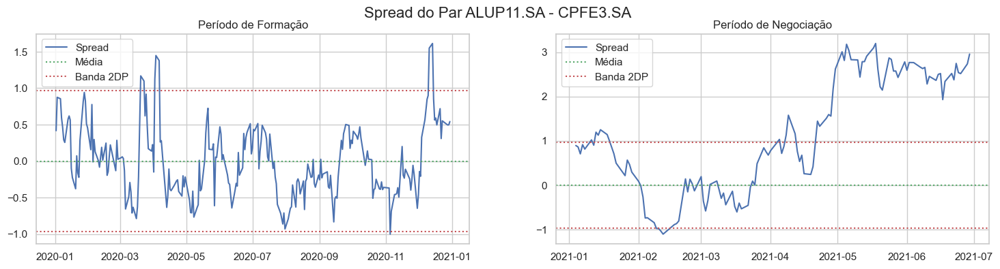

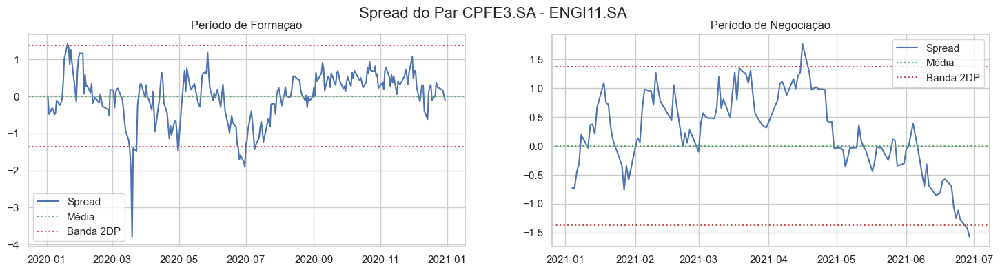

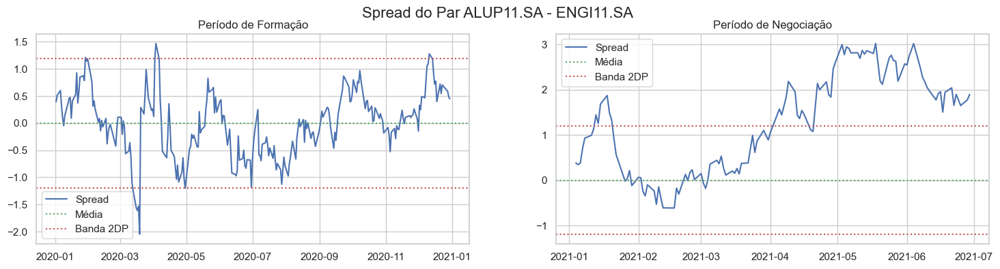

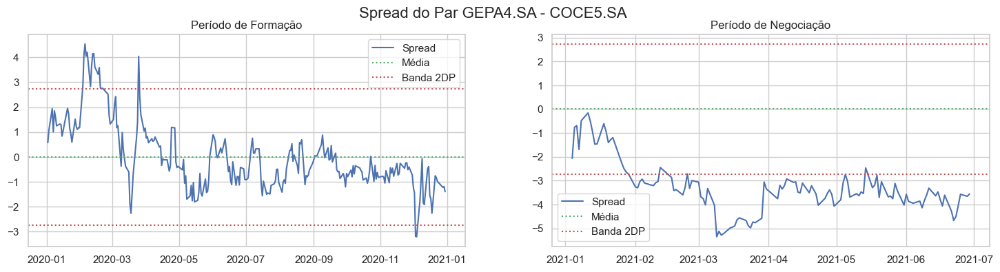

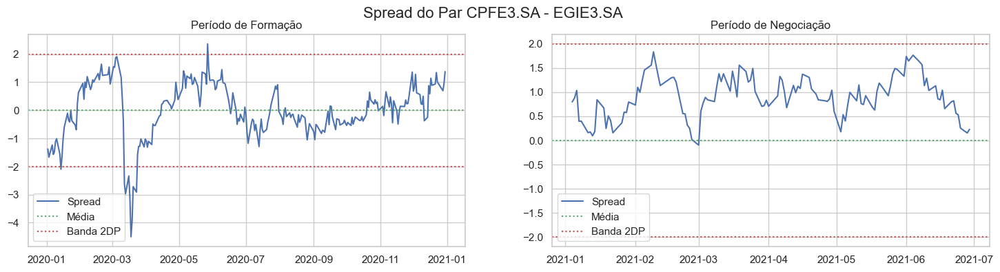

In [77]:
def plot_spreads(resultados_spreads_trading):
    """
    Plota os spreads de formação e de negociação para os pares selecionados.
    """
    for s1, s2, spread_trading, alpha, beta, media_spread, desvio_spread in resultados_spreads_trading:
        # Calculando o spread para o período de formação usando os valores armazenados
        spread_formacao = cotacoes_formacao_5[s1] - (alpha + beta * cotacoes_formacao_5[s2])

        # Criando gráficos lado a lado
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 4))
        fig.suptitle(f'Spread do Par {s1} - {s2}', fontsize=16)

        # Período de formação
        ax1.plot(spread_formacao, label='Spread')
        ax1.axhline(y=media_spread, color='g', linestyle='dotted', label='Média')
        ax1.axhline(y=media_spread + 2 * desvio_spread, color='r', linestyle='dotted', label='Banda 2DP')
        ax1.axhline(y=media_spread - 2 * desvio_spread, color='r', linestyle='dotted')
        ax1.set_title('Período de Formação')
        ax1.legend()

        # Período de negociação
        ax2.plot(spread_trading, label='Spread')
        ax2.axhline(y=media_spread, color='g', linestyle='dotted', label='Média')
        ax2.axhline(y=media_spread + 2 * desvio_spread, color='r', linestyle='dotted', label='Banda 2DP')
        ax2.axhline(y=media_spread - 2 * desvio_spread, color='r', linestyle='dotted')
        ax2.set_title('Período de Negociação')
        ax2.legend()

        plt.show()

# Chamando a função para os pares em resultados_spreads_trading_5
plot_spreads(resultados_spreads_trading_5)

#### **2.5.5. Definindo os Sinais da Estratégia**

In [78]:
resultados_z_scores_trading_5 = []

for acao1, acao2, spread_trading, alpha, beta, media_spread, desvio_spread in resultados_spreads_trading_5:
    z_score_trading = (spread_trading - media_spread) / desvio_spread
    resultados_z_scores_trading_5.append((acao1, acao2, z_score_trading))
    print(f"Par: {acao1} e {acao2} - Média do Z-score: {z_score_trading.mean():.4f}, Desvio Padrão do Z-score: {z_score_trading.std():.4f}\n")

Par: ALUP11.SA e CPFE3.SA - Média do Z-score: 2.3179, Desvio Padrão do Z-score: 2.6621

Par: CPFE3.SA e ENGI11.SA - Média do Z-score: 0.3456, Desvio Padrão do Z-score: 1.0143

Par: ALUP11.SA e ENGI11.SA - Média do Z-score: 2.1449, Desvio Padrão do Z-score: 1.7857

Par: GEPA4.SA e COCE5.SA - Média do Z-score: -2.4194, Desvio Padrão do Z-score: 0.7888

Par: CPFE3.SA e EGIE3.SA - Média do Z-score: 0.9145, Desvio Padrão do Z-score: 0.4237



In [79]:
sinais_trade_list_5 = []

for acao1, acao2, z_score_trading in resultados_z_scores_trading_5:
    sinais_trade = pd.DataFrame(index=z_score_trading.index)
    sinais_trade[f'Preços {acao1}'] = cotacoes_trading_5[acao1]
    sinais_trade[f'Preços {acao2}'] = cotacoes_trading_5[acao2]

    posicao_short_ativa = False
    posicao_long_ativa = False

    entradas_short = []
    entradas_long = []
    saidas_short = []
    saidas_long = []

    for i in range(len(sinais_trade)):
        if not posicao_short_ativa and not posicao_long_ativa:
            if (z_score_trading.iloc[i] > sinal_entrada) and (z_score_trading.shift(1).iloc[i] < sinal_entrada):
                entradas_short.append(True)
                entradas_long.append(False)
                posicao_short_ativa = True
            elif (z_score_trading.iloc[i] < -sinal_entrada) and (z_score_trading.shift(1).iloc[i] > -sinal_entrada):
                entradas_long.append(True)
                entradas_short.append(False)
                posicao_long_ativa = True
            else:
                entradas_short.append(False)
                entradas_long.append(False)
        else:
            entradas_short.append(False)
            entradas_long.append(False)

        if posicao_short_ativa:
            saida = (z_score_trading.iloc[i] < sinal_saida) and (z_score_trading.shift(1).iloc[i] > sinal_saida)
            saidas_short.append(saida)
            saidas_long.append(False)
            if saida:
                posicao_short_ativa = False
        elif posicao_long_ativa:
            saida = (z_score_trading.iloc[i] > -sinal_saida) and (z_score_trading.shift(1).iloc[i] < -sinal_saida)
            saidas_long.append(saida)
            saidas_short.append(False)
            if saida:
                posicao_long_ativa = False
        else:
            saidas_short.append(False)
            saidas_long.append(False)

    sinais_trade['Entrada Short'] = entradas_short
    sinais_trade['Entrada Long'] = entradas_long
    sinais_trade['Saida Short'] = saidas_short
    sinais_trade['Saida Long'] = saidas_long

    sinais_trade_list_5.append((acao1, acao2, z_score_trading, sinais_trade))

#### **2.5.6. Calculando os Retornos**

In [80]:
resultado_backtest_todos_pares_5 = []

for acao1, acao2, z_score_trading, sinais_trade in sinais_trade_list_5:
    resultado = pd.DataFrame(index=sinais_trade.index)
    resultado[f'{acao1}'] = cotacoes_trading_5[acao1]
    resultado[f'{acao2}'] = cotacoes_trading_5[acao2]
    resultado['CDI'] = indices_trading_5['CDI']
    resultado['Entrada Short'] = sinais_trade['Entrada Short']
    resultado['Saida Short'] = sinais_trade['Saida Short']
    resultado['Entrada Long'] = sinais_trade['Entrada Long']
    resultado['Saida Long'] = sinais_trade['Saida Long']

    retorno_acao1 = []
    retorno_acao2 = []

    posicao_short_ativa = False
    posicao_long_ativa = False

    for i in range(len(sinais_trade)):
        if sinais_trade['Entrada Short'].iloc[i]:
            posicao_short_ativa = True
            retorno_acao1.append(-0.001)
            retorno_acao2.append(-0.001)
        elif sinais_trade['Entrada Long'].iloc[i]:
            posicao_long_ativa = True
            retorno_acao1.append(-0.001)
            retorno_acao2.append(-0.001)
        elif posicao_short_ativa:
            if sinais_trade['Saida Short'].iloc[i]:
                retorno_acao1.append(-0.001)
                retorno_acao2.append(-0.001)
                posicao_short_ativa = False
            else:
                retorno_acao1.append(-(cotacoes_trading_5[acao1].iloc[i] / cotacoes_trading_5[acao1].iloc[i-1] - 1))
                retorno_acao2.append(cotacoes_trading_5[acao2].iloc[i] / cotacoes_trading_5[acao2].iloc[i-1] - 1)
        elif posicao_long_ativa:
            if sinais_trade['Saida Long'].iloc[i]:
                retorno_acao1.append(-0.001)
                retorno_acao2.append(-0.001)
                posicao_long_ativa = False
            else:
                retorno_acao1.append(cotacoes_trading_5[acao1].iloc[i] / cotacoes_trading_5[acao1].iloc[i-1] - 1)
                retorno_acao2.append(-(cotacoes_trading_5[acao2].iloc[i] / cotacoes_trading_5[acao2].iloc[i-1] - 1))
        else:
            retorno_acao1.append(resultado['CDI'].iloc[i])
            retorno_acao2.append(resultado['CDI'].iloc[i])

    resultado[f"Retorno {acao1}"] = retorno_acao1
    resultado[f"Retorno {acao2}"] = retorno_acao2

    resultado_backtest_todos_pares_5.append((acao1, acao2, z_score_trading, resultado))

In [81]:
# Lista para armazenar os retornos acumulados de cada par e da estratégia conjunta
resultados_retornos_5 = []

# Iterando sobre cada resultado do backtest em resultado_backtest_todos_pares
for acao1, acao2, z_score_trading, resultado in resultado_backtest_todos_pares_5:
    # Inicializando os retornos acumulados
    retorno_acumulado_acao1 = 1
    retorno_acumulado_acao2 = 1
    cdi_acumulado = 1
    retorno_acumulado_acao1_list = []
    retorno_acumulado_acao2_list = []
    cdi_acumulado_list = []
    retorno_acumulado_conjunto_list = []

    # Iterando sobre as datas do DataFrame para calcular os retornos acumulados
    for i in range(len(resultado)):
        # Calculando o retorno acumulado de nome1, nome2 e cdi
        retorno_acumulado_acao1 *= (1 + resultado[f"Retorno {acao1}"].iloc[i])
        retorno_acumulado_acao2 *= (1 + resultado[f"Retorno {acao2}"].iloc[i])
        cdi_acumulado *= (1 + resultado['CDI'].iloc[i])

        # Adicionando os valores à lista de retorno acumulado
        retorno_acumulado_acao1_list.append(retorno_acumulado_acao1)
        retorno_acumulado_acao2_list.append(retorno_acumulado_acao2)
        cdi_acumulado_list.append(cdi_acumulado)

        # Calculando o retorno acumulado conjunto (média dos acumulados)
        retorno_acumulado_conjunto = (retorno_acumulado_acao1 + retorno_acumulado_acao2) / 2
        retorno_acumulado_conjunto_list.append(retorno_acumulado_conjunto)

    # Adicionando os retornos acumulados ao DataFrame de resultado
    resultado[f"Retorno Acumulado {acao1}"] = retorno_acumulado_acao1_list
    resultado[f"Retorno Acumulado {acao2}"] = retorno_acumulado_acao2_list
    resultado['CDI Acumulado'] = cdi_acumulado_list
    resultado['Retorno Acumulado Conjunto'] = retorno_acumulado_conjunto_list

    # Adicionando o resultado do par à lista de resultados acumulados
    resultados_retornos_5.append((acao1, acao2, z_score_trading, resultado))

In [82]:
# Inicializando um DataFrame vazio com o índice de datas baseado no primeiro resultado
resultado_retornos_periodo_5 = pd.DataFrame(index=resultados_retornos_5[0][3].index)

# Adicionando as colunas de retorno acumulado conjunto de cada par
for acao1, acao2, z_score_trading, resultado in resultados_retornos_5:
    coluna_nome = f"{acao1}-{acao2} Retorno Acumulado Conjunto"
    resultado_retornos_periodo_5[coluna_nome] = resultado['Retorno Acumulado Conjunto']

# Calculando a média dos retornos acumulados de todos os pares para criar a coluna 'Retorno Acumulado da Estratégia'
resultado_retornos_periodo_5['Retorno Acumulado da Estratégia'] = resultado_retornos_periodo_5.mean(axis=1)

# Adicionando a coluna de 'CDI Acumulado' para comparação
resultado_retornos_periodo_5['CDI Acumulado'] = resultados_retornos_5[0][3]['CDI Acumulado']

# Exibindo o DataFrame resultante
display(resultado_retornos_periodo_5)

,ALUP11.SA-CPFE3.SA Retorno Acumulado Conjunto,CPFE3.SA-ENGI11.SA Retorno Acumulado Conjunto,ALUP11.SA-ENGI11.SA Retorno Acumulado Conjunto,GEPA4.SA-COCE5.SA Retorno Acumulado Conjunto,CPFE3.SA-EGIE3.SA Retorno Acumulado Conjunto,Retorno Acumulado da Estratégia,CDI Acumulado
Date,,,,,,,
2021-01-04,1.000075,1.000075,1.000075,1.000075,1.000075,1.000075,1.000075
2021-01-05,1.000149,1.000149,1.000149,1.000149,1.000149,1.000149,1.000149
2021-01-06,1.000224,1.000224,1.000224,1.000224,1.000224,1.000224,1.000224
2021-01-07,0.999224,1.000299,1.000299,1.000299,1.000299,1.000084,1.000299
2021-01-08,1.006565,1.000374,1.000374,1.000374,1.000374,1.001612,1.000374
...,...,...,...,...,...,...,...
2021-06-23,0.991879,1.059758,1.009879,0.918904,1.060755,1.008235,1.011884
2021-06-24,0.998027,1.062682,1.012981,0.931506,1.060927,1.013225,1.012047
2021-06-25,0.993988,1.061274,1.010230,0.941603,1.059866,1.013392,1.012210


#### **2.5.7. Visualizando os Retornos**

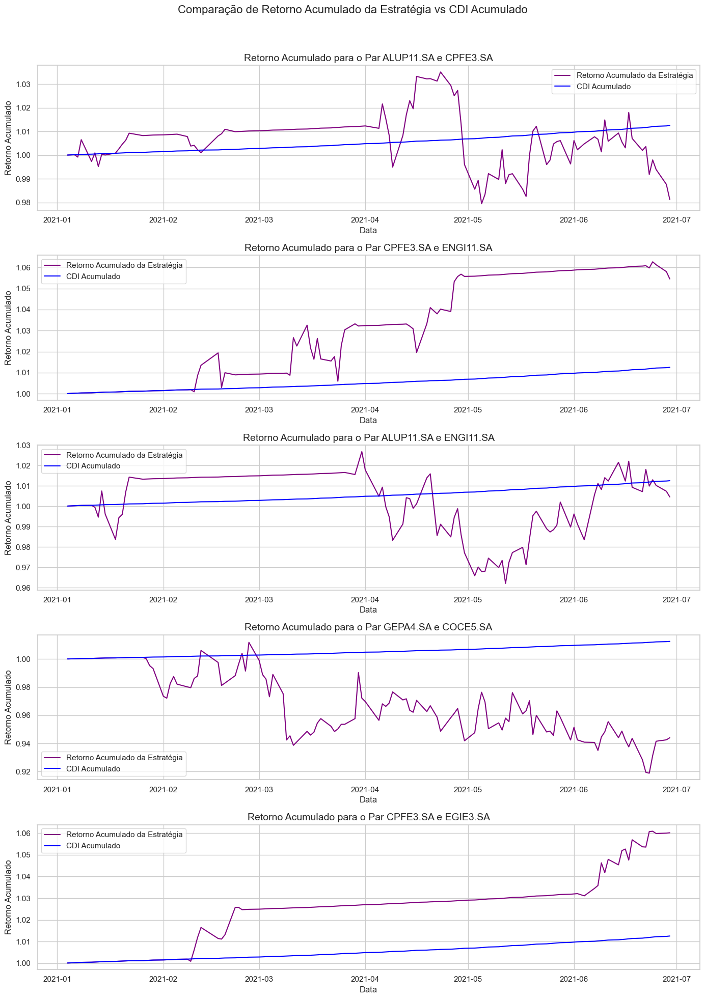

In [83]:
# Definindo a quantidade de pares que queremos visualizar (ajuste conforme necessário)
num_pares_visualizar = 5

# Criando subplots para visualizar as curvas de equity dos primeiros pares cointegrados
fig, ax = plt.subplots(num_pares_visualizar, 1, figsize=(14, 4 * num_pares_visualizar))
fig.suptitle("Comparação de Retorno Acumulado da Estratégia vs CDI Acumulado", fontsize=16)

# Iterando sobre os pares e plotando
for i, (acao1, acao2, z_score_trading, resultado) in enumerate(resultados_retornos_5[:num_pares_visualizar]):
    # Plotando o Retorno Acumulado Conjunto e CDI Acumulado
    ax[i].plot(resultado.index, resultado['Retorno Acumulado Conjunto'], color='purple', label='Retorno Acumulado da Estratégia')
    ax[i].plot(resultado.index, resultado['CDI Acumulado'], color='blue', label='CDI Acumulado')
    
    # Título e configurações do gráfico
    ax[i].set_title(f"Retorno Acumulado para o Par {acao1} e {acao2}", fontsize=14)
    ax[i].set_xlabel("Data")
    ax[i].set_ylabel("Retorno Acumulado")
    ax[i].legend()

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

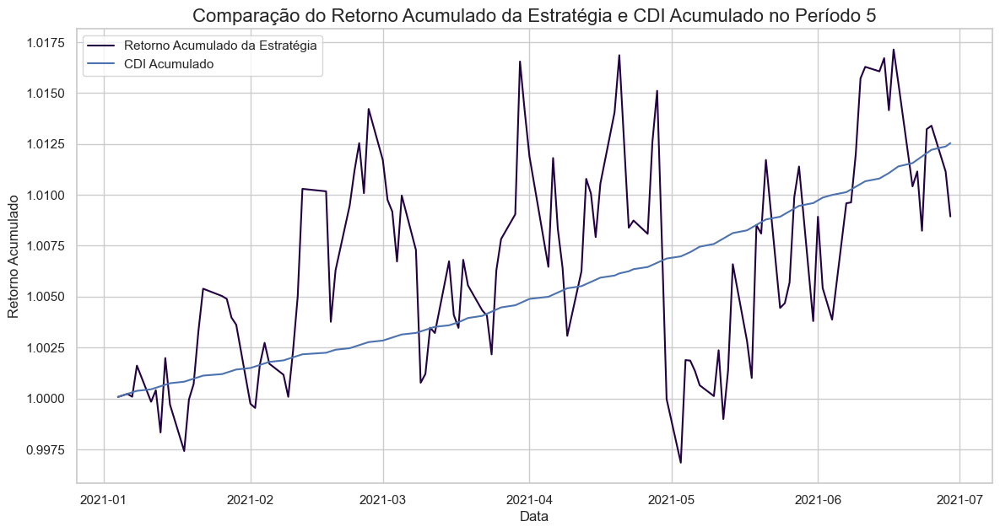

In [84]:
# Plotando o gráfico de comparação
plt.figure(figsize=(14, 7))

# Plotando a curva de Retorno Acumulado da Estratégia
plt.plot(resultado_retornos_periodo_5.index, resultado_retornos_periodo_5['Retorno Acumulado da Estratégia'], label='Retorno Acumulado da Estratégia', color='#220042')

# Plotando a curva de CDI Acumulado
plt.plot(resultado_retornos_periodo_5.index, resultado_retornos_periodo_5['CDI Acumulado'], label='CDI Acumulado', color='b')

# Configurando o título e os rótulos
plt.title('Comparação do Retorno Acumulado da Estratégia e CDI Acumulado no Período 5', fontsize=16)
plt.xlabel('Data', fontsize=12)
plt.ylabel('Retorno Acumulado', fontsize=12)
plt.legend()

# Exibindo o gráfico
plt.show()

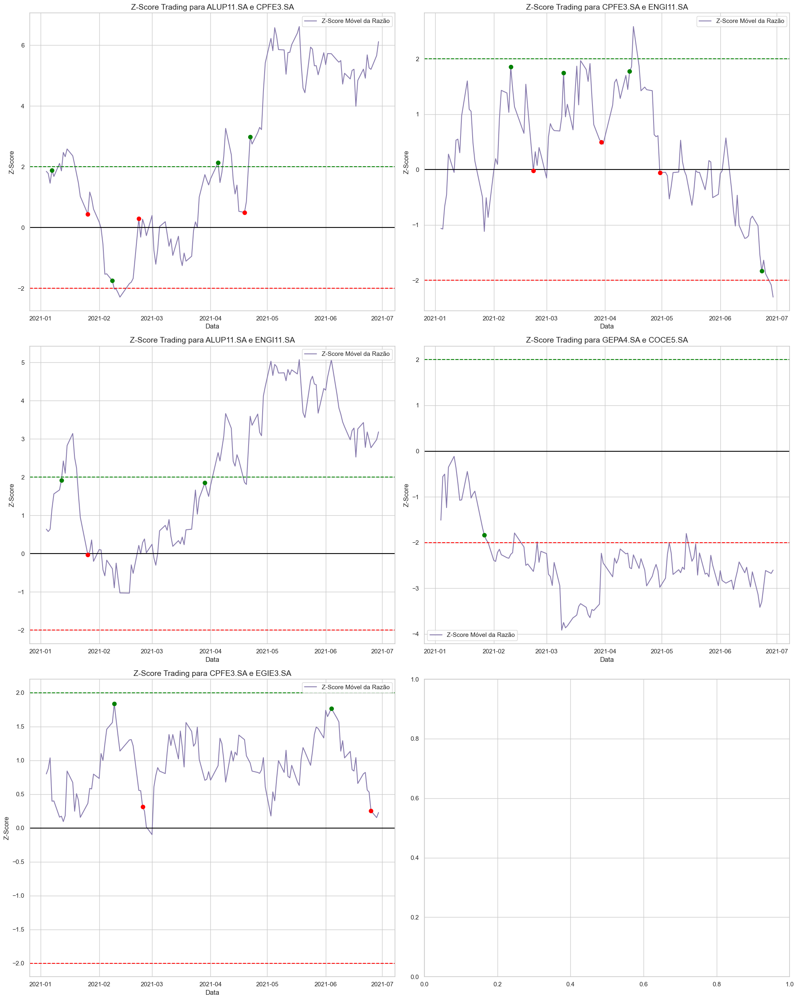

In [85]:
fig, ax = plt.subplots(3, 2, figsize=(20, 25))

for i, (acao1, acao2, z_score_trading, resultado) in enumerate(resultados_retornos_5):
    row = i // 2
    col = i % 2

    ax[row, col].plot(z_score_trading.index, z_score_trading, color='#8477ab', label='Z-Score Móvel da Razão', zorder=1)
    ax[row, col].axhline(0, color='black', zorder=2)
    ax[row, col].axhline(2.0, color='green', linestyle='--', zorder=2)
    ax[row, col].axhline(-2.0, color='red', linestyle='--', zorder=2)

    entradas_short = resultado[resultado['Entrada Short']]
    entradas_long = resultado[resultado['Entrada Long']]
    ax[row, col].scatter(entradas_short.index, z_score_trading.loc[entradas_short.index], color='green', s=50, zorder=3)
    ax[row, col].scatter(entradas_long.index, z_score_trading.loc[entradas_long.index], color='green', s=50, zorder=3)

    saidas_short = resultado[resultado['Saida Short']]
    saidas_long = resultado[resultado['Saida Long']]
    ax[row, col].scatter(saidas_short.index, z_score_trading.loc[saidas_short.index], color='red', s=50, zorder=3)
    ax[row, col].scatter(saidas_long.index, z_score_trading.loc[saidas_long.index], color='red', s=50, zorder=3)

    ax[row, col].set_title(f"Z-Score Trading para {acao1} e {acao2}", fontsize=14)
    ax[row, col].set_xlabel("Data")
    ax[row, col].set_ylabel("Z-Score")
    ax[row, col].legend()

plt.tight_layout()
plt.show()


### **2.6. Período 6**

#### **2.6.1. Cotações das Ações**

In [86]:
cotacoes_formacao_6 = yf.download(acoes_escolhidas, start='2020-07-01', end='2021-06-30')['Adj Close']
cotacoes_trading_6 = yf.download(acoes_escolhidas, start='2021-07-01', end='2021-12-31')['Adj Close']

[*********************100%%**********************]  26 of 26 completed

1 Failed download:
['TRPL4.SA']: Exception('%ticker%: No data found, symbol may be delisted')
[*********************100%%**********************]  26 of 26 completed

1 Failed download:
['TRPL4.SA']: Exception('%ticker%: No data found, symbol may be delisted')


In [87]:
cotacoes_formacao_6 = cotacoes_formacao_6.dropna(axis=1)
cotacoes_trading_6 = cotacoes_trading_6.dropna(axis=1)

In [88]:
# Garantindo que ambos os períodos tenham as mesmas colunas
acoes_intersecao_6 = cotacoes_formacao_6.columns.intersection(cotacoes_trading_6.columns)
cotacoes_formacao_6 = cotacoes_formacao_6[acoes_intersecao_6]
cotacoes_trading_6 = cotacoes_trading_6[acoes_intersecao_6]

# Exibindo as colunas restantes para confirmação
cotacoes_formacao_6.columns, cotacoes_trading_6.columns

(Index(['ALUP11.SA', 'CEBR3.SA', 'CGAS3.SA', 'CLSC4.SA', 'CMIG4.SA', 'COCE5.SA',
        'CPFE3.SA', 'CPLE6.SA', 'CSMG3.SA', 'EGIE3.SA', 'EKTR4.SA', 'ELET3.SA',
        'EMAE4.SA', 'ENEV3.SA', 'ENGI11.SA', 'EQPA3.SA', 'EQTL3.SA', 'GEPA4.SA',
        'LIGT3.SA', 'NEOE3.SA', 'REDE3.SA', 'SAPR11.SA', 'SBSP3.SA',
        'TAEE11.SA'],
       dtype='object', name='Ticker'),
 Index(['ALUP11.SA', 'CEBR3.SA', 'CGAS3.SA', 'CLSC4.SA', 'CMIG4.SA', 'COCE5.SA',
        'CPFE3.SA', 'CPLE6.SA', 'CSMG3.SA', 'EGIE3.SA', 'EKTR4.SA', 'ELET3.SA',
        'EMAE4.SA', 'ENEV3.SA', 'ENGI11.SA', 'EQPA3.SA', 'EQTL3.SA', 'GEPA4.SA',
        'LIGT3.SA', 'NEOE3.SA', 'REDE3.SA', 'SAPR11.SA', 'SBSP3.SA',
        'TAEE11.SA'],
       dtype='object', name='Ticker'))

In [89]:
# Calculando os retornos cumulativos normalizados para o período de formação
cumret_formacao_6 = np.log(cotacoes_formacao_6).diff().cumsum() + 1
cumret_formacao_6.dropna(inplace=True)

# Calculando os retornos cumulativos normalizados para o período de trading
cumret_trading_6 = np.log(cotacoes_trading_6).diff().cumsum() + 1
cumret_trading_6.dropna(inplace=True)

#### **2.6.2. Dados do CDI**

In [90]:
cdi_trading_6 = sgs.get({'CDI': 12}, start='2021-07-01', end='2021-12-31')

# Convertendo o CDI de % diária para formato decimal
cdi_trading_6['CDI'] = cdi_trading_6['CDI'] / 100

# Ajustando o índice para ser compatível com os resultados da estratégia
cdi_trading_6.index = pd.to_datetime(cdi_trading_6.index)

indices_trading_6 = pd.DataFrame(index = cotacoes_trading_6.index)
indices_trading_6['CDI'] = cdi_trading_6['CDI']

#### **2.6.3. Seleção de Pares**

In [91]:
# Usando preços ajustados para o teste de cointegração
pares_cointegrados_6 = test_cointegration(cotacoes_formacao_6)

# Selecionar os 5 pares cointegrados com menores distâncias
top_pairs_6 = select_top_pairs(pares_cointegrados_6, cotacoes_formacao_6, top_n=5)

# Exibir resultados
print("Top 5 pares cointegrados com menores distâncias:")
for s1, s2, p_value, distance in top_pairs_6:
    print(f"{s1} - {s2} | p-valor: {p_value:.4f} | Distância Euclidiana: {distance:.4f}")

Top 5 pares cointegrados com menores distâncias:
EKTR4.SA - TAEE11.SA | p-valor: 0.0000 | Distância Euclidiana: 0.9164
EGIE3.SA - GEPA4.SA | p-valor: 0.0457 | Distância Euclidiana: 1.2985
CPFE3.SA - ENGI11.SA | p-valor: 0.0366 | Distância Euclidiana: 1.3066
CGAS3.SA - NEOE3.SA | p-valor: 0.0291 | Distância Euclidiana: 1.4557
EGIE3.SA - REDE3.SA | p-valor: 0.0114 | Distância Euclidiana: 1.5411


#### **2.6.4. Calculando os Spreads**

In [92]:
# Lista para armazenar os resultados dos spreads no período de trading
resultados_spreads_trading_6 = []

# Iterando sobre os pares selecionados no 'top_pairs'
for s1, s2, p_value, distance in top_pairs_6:
    # Calculando o spread no período de formação para estimar alpha e beta
    serie1_formacao = cotacoes_formacao_6[s1]
    serie2_formacao = cotacoes_formacao_6[s2]
    
    spread_formacao, alpha, beta = calcular_spread(serie1_formacao, serie2_formacao)
    
    # Calculando o spread no período de trading usando os valores de alpha e beta do período de formação
    serie1_trading = cotacoes_trading_6[s1]
    serie2_trading = cotacoes_trading_6[s2]
    
    spread_trading = serie1_trading - (alpha + beta * serie2_trading)
    
    # Armazenando os resultados para o período de trading
    media_spread = spread_formacao.mean()
    desvio_spread = spread_formacao.std()
    
    resultados_spreads_trading_6.append((s1, s2, spread_trading, alpha, beta, media_spread, desvio_spread))

# Exibindo um exemplo dos resultados para verificação
for resultado in resultados_spreads_trading_6[:5]:  # Mostrando apenas os 5 primeiros pares para verificação
    print(f"Par: {resultado[0]} - {resultado[1]}")
    print(f"Alpha: {resultado[3]:.4f}, Beta: {resultado[4]:.4f}")
    print(f"Média do Spread de Formação: {resultado[5]:.4f}, Desvio Padrão do Spread de Formação: {resultado[6]:.4f}")
    print(f"Spread de Trading (primeiros valores):\n{resultado[2].head()}\n")

Par: EKTR4.SA - TAEE11.SA
Alpha: 2.4933, Beta: 0.4104
Média do Spread de Formação: -0.0000, Desvio Padrão do Spread de Formação: 0.5091
Spread de Trading (primeiros valores):
Date
2021-07-01    2.547045
2021-07-02    3.303384
2021-07-05    2.035867
2021-07-06    1.803869
2021-07-07    1.375488
dtype: float64

Par: EGIE3.SA - GEPA4.SA
Alpha: 26.1847, Beta: 0.2308
Média do Spread de Formação: -0.0000, Desvio Padrão do Spread de Formação: 1.0940
Spread de Trading (primeiros valores):
Date
2021-07-01   -1.506232
2021-07-02   -1.336134
2021-07-05   -1.527903
2021-07-06   -1.482886
2021-07-07   -1.369643
dtype: float64

Par: CPFE3.SA - ENGI11.SA
Alpha: 8.8406, Beta: 0.3469
Média do Spread de Formação: 0.0000, Desvio Padrão do Spread de Formação: 0.5636
Spread de Trading (primeiros valores):
Date
2021-07-01   -1.725367
2021-07-02   -1.566145
2021-07-05   -1.448431
2021-07-06   -1.652709
2021-07-07   -1.617402
dtype: float64

Par: CGAS3.SA - NEOE3.SA
Alpha: 49.1873, Beta: 4.4018
Média do Sprea

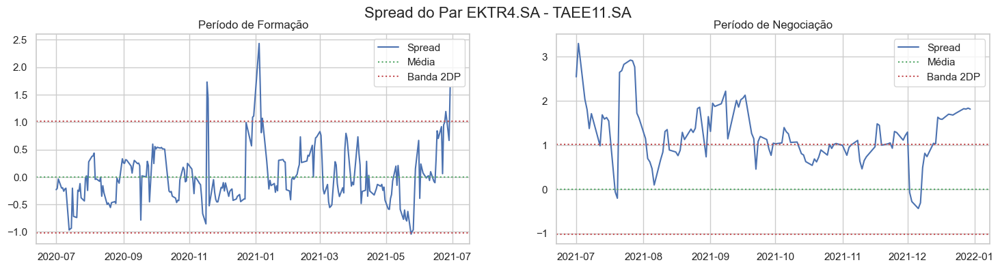

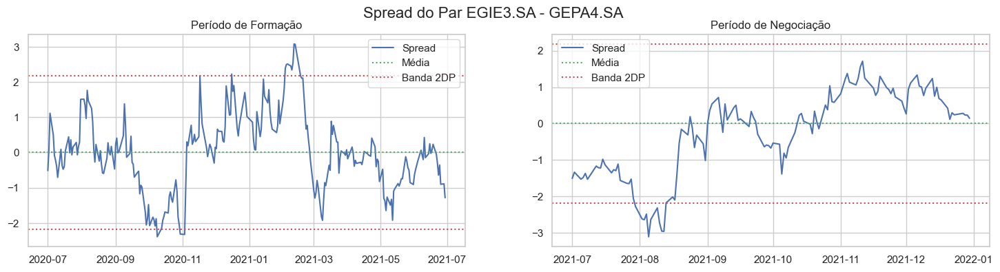

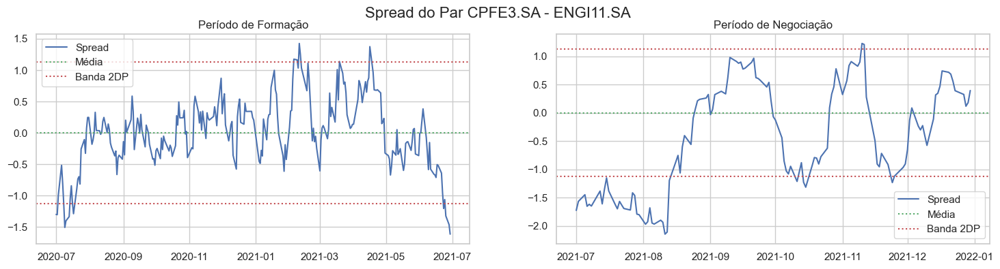

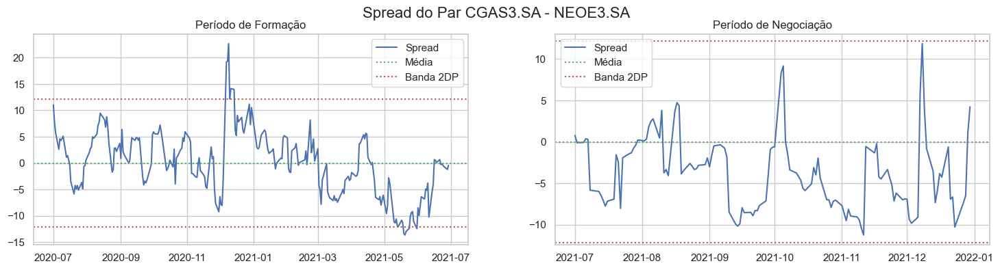

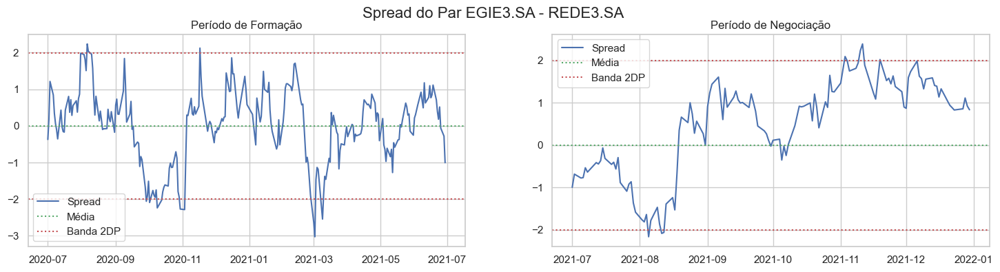

In [93]:
def plot_spreads(resultados_spreads_trading):
    """
    Plota os spreads de formação e de negociação para os pares selecionados.
    """
    for s1, s2, spread_trading, alpha, beta, media_spread, desvio_spread in resultados_spreads_trading:
        # Calculando o spread para o período de formação usando os valores armazenados
        spread_formacao = cotacoes_formacao_6[s1] - (alpha + beta * cotacoes_formacao_6[s2])

        # Criando gráficos lado a lado
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 4))
        fig.suptitle(f'Spread do Par {s1} - {s2}', fontsize=16)

        # Período de formação
        ax1.plot(spread_formacao, label='Spread')
        ax1.axhline(y=media_spread, color='g', linestyle='dotted', label='Média')
        ax1.axhline(y=media_spread + 2 * desvio_spread, color='r', linestyle='dotted', label='Banda 2DP')
        ax1.axhline(y=media_spread - 2 * desvio_spread, color='r', linestyle='dotted')
        ax1.set_title('Período de Formação')
        ax1.legend()

        # Período de negociação
        ax2.plot(spread_trading, label='Spread')
        ax2.axhline(y=media_spread, color='g', linestyle='dotted', label='Média')
        ax2.axhline(y=media_spread + 2 * desvio_spread, color='r', linestyle='dotted', label='Banda 2DP')
        ax2.axhline(y=media_spread - 2 * desvio_spread, color='r', linestyle='dotted')
        ax2.set_title('Período de Negociação')
        ax2.legend()

        plt.show()

# Chamando a função para os pares em resultados_spreads_trading_5
plot_spreads(resultados_spreads_trading_6)

#### **2.6.5. Definindo os Sinais da Estratégia**

In [94]:
resultados_z_scores_trading_6 = []

for acao1, acao2, spread_trading, alpha, beta, media_spread, desvio_spread in resultados_spreads_trading_6:
    z_score_trading = (spread_trading - media_spread) / desvio_spread
    resultados_z_scores_trading_6.append((acao1, acao2, z_score_trading))
    print(f"Par: {acao1} e {acao2} - Média do Z-score: {z_score_trading.mean():.4f}, Desvio Padrão do Z-score: {z_score_trading.std():.4f}\n")

Par: EKTR4.SA e TAEE11.SA - Média do Z-score: 2.4505, Desvio Padrão do Z-score: 1.3235

Par: EGIE3.SA e GEPA4.SA - Média do Z-score: -0.2331, Desvio Padrão do Z-score: 1.0638

Par: CPFE3.SA e ENGI11.SA - Média do Z-score: -0.7974, Desvio Padrão do Z-score: 1.6720

Par: CGAS3.SA e NEOE3.SA - Média do Z-score: -0.6001, Desvio Padrão do Z-score: 0.7313

Par: EGIE3.SA e REDE3.SA - Média do Z-score: 0.4776, Desvio Padrão do Z-score: 1.1112



In [95]:
sinais_trade_list_6 = []

for acao1, acao2, z_score_trading in resultados_z_scores_trading_6:
    sinais_trade = pd.DataFrame(index=z_score_trading.index)
    sinais_trade[f'Preços {acao1}'] = cotacoes_trading_6[acao1]
    sinais_trade[f'Preços {acao2}'] = cotacoes_trading_6[acao2]

    posicao_short_ativa = False
    posicao_long_ativa = False

    entradas_short = []
    entradas_long = []
    saidas_short = []
    saidas_long = []

    for i in range(len(sinais_trade)):
        if not posicao_short_ativa and not posicao_long_ativa:
            if (z_score_trading.iloc[i] > sinal_entrada) and (z_score_trading.shift(1).iloc[i] < sinal_entrada):
                entradas_short.append(True)
                entradas_long.append(False)
                posicao_short_ativa = True
            elif (z_score_trading.iloc[i] < -sinal_entrada) and (z_score_trading.shift(1).iloc[i] > -sinal_entrada):
                entradas_long.append(True)
                entradas_short.append(False)
                posicao_long_ativa = True
            else:
                entradas_short.append(False)
                entradas_long.append(False)
        else:
            entradas_short.append(False)
            entradas_long.append(False)

        if posicao_short_ativa:
            saida = (z_score_trading.iloc[i] < sinal_saida) and (z_score_trading.shift(1).iloc[i] > sinal_saida)
            saidas_short.append(saida)
            saidas_long.append(False)
            if saida:
                posicao_short_ativa = False
        elif posicao_long_ativa:
            saida = (z_score_trading.iloc[i] > -sinal_saida) and (z_score_trading.shift(1).iloc[i] < -sinal_saida)
            saidas_long.append(saida)
            saidas_short.append(False)
            if saida:
                posicao_long_ativa = False
        else:
            saidas_short.append(False)
            saidas_long.append(False)

    sinais_trade['Entrada Short'] = entradas_short
    sinais_trade['Entrada Long'] = entradas_long
    sinais_trade['Saida Short'] = saidas_short
    sinais_trade['Saida Long'] = saidas_long

    sinais_trade_list_6.append((acao1, acao2, z_score_trading, sinais_trade))

#### **2.6.6. Calculando os Retornos**

In [96]:
resultado_backtest_todos_pares_6 = []

for acao1, acao2, z_score_trading, sinais_trade in sinais_trade_list_6:
    resultado = pd.DataFrame(index=sinais_trade.index)
    resultado[f'{acao1}'] = cotacoes_trading_6[acao1]
    resultado[f'{acao2}'] = cotacoes_trading_6[acao2]
    resultado['CDI'] = indices_trading_6['CDI']
    resultado['Entrada Short'] = sinais_trade['Entrada Short']
    resultado['Saida Short'] = sinais_trade['Saida Short']
    resultado['Entrada Long'] = sinais_trade['Entrada Long']
    resultado['Saida Long'] = sinais_trade['Saida Long']

    retorno_acao1 = []
    retorno_acao2 = []

    posicao_short_ativa = False
    posicao_long_ativa = False

    for i in range(len(sinais_trade)):
        if sinais_trade['Entrada Short'].iloc[i]:
            posicao_short_ativa = True
            retorno_acao1.append(-0.001)
            retorno_acao2.append(-0.001)
        elif sinais_trade['Entrada Long'].iloc[i]:
            posicao_long_ativa = True
            retorno_acao1.append(-0.001)
            retorno_acao2.append(-0.001)
        elif posicao_short_ativa:
            if sinais_trade['Saida Short'].iloc[i]:
                retorno_acao1.append(-0.001)
                retorno_acao2.append(-0.001)
                posicao_short_ativa = False
            else:
                retorno_acao1.append(-(cotacoes_trading_6[acao1].iloc[i] / cotacoes_trading_6[acao1].iloc[i-1] - 1))
                retorno_acao2.append(cotacoes_trading_6[acao2].iloc[i] / cotacoes_trading_6[acao2].iloc[i-1] - 1)
        elif posicao_long_ativa:
            if sinais_trade['Saida Long'].iloc[i]:
                retorno_acao1.append(-0.001)
                retorno_acao2.append(-0.001)
                posicao_long_ativa = False
            else:
                retorno_acao1.append(cotacoes_trading_6[acao1].iloc[i] / cotacoes_trading_6[acao1].iloc[i-1] - 1)
                retorno_acao2.append(-(cotacoes_trading_6[acao2].iloc[i] / cotacoes_trading_6[acao2].iloc[i-1] - 1))
        else:
            retorno_acao1.append(resultado['CDI'].iloc[i])
            retorno_acao2.append(resultado['CDI'].iloc[i])

    resultado[f"Retorno {acao1}"] = retorno_acao1
    resultado[f"Retorno {acao2}"] = retorno_acao2

    resultado_backtest_todos_pares_6.append((acao1, acao2, z_score_trading, resultado))

In [97]:
# Lista para armazenar os retornos acumulados de cada par e da estratégia conjunta
resultados_retornos_6 = []

# Iterando sobre cada resultado do backtest em resultado_backtest_todos_pares
for acao1, acao2, z_score_trading, resultado in resultado_backtest_todos_pares_6:
    # Inicializando os retornos acumulados
    retorno_acumulado_acao1 = 1
    retorno_acumulado_acao2 = 1
    cdi_acumulado = 1
    retorno_acumulado_acao1_list = []
    retorno_acumulado_acao2_list = []
    cdi_acumulado_list = []
    retorno_acumulado_conjunto_list = []

    # Iterando sobre as datas do DataFrame para calcular os retornos acumulados
    for i in range(len(resultado)):
        # Calculando o retorno acumulado de nome1, nome2 e cdi
        retorno_acumulado_acao1 *= (1 + resultado[f"Retorno {acao1}"].iloc[i])
        retorno_acumulado_acao2 *= (1 + resultado[f"Retorno {acao2}"].iloc[i])
        cdi_acumulado *= (1 + resultado['CDI'].iloc[i])

        # Adicionando os valores à lista de retorno acumulado
        retorno_acumulado_acao1_list.append(retorno_acumulado_acao1)
        retorno_acumulado_acao2_list.append(retorno_acumulado_acao2)
        cdi_acumulado_list.append(cdi_acumulado)

        # Calculando o retorno acumulado conjunto (média dos acumulados)
        retorno_acumulado_conjunto = (retorno_acumulado_acao1 + retorno_acumulado_acao2) / 2
        retorno_acumulado_conjunto_list.append(retorno_acumulado_conjunto)

    # Adicionando os retornos acumulados ao DataFrame de resultado
    resultado[f"Retorno Acumulado {acao1}"] = retorno_acumulado_acao1_list
    resultado[f"Retorno Acumulado {acao2}"] = retorno_acumulado_acao2_list
    resultado['CDI Acumulado'] = cdi_acumulado_list
    resultado['Retorno Acumulado Conjunto'] = retorno_acumulado_conjunto_list

    # Adicionando o resultado do par à lista de resultados acumulados
    resultados_retornos_6.append((acao1, acao2, z_score_trading, resultado))

In [98]:
# Inicializando um DataFrame vazio com o índice de datas baseado no primeiro resultado
resultado_retornos_periodo_6 = pd.DataFrame(index=resultados_retornos_6[0][3].index)

# Adicionando as colunas de retorno acumulado conjunto de cada par
for acao1, acao2, z_score_trading, resultado in resultados_retornos_6:
    coluna_nome = f"{acao1}-{acao2} Retorno Acumulado Conjunto"
    resultado_retornos_periodo_6[coluna_nome] = resultado['Retorno Acumulado Conjunto']

# Calculando a média dos retornos acumulados de todos os pares para criar a coluna 'Retorno Acumulado da Estratégia'
resultado_retornos_periodo_6['Retorno Acumulado da Estratégia'] = resultado_retornos_periodo_6.mean(axis=1)

# Adicionando a coluna de 'CDI Acumulado' para comparação
resultado_retornos_periodo_6['CDI Acumulado'] = resultados_retornos_6[0][3]['CDI Acumulado']

# Exibindo o DataFrame resultante
display(resultado_retornos_periodo_6)

,EKTR4.SA-TAEE11.SA Retorno Acumulado Conjunto,EGIE3.SA-GEPA4.SA Retorno Acumulado Conjunto,CPFE3.SA-ENGI11.SA Retorno Acumulado Conjunto,CGAS3.SA-NEOE3.SA Retorno Acumulado Conjunto,EGIE3.SA-REDE3.SA Retorno Acumulado Conjunto,Retorno Acumulado da Estratégia,CDI Acumulado
Date,,,,,,,
2021-07-01,1.000161,1.000161,1.000161,1.000161,1.000161,1.000161,1.000161
2021-07-02,1.000323,1.000323,1.000323,1.000323,1.000323,1.000323,1.000323
2021-07-05,1.000484,1.000484,1.000484,1.000484,1.000484,1.000484,1.000484
2021-07-06,1.000646,1.000646,1.000646,1.000646,1.000646,1.000646,1.000646
2021-07-07,1.000807,1.000807,1.000807,1.000807,1.000807,1.000807,1.000807
...,...,...,...,...,...,...,...
2021-12-23,1.021725,1.047372,1.038047,1.054380,1.083055,1.048916,1.028750
2021-12-27,1.017814,1.047736,1.038408,1.054746,1.083984,1.048538,1.029108
2021-12-28,1.018195,1.048100,1.038769,1.055113,1.065624,1.045160,1.029465


#### **2.6.7. Visualizando os Retornos**

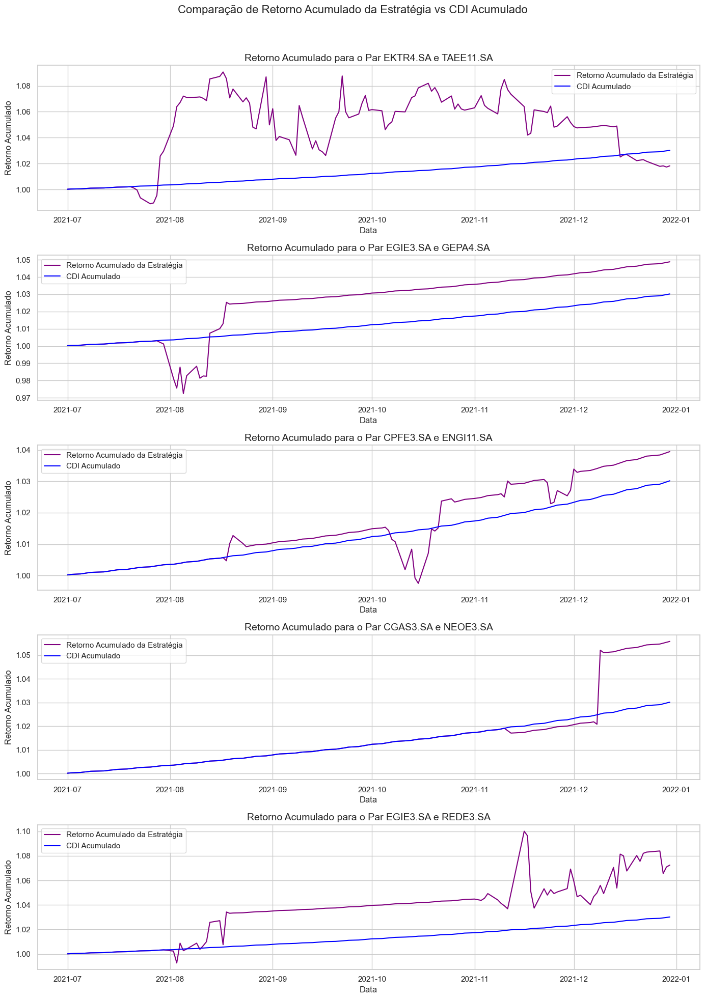

In [99]:
# Definindo a quantidade de pares que queremos visualizar (ajuste conforme necessário)
num_pares_visualizar = 5

# Criando subplots para visualizar as curvas de equity dos primeiros pares cointegrados
fig, ax = plt.subplots(num_pares_visualizar, 1, figsize=(14, 4 * num_pares_visualizar))
fig.suptitle("Comparação de Retorno Acumulado da Estratégia vs CDI Acumulado", fontsize=16)

# Iterando sobre os pares e plotando
for i, (acao1, acao2, z_score_trading, resultado) in enumerate(resultados_retornos_6[:num_pares_visualizar]):
    # Plotando o Retorno Acumulado Conjunto e CDI Acumulado
    ax[i].plot(resultado.index, resultado['Retorno Acumulado Conjunto'], color='purple', label='Retorno Acumulado da Estratégia')
    ax[i].plot(resultado.index, resultado['CDI Acumulado'], color='blue', label='CDI Acumulado')
    
    # Título e configurações do gráfico
    ax[i].set_title(f"Retorno Acumulado para o Par {acao1} e {acao2}", fontsize=14)
    ax[i].set_xlabel("Data")
    ax[i].set_ylabel("Retorno Acumulado")
    ax[i].legend()

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

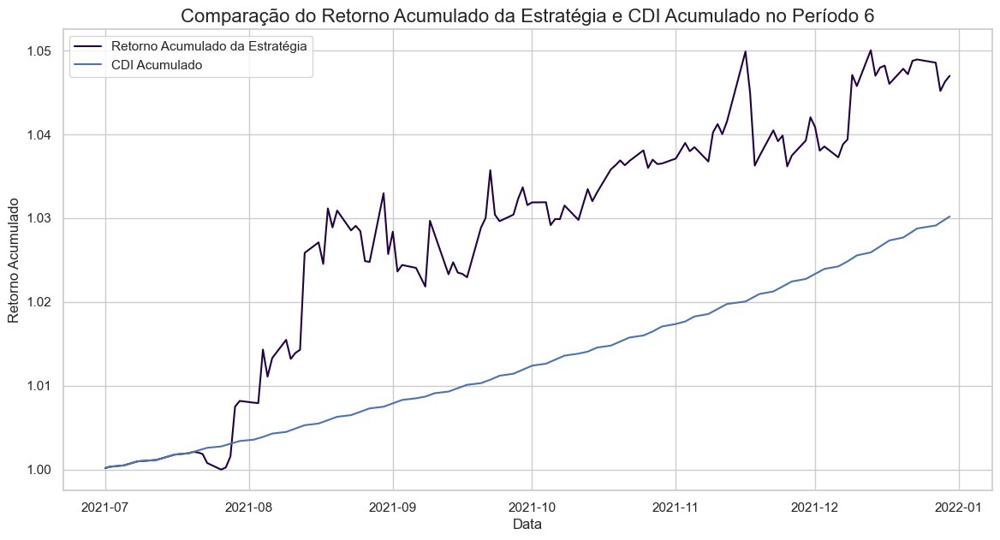

In [100]:
# Plotando o gráfico de comparação
plt.figure(figsize=(14, 7))

# Plotando a curva de Retorno Acumulado da Estratégia
plt.plot(resultado_retornos_periodo_6.index, resultado_retornos_periodo_6['Retorno Acumulado da Estratégia'], label='Retorno Acumulado da Estratégia', color='#220042')

# Plotando a curva de CDI Acumulado
plt.plot(resultado_retornos_periodo_6.index, resultado_retornos_periodo_6['CDI Acumulado'], label='CDI Acumulado', color='b')

# Configurando o título e os rótulos
plt.title('Comparação do Retorno Acumulado da Estratégia e CDI Acumulado no Período 6', fontsize=16)
plt.xlabel('Data', fontsize=12)
plt.ylabel('Retorno Acumulado', fontsize=12)
plt.legend()

# Exibindo o gráfico
plt.show()

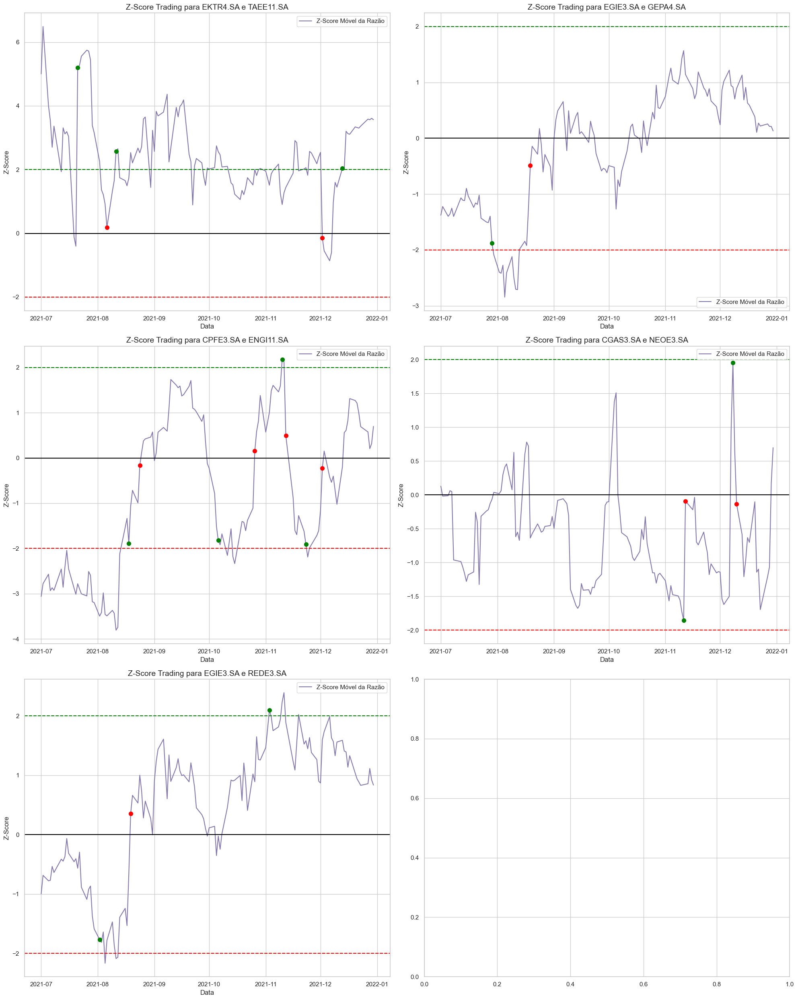

In [101]:
fig, ax = plt.subplots(3, 2, figsize=(20, 25))

for i, (acao1, acao2, z_score_trading, resultado) in enumerate(resultados_retornos_6):
    row = i // 2
    col = i % 2

    ax[row, col].plot(z_score_trading.index, z_score_trading, color='#8477ab', label='Z-Score Móvel da Razão', zorder=1)
    ax[row, col].axhline(0, color='black', zorder=2)
    ax[row, col].axhline(2.0, color='green', linestyle='--', zorder=2)
    ax[row, col].axhline(-2.0, color='red', linestyle='--', zorder=2)

    entradas_short = resultado[resultado['Entrada Short']]
    entradas_long = resultado[resultado['Entrada Long']]
    ax[row, col].scatter(entradas_short.index, z_score_trading.loc[entradas_short.index], color='green', s=50, zorder=3)
    ax[row, col].scatter(entradas_long.index, z_score_trading.loc[entradas_long.index], color='green', s=50, zorder=3)

    saidas_short = resultado[resultado['Saida Short']]
    saidas_long = resultado[resultado['Saida Long']]
    ax[row, col].scatter(saidas_short.index, z_score_trading.loc[saidas_short.index], color='red', s=50, zorder=3)
    ax[row, col].scatter(saidas_long.index, z_score_trading.loc[saidas_long.index], color='red', s=50, zorder=3)

    ax[row, col].set_title(f"Z-Score Trading para {acao1} e {acao2}", fontsize=14)
    ax[row, col].set_xlabel("Data")
    ax[row, col].set_ylabel("Z-Score")
    ax[row, col].legend()

plt.tight_layout()
plt.show()

### **2.7. Período 7**

#### **2.7.1. Cotações das Ações**

In [102]:
cotacoes_formacao_7 = yf.download(acoes_escolhidas, start='2021-01-01', end='2021-12-31')['Adj Close']
cotacoes_trading_7 = yf.download(acoes_escolhidas, start='2022-01-01', end='2022-06-30')['Adj Close']

[*********************100%%**********************]  26 of 26 completed

1 Failed download:
['TRPL4.SA']: Exception('%ticker%: No data found, symbol may be delisted')
[*********************100%%**********************]  26 of 26 completed

1 Failed download:
['TRPL4.SA']: Exception('%ticker%: No data found, symbol may be delisted')


In [103]:
cotacoes_formacao_7 = cotacoes_formacao_7.dropna(axis=1)
cotacoes_trading_7 = cotacoes_trading_7.dropna(axis=1)

In [104]:
# Garantindo que ambos os períodos tenham as mesmas colunas
acoes_intersecao_7 = cotacoes_formacao_7.columns.intersection(cotacoes_trading_7.columns)
cotacoes_formacao_7 = cotacoes_formacao_7[acoes_intersecao_7]
cotacoes_trading_7 = cotacoes_trading_7[acoes_intersecao_7]

# Exibindo as colunas restantes para confirmação
cotacoes_formacao_7.columns, cotacoes_trading_7.columns

(Index(['ALUP11.SA', 'AMBP3.SA', 'CEBR3.SA', 'CGAS3.SA', 'CLSC4.SA', 'CMIG4.SA',
        'COCE5.SA', 'CPFE3.SA', 'CPLE6.SA', 'CSMG3.SA', 'EGIE3.SA', 'EKTR4.SA',
        'ELET3.SA', 'EMAE4.SA', 'ENEV3.SA', 'ENGI11.SA', 'EQPA3.SA', 'EQTL3.SA',
        'GEPA4.SA', 'LIGT3.SA', 'NEOE3.SA', 'REDE3.SA', 'SAPR11.SA', 'SBSP3.SA',
        'TAEE11.SA'],
       dtype='object', name='Ticker'),
 Index(['ALUP11.SA', 'AMBP3.SA', 'CEBR3.SA', 'CGAS3.SA', 'CLSC4.SA', 'CMIG4.SA',
        'COCE5.SA', 'CPFE3.SA', 'CPLE6.SA', 'CSMG3.SA', 'EGIE3.SA', 'EKTR4.SA',
        'ELET3.SA', 'EMAE4.SA', 'ENEV3.SA', 'ENGI11.SA', 'EQPA3.SA', 'EQTL3.SA',
        'GEPA4.SA', 'LIGT3.SA', 'NEOE3.SA', 'REDE3.SA', 'SAPR11.SA', 'SBSP3.SA',
        'TAEE11.SA'],
       dtype='object', name='Ticker'))

In [105]:
# Calculando os retornos cumulativos normalizados para o período de formação
cumret_formacao_7 = np.log(cotacoes_formacao_7).diff().cumsum() + 1
cumret_formacao_7.dropna(inplace=True)

# Calculando os retornos cumulativos normalizados para o período de trading
cumret_trading_7 = np.log(cotacoes_trading_7).diff().cumsum() + 1
cumret_trading_7.dropna(inplace=True)

#### **2.7.2. Dados do CDI**

In [106]:
cdi_trading_7 = sgs.get({'CDI': 12}, start='2022-01-01', end='2022-06-30')

# Convertendo o CDI de % diária para formato decimal
cdi_trading_7['CDI'] = cdi_trading_7['CDI'] / 100

# Ajustando o índice para ser compatível com os resultados da estratégia
cdi_trading_7.index = pd.to_datetime(cdi_trading_7.index)

indices_trading_7 = pd.DataFrame(index = cotacoes_trading_7.index)
indices_trading_7['CDI'] = cdi_trading_7['CDI']

#### **2.7.3. Seleção de Pares**

In [107]:
# Usando preços ajustados para o teste de cointegração
pares_cointegrados_7 = test_cointegration(cotacoes_formacao_7)

# Selecionar os 5 pares cointegrados com menores distâncias
top_pairs_7 = select_top_pairs(pares_cointegrados_7, cotacoes_formacao_7, top_n=5)

# Exibir resultados
print("Top 5 pares cointegrados com menores distâncias:")
for s1, s2, p_value, distance in top_pairs_7:
    print(f"{s1} - {s2} | p-valor: {p_value:.4f} | Distância Euclidiana: {distance:.4f}")

Top 5 pares cointegrados com menores distâncias:
CPFE3.SA - EGIE3.SA | p-valor: 0.0360 | Distância Euclidiana: 0.4552
CGAS3.SA - EGIE3.SA | p-valor: 0.0135 | Distância Euclidiana: 0.9409
CGAS3.SA - ENGI11.SA | p-valor: 0.0007 | Distância Euclidiana: 0.9774
ENGI11.SA - GEPA4.SA | p-valor: 0.0371 | Distância Euclidiana: 1.0055
CGAS3.SA - NEOE3.SA | p-valor: 0.0066 | Distância Euclidiana: 1.0694


#### **2.7.4. Calculando os Spreads**

In [108]:
# Lista para armazenar os resultados dos spreads no período de trading
resultados_spreads_trading_7 = []

# Iterando sobre os pares selecionados no 'top_pairs'
for s1, s2, p_value, distance in top_pairs_7:
    # Calculando o spread no período de formação para estimar alpha e beta
    serie1_formacao = cotacoes_formacao_7[s1]
    serie2_formacao = cotacoes_formacao_7[s2]
    
    spread_formacao, alpha, beta = calcular_spread(serie1_formacao, serie2_formacao)
    
    # Calculando o spread no período de trading usando os valores de alpha e beta do período de formação
    serie1_trading = cotacoes_trading_7[s1]
    serie2_trading = cotacoes_trading_7[s2]
    
    spread_trading = serie1_trading - (alpha + beta * serie2_trading)
    
    # Armazenando os resultados para o período de trading
    media_spread = spread_formacao.mean()
    desvio_spread = spread_formacao.std()
    
    resultados_spreads_trading_7.append((s1, s2, spread_trading, alpha, beta, media_spread, desvio_spread))

# Exibindo um exemplo dos resultados para verificação
for resultado in resultados_spreads_trading_7[:5]:  # Mostrando apenas os 5 primeiros pares para verificação
    print(f"Par: {resultado[0]} - {resultado[1]}")
    print(f"Alpha: {resultado[3]:.4f}, Beta: {resultado[4]:.4f}")
    print(f"Média do Spread de Formação: {resultado[5]:.4f}, Desvio Padrão do Spread de Formação: {resultado[6]:.4f}")
    print(f"Spread de Trading (primeiros valores):\n{resultado[2].head()}\n")

Par: CPFE3.SA - EGIE3.SA
Alpha: -2.3053, Beta: 0.7682
Média do Spread de Formação: -0.0000, Desvio Padrão do Spread de Formação: 0.6172
Spread de Trading (primeiros valores):
Date
2022-01-03    0.031046
2022-01-04   -0.098331
2022-01-05   -0.101579
2022-01-06   -0.413662
2022-01-07    0.013475
dtype: float64

Par: CGAS3.SA - EGIE3.SA
Alpha: 52.0908, Beta: 1.7948
Média do Spread de Formação: -0.0000, Desvio Padrão do Spread de Formação: 5.8875
Spread de Trading (primeiros valores):
Date
2022-01-03    1.024527
2022-01-04    0.878055
2022-01-05    1.669021
2022-01-06   -3.957824
2022-01-07   -0.240572
dtype: float64

Par: CGAS3.SA - ENGI11.SA
Alpha: 34.4273, Beta: 1.9478
Média do Spread de Formação: -0.0000, Desvio Padrão do Spread de Formação: 5.1287
Spread de Trading (primeiros valores):
Date
2022-01-03    3.394860
2022-01-04    4.256356
2022-01-05    4.414600
2022-01-06   -0.983570
2022-01-07    2.701415
dtype: float64

Par: ENGI11.SA - GEPA4.SA
Alpha: 26.9454, Beta: 0.4776
Média do Sp

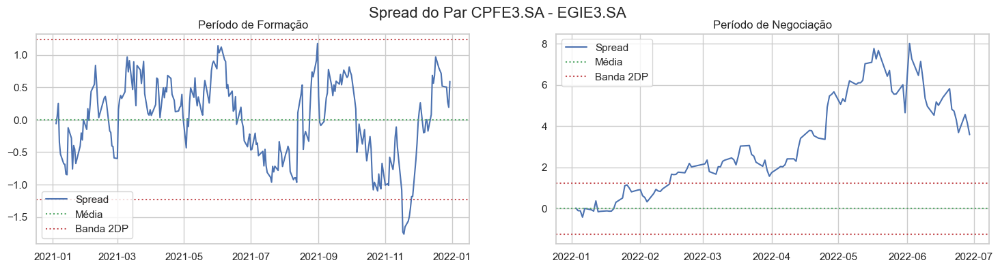

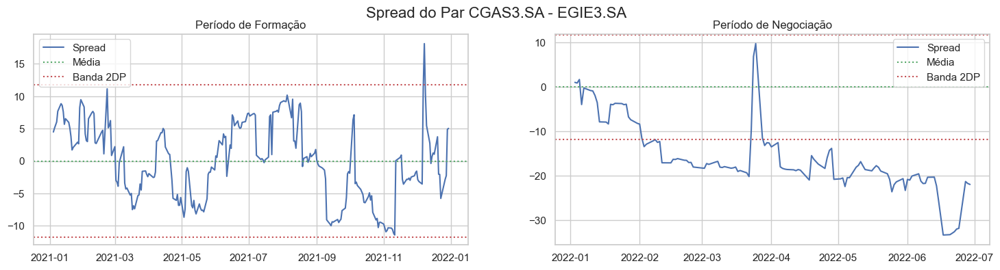

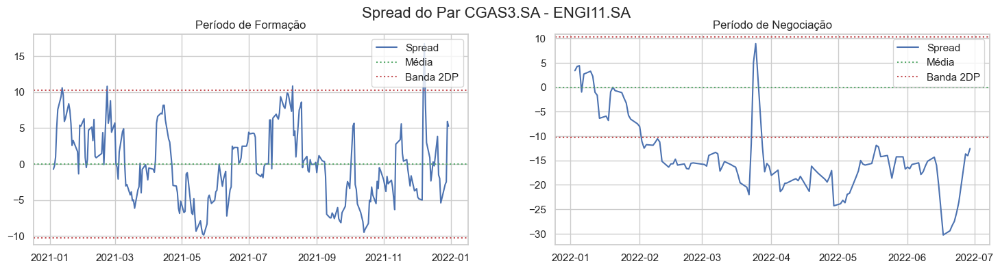

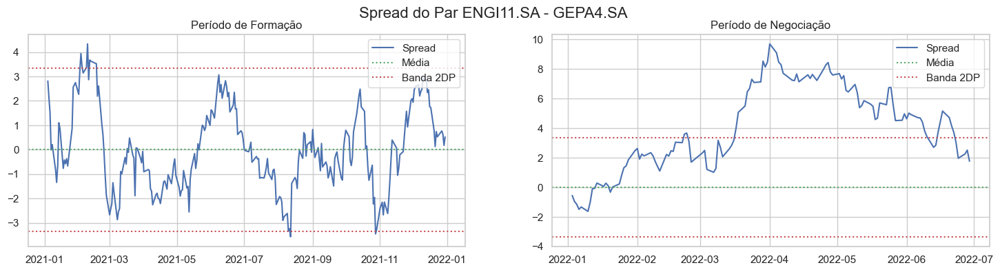

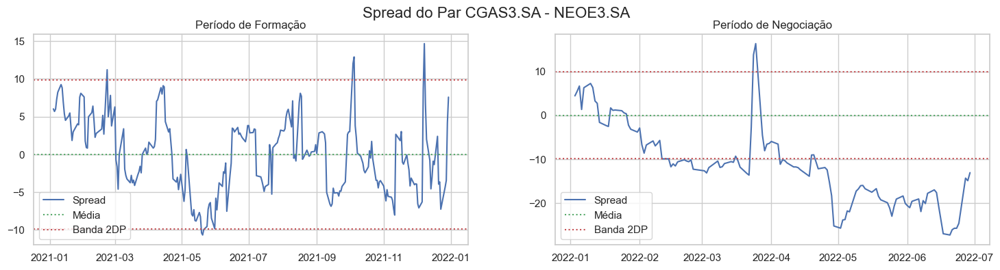

In [109]:
def plot_spreads(resultados_spreads_trading):
    """
    Plota os spreads de formação e de negociação para os pares selecionados.
    """
    for s1, s2, spread_trading, alpha, beta, media_spread, desvio_spread in resultados_spreads_trading:
        # Calculando o spread para o período de formação usando os valores armazenados
        spread_formacao = cotacoes_formacao_7[s1] - (alpha + beta * cotacoes_formacao_7[s2])

        # Criando gráficos lado a lado
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 4))
        fig.suptitle(f'Spread do Par {s1} - {s2}', fontsize=16)

        # Período de formação
        ax1.plot(spread_formacao, label='Spread')
        ax1.axhline(y=media_spread, color='g', linestyle='dotted', label='Média')
        ax1.axhline(y=media_spread + 2 * desvio_spread, color='r', linestyle='dotted', label='Banda 2DP')
        ax1.axhline(y=media_spread - 2 * desvio_spread, color='r', linestyle='dotted')
        ax1.set_title('Período de Formação')
        ax1.legend()

        # Período de negociação
        ax2.plot(spread_trading, label='Spread')
        ax2.axhline(y=media_spread, color='g', linestyle='dotted', label='Média')
        ax2.axhline(y=media_spread + 2 * desvio_spread, color='r', linestyle='dotted', label='Banda 2DP')
        ax2.axhline(y=media_spread - 2 * desvio_spread, color='r', linestyle='dotted')
        ax2.set_title('Período de Negociação')
        ax2.legend()

        plt.show()

# Chamando a função para os pares em resultados_spreads_trading_5
plot_spreads(resultados_spreads_trading_7)

#### **2.7.5. Definindo os Sinais da Estratégia**

In [110]:
resultados_z_scores_trading_7 = []

for acao1, acao2, spread_trading, alpha, beta, media_spread, desvio_spread in resultados_spreads_trading_7:
    z_score_trading = (spread_trading - media_spread) / desvio_spread
    resultados_z_scores_trading_7.append((acao1, acao2, z_score_trading))
    print(f"Par: {acao1} e {acao2} - Média do Z-score: {z_score_trading.mean():.4f}, Desvio Padrão do Z-score: {z_score_trading.std():.4f}\n")

Par: CPFE3.SA e EGIE3.SA - Média do Z-score: 5.1004, Desvio Padrão do Z-score: 3.7548

Par: CGAS3.SA e EGIE3.SA - Média do Z-score: -2.6653, Desvio Padrão do Z-score: 1.3332

Par: CGAS3.SA e ENGI11.SA - Média do Z-score: -2.7326, Desvio Padrão do Z-score: 1.4859

Par: ENGI11.SA e GEPA4.SA - Média do Z-score: 2.4189, Desvio Padrão do Z-score: 1.6954

Par: CGAS3.SA e NEOE3.SA - Média do Z-score: -2.2834, Desvio Padrão do Z-score: 1.8131



In [111]:
sinais_trade_list_7 = []

for acao1, acao2, z_score_trading in resultados_z_scores_trading_7:
    sinais_trade = pd.DataFrame(index=z_score_trading.index)
    sinais_trade[f'Preços {acao1}'] = cotacoes_trading_7[acao1]
    sinais_trade[f'Preços {acao2}'] = cotacoes_trading_7[acao2]

    posicao_short_ativa = False
    posicao_long_ativa = False

    entradas_short = []
    entradas_long = []
    saidas_short = []
    saidas_long = []

    for i in range(len(sinais_trade)):
        if not posicao_short_ativa and not posicao_long_ativa:
            if (z_score_trading.iloc[i] > sinal_entrada) and (z_score_trading.shift(1).iloc[i] < sinal_entrada):
                entradas_short.append(True)
                entradas_long.append(False)
                posicao_short_ativa = True
            elif (z_score_trading.iloc[i] < -sinal_entrada) and (z_score_trading.shift(1).iloc[i] > -sinal_entrada):
                entradas_long.append(True)
                entradas_short.append(False)
                posicao_long_ativa = True
            else:
                entradas_short.append(False)
                entradas_long.append(False)
        else:
            entradas_short.append(False)
            entradas_long.append(False)

        if posicao_short_ativa:
            saida = (z_score_trading.iloc[i] < sinal_saida) and (z_score_trading.shift(1).iloc[i] > sinal_saida)
            saidas_short.append(saida)
            saidas_long.append(False)
            if saida:
                posicao_short_ativa = False
        elif posicao_long_ativa:
            saida = (z_score_trading.iloc[i] > -sinal_saida) and (z_score_trading.shift(1).iloc[i] < -sinal_saida)
            saidas_long.append(saida)
            saidas_short.append(False)
            if saida:
                posicao_long_ativa = False
        else:
            saidas_short.append(False)
            saidas_long.append(False)

    sinais_trade['Entrada Short'] = entradas_short
    sinais_trade['Entrada Long'] = entradas_long
    sinais_trade['Saida Short'] = saidas_short
    sinais_trade['Saida Long'] = saidas_long

    sinais_trade_list_7.append((acao1, acao2, z_score_trading, sinais_trade))

#### **2.7.6. Calculando os Retornos**

In [112]:
resultado_backtest_todos_pares_7 = []

for acao1, acao2, z_score_trading, sinais_trade in sinais_trade_list_7:
    resultado = pd.DataFrame(index=sinais_trade.index)
    resultado[f'{acao1}'] = cotacoes_trading_7[acao1]
    resultado[f'{acao2}'] = cotacoes_trading_7[acao2]
    resultado['CDI'] = indices_trading_7['CDI']
    resultado['Entrada Short'] = sinais_trade['Entrada Short']
    resultado['Saida Short'] = sinais_trade['Saida Short']
    resultado['Entrada Long'] = sinais_trade['Entrada Long']
    resultado['Saida Long'] = sinais_trade['Saida Long']

    retorno_acao1 = []
    retorno_acao2 = []

    posicao_short_ativa = False
    posicao_long_ativa = False

    for i in range(len(sinais_trade)):
        if sinais_trade['Entrada Short'].iloc[i]:
            posicao_short_ativa = True
            retorno_acao1.append(-0.001)
            retorno_acao2.append(-0.001)
        elif sinais_trade['Entrada Long'].iloc[i]:
            posicao_long_ativa = True
            retorno_acao1.append(-0.001)
            retorno_acao2.append(-0.001)
        elif posicao_short_ativa:
            if sinais_trade['Saida Short'].iloc[i]:
                retorno_acao1.append(-0.001)
                retorno_acao2.append(-0.001)
                posicao_short_ativa = False
            else:
                retorno_acao1.append(-(cotacoes_trading_7[acao1].iloc[i] / cotacoes_trading_7[acao1].iloc[i-1] - 1))
                retorno_acao2.append(cotacoes_trading_7[acao2].iloc[i] / cotacoes_trading_7[acao2].iloc[i-1] - 1)
        elif posicao_long_ativa:
            if sinais_trade['Saida Long'].iloc[i]:
                retorno_acao1.append(-0.001)
                retorno_acao2.append(-0.001)
                posicao_long_ativa = False
            else:
                retorno_acao1.append(cotacoes_trading_7[acao1].iloc[i] / cotacoes_trading_7[acao1].iloc[i-1] - 1)
                retorno_acao2.append(-(cotacoes_trading_7[acao2].iloc[i] / cotacoes_trading_7[acao2].iloc[i-1] - 1))
        else:
            retorno_acao1.append(resultado['CDI'].iloc[i])
            retorno_acao2.append(resultado['CDI'].iloc[i])

    resultado[f"Retorno {acao1}"] = retorno_acao1
    resultado[f"Retorno {acao2}"] = retorno_acao2

    resultado_backtest_todos_pares_7.append((acao1, acao2, z_score_trading, resultado))

In [113]:
# Lista para armazenar os retornos acumulados de cada par e da estratégia conjunta
resultados_retornos_7 = []

# Iterando sobre cada resultado do backtest em resultado_backtest_todos_pares
for acao1, acao2, z_score_trading, resultado in resultado_backtest_todos_pares_7:
    # Inicializando os retornos acumulados
    retorno_acumulado_acao1 = 1
    retorno_acumulado_acao2 = 1
    cdi_acumulado = 1
    retorno_acumulado_acao1_list = []
    retorno_acumulado_acao2_list = []
    cdi_acumulado_list = []
    retorno_acumulado_conjunto_list = []

    # Iterando sobre as datas do DataFrame para calcular os retornos acumulados
    for i in range(len(resultado)):
        # Calculando o retorno acumulado de nome1, nome2 e cdi
        retorno_acumulado_acao1 *= (1 + resultado[f"Retorno {acao1}"].iloc[i])
        retorno_acumulado_acao2 *= (1 + resultado[f"Retorno {acao2}"].iloc[i])
        cdi_acumulado *= (1 + resultado['CDI'].iloc[i])

        # Adicionando os valores à lista de retorno acumulado
        retorno_acumulado_acao1_list.append(retorno_acumulado_acao1)
        retorno_acumulado_acao2_list.append(retorno_acumulado_acao2)
        cdi_acumulado_list.append(cdi_acumulado)

        # Calculando o retorno acumulado conjunto (média dos acumulados)
        retorno_acumulado_conjunto = (retorno_acumulado_acao1 + retorno_acumulado_acao2) / 2
        retorno_acumulado_conjunto_list.append(retorno_acumulado_conjunto)

    # Adicionando os retornos acumulados ao DataFrame de resultado
    resultado[f"Retorno Acumulado {acao1}"] = retorno_acumulado_acao1_list
    resultado[f"Retorno Acumulado {acao2}"] = retorno_acumulado_acao2_list
    resultado['CDI Acumulado'] = cdi_acumulado_list
    resultado['Retorno Acumulado Conjunto'] = retorno_acumulado_conjunto_list

    # Adicionando o resultado do par à lista de resultados acumulados
    resultados_retornos_7.append((acao1, acao2, z_score_trading, resultado))

In [114]:
# Inicializando um DataFrame vazio com o índice de datas baseado no primeiro resultado
resultado_retornos_periodo_7 = pd.DataFrame(index=resultado_backtest_todos_pares_7[0][3].index)

# Adicionando as colunas de retorno acumulado conjunto de cada par
for acao1, acao2, z_score_trading, resultado in resultado_backtest_todos_pares_7:
    coluna_nome = f"{acao1}-{acao2} Retorno Acumulado Conjunto"
    resultado_retornos_periodo_7[coluna_nome] = resultado['Retorno Acumulado Conjunto']

# Calculando a média dos retornos acumulados de todos os pares para criar a coluna 'Retorno Acumulado da Estratégia'
resultado_retornos_periodo_7['Retorno Acumulado da Estratégia'] = resultado_retornos_periodo_7.mean(axis=1)

# Adicionando a coluna de 'CDI Acumulado' para comparação
resultado_retornos_periodo_7['CDI Acumulado'] = resultados_retornos_7[0][3]['CDI Acumulado']

# Exibindo o DataFrame resultante
display(resultado_retornos_periodo_7)

,CPFE3.SA-EGIE3.SA Retorno Acumulado Conjunto,CGAS3.SA-EGIE3.SA Retorno Acumulado Conjunto,CGAS3.SA-ENGI11.SA Retorno Acumulado Conjunto,ENGI11.SA-GEPA4.SA Retorno Acumulado Conjunto,CGAS3.SA-NEOE3.SA Retorno Acumulado Conjunto,Retorno Acumulado da Estratégia,CDI Acumulado
Date,,,,,,,
2022-01-03,1.000347,1.000347,1.000347,1.000347,1.000347,1.000347,1.000347
2022-01-04,1.000695,1.000695,1.000695,1.000695,1.000695,1.000695,1.000695
2022-01-05,1.001043,1.001043,1.001043,1.001043,1.001043,1.001043,1.001043
2022-01-06,1.001391,1.001391,1.001391,1.001391,1.001391,1.001391,1.001391
2022-01-07,1.001739,1.001739,1.001739,1.001739,1.001739,1.001739,1.001739
...,...,...,...,...,...,...,...
2022-06-23,0.942389,0.899892,0.929416,0.941567,0.951295,0.932912,1.051584
2022-06-24,0.950608,0.901189,0.944481,0.954323,0.959712,0.942062,1.052100
2022-06-27,0.938557,0.953285,0.991816,0.958075,1.014339,0.971214,1.052616


#### **2.7.7. Visualizando os Retornos**

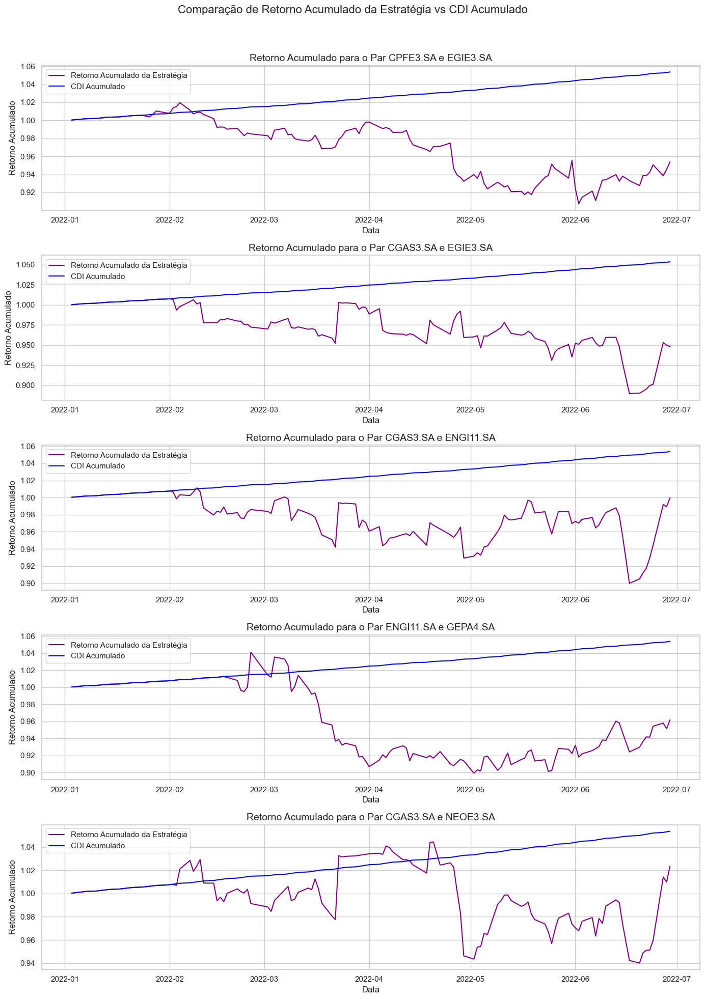

In [115]:
# Definindo a quantidade de pares que queremos visualizar (ajuste conforme necessário)
num_pares_visualizar = 5

# Criando subplots para visualizar as curvas de equity dos primeiros pares cointegrados
fig, ax = plt.subplots(num_pares_visualizar, 1, figsize=(14, 4 * num_pares_visualizar))
fig.suptitle("Comparação de Retorno Acumulado da Estratégia vs CDI Acumulado", fontsize=16)

# Iterando sobre os pares e plotando
for i, (acao1, acao2, z_score_trading, resultado) in enumerate(resultados_retornos_7[:num_pares_visualizar]):
    # Plotando o Retorno Acumulado Conjunto e CDI Acumulado
    ax[i].plot(resultado.index, resultado['Retorno Acumulado Conjunto'], color='purple', label='Retorno Acumulado da Estratégia')
    ax[i].plot(resultado.index, resultado['CDI Acumulado'], color='blue', label='CDI Acumulado')
    
    # Título e configurações do gráfico
    ax[i].set_title(f"Retorno Acumulado para o Par {acao1} e {acao2}", fontsize=14)
    ax[i].set_xlabel("Data")
    ax[i].set_ylabel("Retorno Acumulado")
    ax[i].legend()

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

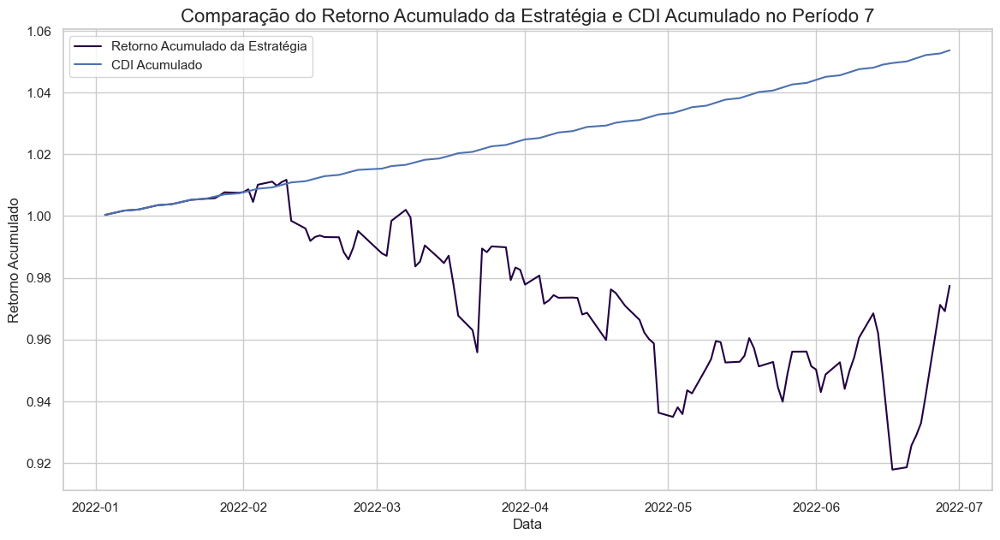

In [116]:
# Plotando o gráfico de comparação
plt.figure(figsize=(14, 7))

# Plotando a curva de Retorno Acumulado da Estratégia
plt.plot(resultado_retornos_periodo_7.index, resultado_retornos_periodo_7['Retorno Acumulado da Estratégia'], label='Retorno Acumulado da Estratégia', color='#220042')

# Plotando a curva de CDI Acumulado
plt.plot(resultado_retornos_periodo_7.index, resultado_retornos_periodo_7['CDI Acumulado'], label='CDI Acumulado', color='b')

# Configurando o título e os rótulos
plt.title('Comparação do Retorno Acumulado da Estratégia e CDI Acumulado no Período 7', fontsize=16)
plt.xlabel('Data', fontsize=12)
plt.ylabel('Retorno Acumulado', fontsize=12)
plt.legend()

# Exibindo o gráfico
plt.show()

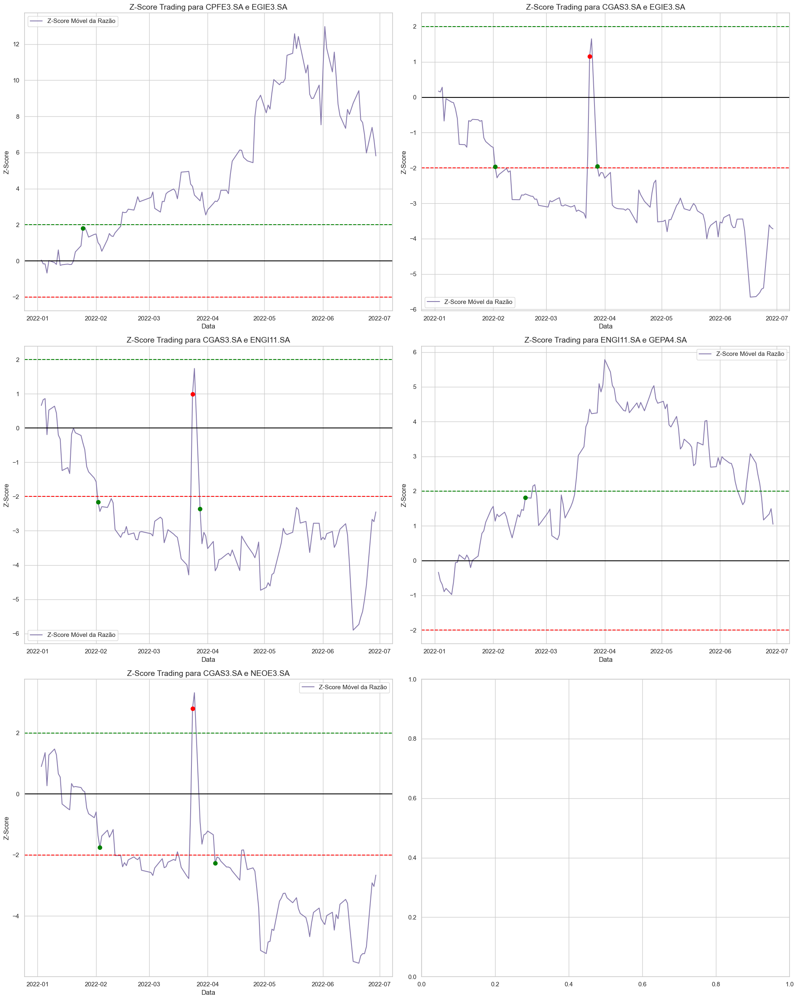

In [117]:
fig, ax = plt.subplots(3, 2, figsize=(20, 25))

for i, (acao1, acao2, z_score_trading, resultado) in enumerate(resultados_retornos_7):
    row = i // 2
    col = i % 2

    ax[row, col].plot(z_score_trading.index, z_score_trading, color='#8477ab', label='Z-Score Móvel da Razão', zorder=1)
    ax[row, col].axhline(0, color='black', zorder=2)
    ax[row, col].axhline(2.0, color='green', linestyle='--', zorder=2)
    ax[row, col].axhline(-2.0, color='red', linestyle='--', zorder=2)

    entradas_short = resultado[resultado['Entrada Short']]
    entradas_long = resultado[resultado['Entrada Long']]
    ax[row, col].scatter(entradas_short.index, z_score_trading.loc[entradas_short.index], color='green', s=50, zorder=3)
    ax[row, col].scatter(entradas_long.index, z_score_trading.loc[entradas_long.index], color='green', s=50, zorder=3)

    saidas_short = resultado[resultado['Saida Short']]
    saidas_long = resultado[resultado['Saida Long']]
    ax[row, col].scatter(saidas_short.index, z_score_trading.loc[saidas_short.index], color='red', s=50, zorder=3)
    ax[row, col].scatter(saidas_long.index, z_score_trading.loc[saidas_long.index], color='red', s=50, zorder=3)

    ax[row, col].set_title(f"Z-Score Trading para {acao1} e {acao2}", fontsize=14)
    ax[row, col].set_xlabel("Data")
    ax[row, col].set_ylabel("Z-Score")
    ax[row, col].legend()

plt.tight_layout()
plt.show()

### **2.8. Período 8**

#### **2.8.1. Cotações das Ações**

In [118]:
cotacoes_formacao_8 = yf.download(acoes_escolhidas, start='2021-07-01', end='2022-06-30')['Adj Close']
cotacoes_trading_8 = yf.download(acoes_escolhidas, start='2022-07-01', end='2022-12-31')['Adj Close']

[*********************100%%**********************]  26 of 26 completed

1 Failed download:
['TRPL4.SA']: Exception('%ticker%: No data found, symbol may be delisted')
[*********************100%%**********************]  26 of 26 completed

1 Failed download:
['TRPL4.SA']: Exception('%ticker%: No data found, symbol may be delisted')


In [119]:
cotacoes_formacao_8 = cotacoes_formacao_8.dropna(axis=1)
cotacoes_trading_8 = cotacoes_trading_8.dropna(axis=1)

In [120]:
# Garantindo que ambos os períodos tenham as mesmas colunas
acoes_intersecao_8 = cotacoes_formacao_8.columns.intersection(cotacoes_trading_8.columns)
cotacoes_formacao_8 = cotacoes_formacao_8[acoes_intersecao_8]
cotacoes_trading_8 = cotacoes_trading_8[acoes_intersecao_8]

# Exibindo as colunas restantes para confirmação
cotacoes_formacao_8.columns, cotacoes_trading_8.columns

(Index(['ALUP11.SA', 'AMBP3.SA', 'CEBR3.SA', 'CGAS3.SA', 'CLSC4.SA', 'CMIG4.SA',
        'COCE5.SA', 'CPFE3.SA', 'CPLE6.SA', 'CSMG3.SA', 'EGIE3.SA', 'EKTR4.SA',
        'ELET3.SA', 'EMAE4.SA', 'ENEV3.SA', 'ENGI11.SA', 'EQPA3.SA', 'EQTL3.SA',
        'GEPA4.SA', 'LIGT3.SA', 'NEOE3.SA', 'REDE3.SA', 'SAPR11.SA', 'SBSP3.SA',
        'TAEE11.SA'],
       dtype='object', name='Ticker'),
 Index(['ALUP11.SA', 'AMBP3.SA', 'CEBR3.SA', 'CGAS3.SA', 'CLSC4.SA', 'CMIG4.SA',
        'COCE5.SA', 'CPFE3.SA', 'CPLE6.SA', 'CSMG3.SA', 'EGIE3.SA', 'EKTR4.SA',
        'ELET3.SA', 'EMAE4.SA', 'ENEV3.SA', 'ENGI11.SA', 'EQPA3.SA', 'EQTL3.SA',
        'GEPA4.SA', 'LIGT3.SA', 'NEOE3.SA', 'REDE3.SA', 'SAPR11.SA', 'SBSP3.SA',
        'TAEE11.SA'],
       dtype='object', name='Ticker'))

In [121]:
# Calculando os retornos cumulativos normalizados para o período de formação
cumret_formacao_8 = np.log(cotacoes_formacao_8).diff().cumsum() + 1
cumret_formacao_8.dropna(inplace=True)

# Calculando os retornos cumulativos normalizados para o período de trading
cumret_trading_8 = np.log(cotacoes_trading_8).diff().cumsum() + 1
cumret_trading_8.dropna(inplace=True)

#### **2.8.2. Dados do CDI**

In [123]:
cdi_trading_8 = sgs.get({'CDI': 12}, start='2022-07-01', end='2022-12-31')

# Convertendo o CDI de % diária para formato decimal
cdi_trading_8['CDI'] = cdi_trading_8['CDI'] / 100

# Ajustando o índice para ser compatível com os resultados da estratégia
cdi_trading_8.index = pd.to_datetime(cdi_trading_8.index)

indices_trading_8 = pd.DataFrame(index = cotacoes_trading_8.index)
indices_trading_8['CDI'] = cdi_trading_8['CDI']

#### **2.8.3. Seleção de Pares**

In [124]:
# Usando preços ajustados para o teste de cointegração
pares_cointegrados_8 = test_cointegration(cotacoes_formacao_8)

# Selecionar os 5 pares cointegrados com menores distâncias
top_pairs_8 = select_top_pairs(pares_cointegrados_8, cotacoes_formacao_8, top_n=5)

# Exibir resultados
print("Top 5 pares cointegrados com menores distâncias:")
for s1, s2, p_value, distance in top_pairs_8:
    print(f"{s1} - {s2} | p-valor: {p_value:.4f} | Distância Euclidiana: {distance:.4f}")

Top 5 pares cointegrados com menores distâncias:
SAPR11.SA - ALUP11.SA | p-valor: 0.0464 | Distância Euclidiana: 0.5969
SAPR11.SA - ENGI11.SA | p-valor: 0.0131 | Distância Euclidiana: 0.6942
ALUP11.SA - EKTR4.SA | p-valor: 0.0044 | Distância Euclidiana: 0.7677
NEOE3.SA - EKTR4.SA | p-valor: 0.0281 | Distância Euclidiana: 0.9981
EGIE3.SA - SBSP3.SA | p-valor: 0.0425 | Distância Euclidiana: 1.0916


#### **2.8.4. Calculando os Spreads**

In [125]:
# Lista para armazenar os resultados dos spreads no período de trading
resultados_spreads_trading_8 = []

# Iterando sobre os pares selecionados no 'top_pairs'
for s1, s2, p_value, distance in top_pairs_8:
    # Calculando o spread no período de formação para estimar alpha e beta
    serie1_formacao = cotacoes_formacao_8[s1]
    serie2_formacao = cotacoes_formacao_8[s2]
    
    spread_formacao, alpha, beta = calcular_spread(serie1_formacao, serie2_formacao)
    
    # Calculando o spread no período de trading usando os valores de alpha e beta do período de formação
    serie1_trading = cotacoes_trading_8[s1]
    serie2_trading = cotacoes_trading_8[s2]
    
    spread_trading = serie1_trading - (alpha + beta * serie2_trading)
    
    # Armazenando os resultados para o período de trading
    media_spread = spread_formacao.mean()
    desvio_spread = spread_formacao.std()
    
    resultados_spreads_trading_8.append((s1, s2, spread_trading, alpha, beta, media_spread, desvio_spread))

# Exibindo um exemplo dos resultados para verificação
for resultado in resultados_spreads_trading_8[:5]:  # Mostrando apenas os 5 primeiros pares para verificação
    print(f"Par: {resultado[0]} - {resultado[1]}")
    print(f"Alpha: {resultado[3]:.4f}, Beta: {resultado[4]:.4f}")
    print(f"Média do Spread de Formação: {resultado[5]:.4f}, Desvio Padrão do Spread de Formação: {resultado[6]:.4f}")
    print(f"Spread de Trading (primeiros valores):\n{resultado[2].head()}\n")

Par: SAPR11.SA - ALUP11.SA
Alpha: 5.9641, Beta: 0.4789
Média do Spread de Formação: -0.0000, Desvio Padrão do Spread de Formação: 0.4493
Spread de Trading (primeiros valores):
Date
2022-07-01   -1.097025
2022-07-04   -1.269878
2022-07-05   -1.326016
2022-07-06   -1.269476
2022-07-07   -1.534415
dtype: float64

Par: SAPR11.SA - ENGI11.SA
Alpha: 6.9827, Beta: 0.2229
Média do Spread de Formação: 0.0000, Desvio Padrão do Spread de Formação: 0.4499
Spread de Trading (primeiros valores):
Date
2022-07-01    0.347925
2022-07-04    0.175616
2022-07-05    0.047881
2022-07-06    0.225405
2022-07-07    0.008358
dtype: float64

Par: ALUP11.SA - EKTR4.SA
Alpha: 9.4689, Beta: 0.6808
Média do Spread de Formação: -0.0000, Desvio Padrão do Spread de Formação: 0.6316
Spread de Trading (primeiros valores):
Date
2022-07-01    0.242480
2022-07-04   -0.046285
2022-07-05   -0.368042
2022-07-06   -0.286814
2022-07-07   -0.014555
dtype: float64

Par: NEOE3.SA - EKTR4.SA
Alpha: 6.4870, Beta: 0.4924
Média do Spre

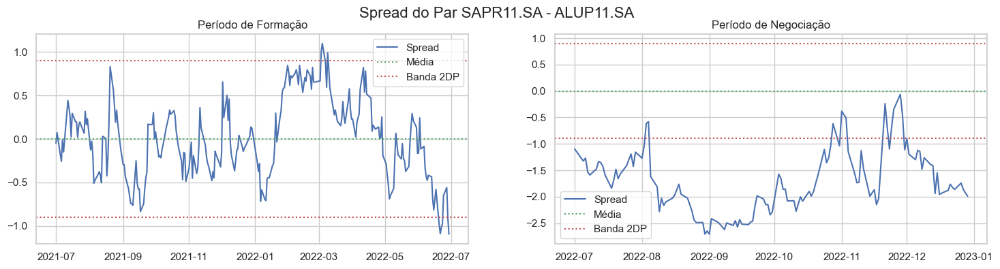

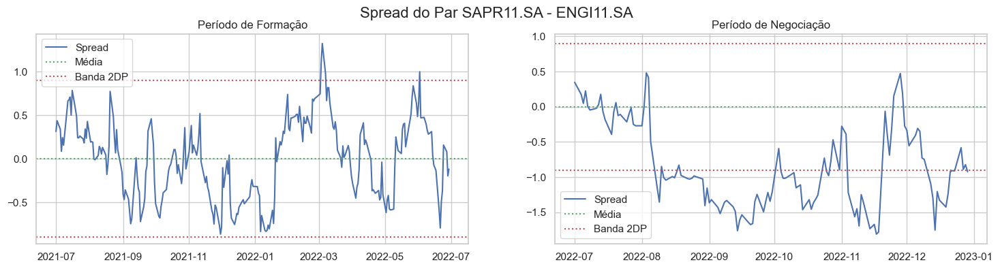

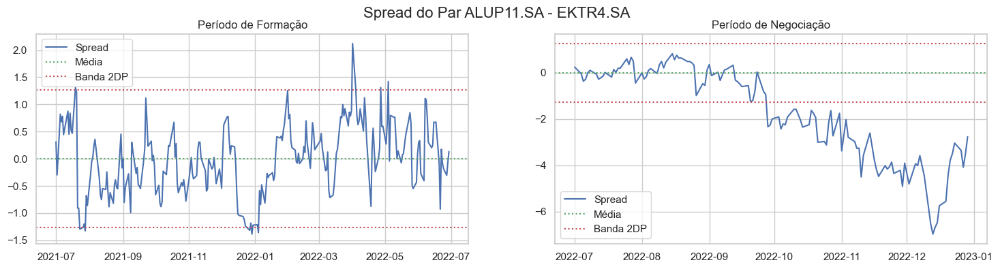

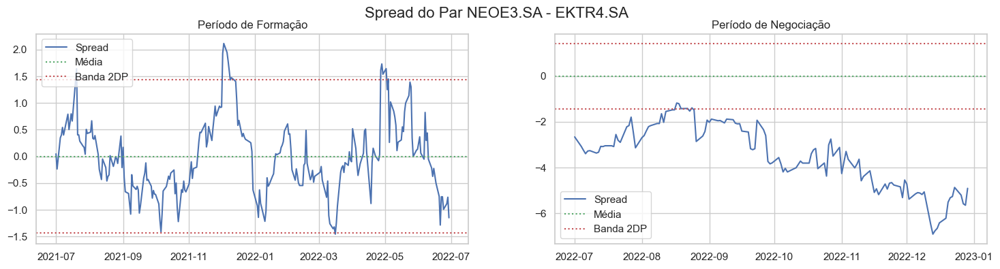

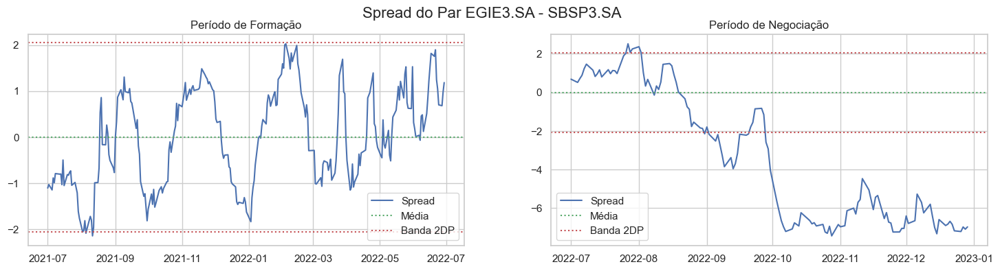

In [126]:
def plot_spreads(resultados_spreads_trading):
    """
    Plota os spreads de formação e de negociação para os pares selecionados.
    """
    for s1, s2, spread_trading, alpha, beta, media_spread, desvio_spread in resultados_spreads_trading:
        # Calculando o spread para o período de formação usando os valores armazenados
        spread_formacao = cotacoes_formacao_8[s1] - (alpha + beta * cotacoes_formacao_8[s2])

        # Criando gráficos lado a lado
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 4))
        fig.suptitle(f'Spread do Par {s1} - {s2}', fontsize=16)

        # Período de formação
        ax1.plot(spread_formacao, label='Spread')
        ax1.axhline(y=media_spread, color='g', linestyle='dotted', label='Média')
        ax1.axhline(y=media_spread + 2 * desvio_spread, color='r', linestyle='dotted', label='Banda 2DP')
        ax1.axhline(y=media_spread - 2 * desvio_spread, color='r', linestyle='dotted')
        ax1.set_title('Período de Formação')
        ax1.legend()

        # Período de negociação
        ax2.plot(spread_trading, label='Spread')
        ax2.axhline(y=media_spread, color='g', linestyle='dotted', label='Média')
        ax2.axhline(y=media_spread + 2 * desvio_spread, color='r', linestyle='dotted', label='Banda 2DP')
        ax2.axhline(y=media_spread - 2 * desvio_spread, color='r', linestyle='dotted')
        ax2.set_title('Período de Negociação')
        ax2.legend()

        plt.show()

# Chamando a função para os pares em resultados_spreads_trading_5
plot_spreads(resultados_spreads_trading_8)

#### **2.8.5. Definindo os Sinais da Estratégia**

In [127]:
resultados_z_scores_trading_8 = []

for acao1, acao2, spread_trading, alpha, beta, media_spread, desvio_spread in resultados_spreads_trading_8:
    z_score_trading = (spread_trading - media_spread) / desvio_spread
    resultados_z_scores_trading_8.append((acao1, acao2, z_score_trading))
    print(f"Par: {acao1} e {acao2} - Média do Z-score: {z_score_trading.mean():.4f}, Desvio Padrão do Z-score: {z_score_trading.std():.4f}\n")

Par: SAPR11.SA e ALUP11.SA - Média do Z-score: -3.7722, Desvio Padrão do Z-score: 1.3118

Par: SAPR11.SA e ENGI11.SA - Média do Z-score: -1.8748, Desvio Padrão do Z-score: 1.3260

Par: ALUP11.SA e EKTR4.SA - Média do Z-score: -2.7811, Desvio Padrão do Z-score: 3.1435

Par: NEOE3.SA e EKTR4.SA - Média do Z-score: -4.8665, Desvio Padrão do Z-score: 1.9281

Par: EGIE3.SA e SBSP3.SA - Média do Z-score: -3.2607, Desvio Padrão do Z-score: 3.3033



In [128]:
sinais_trade_list_8 = []

for acao1, acao2, z_score_trading in resultados_z_scores_trading_8:
    sinais_trade = pd.DataFrame(index=z_score_trading.index)
    sinais_trade[f'Preços {acao1}'] = cotacoes_trading_8[acao1]
    sinais_trade[f'Preços {acao2}'] = cotacoes_trading_8[acao2]

    posicao_short_ativa = False
    posicao_long_ativa = False

    entradas_short = []
    entradas_long = []
    saidas_short = []
    saidas_long = []

    for i in range(len(sinais_trade)):
        if not posicao_short_ativa and not posicao_long_ativa:
            if (z_score_trading.iloc[i] > sinal_entrada) and (z_score_trading.shift(1).iloc[i] < sinal_entrada):
                entradas_short.append(True)
                entradas_long.append(False)
                posicao_short_ativa = True
            elif (z_score_trading.iloc[i] < -sinal_entrada) and (z_score_trading.shift(1).iloc[i] > -sinal_entrada):
                entradas_long.append(True)
                entradas_short.append(False)
                posicao_long_ativa = True
            else:
                entradas_short.append(False)
                entradas_long.append(False)
        else:
            entradas_short.append(False)
            entradas_long.append(False)

        if posicao_short_ativa:
            saida = (z_score_trading.iloc[i] < sinal_saida) and (z_score_trading.shift(1).iloc[i] > sinal_saida)
            saidas_short.append(saida)
            saidas_long.append(False)
            if saida:
                posicao_short_ativa = False
        elif posicao_long_ativa:
            saida = (z_score_trading.iloc[i] > -sinal_saida) and (z_score_trading.shift(1).iloc[i] < -sinal_saida)
            saidas_long.append(saida)
            saidas_short.append(False)
            if saida:
                posicao_long_ativa = False
        else:
            saidas_short.append(False)
            saidas_long.append(False)

    sinais_trade['Entrada Short'] = entradas_short
    sinais_trade['Entrada Long'] = entradas_long
    sinais_trade['Saida Short'] = saidas_short
    sinais_trade['Saida Long'] = saidas_long

    sinais_trade_list_8.append((acao1, acao2, z_score_trading, sinais_trade))

#### **2.8.6. Calculando os Retornos**

In [129]:
resultado_backtest_todos_pares_8 = []

for acao1, acao2, z_score_trading, sinais_trade in sinais_trade_list_8:
    resultado = pd.DataFrame(index=sinais_trade.index)
    resultado[f'{acao1}'] = cotacoes_trading_8[acao1]
    resultado[f'{acao2}'] = cotacoes_trading_8[acao2]
    resultado['CDI'] = indices_trading_8['CDI']
    resultado['Entrada Short'] = sinais_trade['Entrada Short']
    resultado['Saida Short'] = sinais_trade['Saida Short']
    resultado['Entrada Long'] = sinais_trade['Entrada Long']
    resultado['Saida Long'] = sinais_trade['Saida Long']

    retorno_acao1 = []
    retorno_acao2 = []

    posicao_short_ativa = False
    posicao_long_ativa = False

    for i in range(len(sinais_trade)):
        if sinais_trade['Entrada Short'].iloc[i]:
            posicao_short_ativa = True
            retorno_acao1.append(-0.001)
            retorno_acao2.append(-0.001)
        elif sinais_trade['Entrada Long'].iloc[i]:
            posicao_long_ativa = True
            retorno_acao1.append(-0.001)
            retorno_acao2.append(-0.001)
        elif posicao_short_ativa:
            if sinais_trade['Saida Short'].iloc[i]:
                retorno_acao1.append(-0.001)
                retorno_acao2.append(-0.001)
                posicao_short_ativa = False
            else:
                retorno_acao1.append(-(cotacoes_trading_8[acao1].iloc[i] / cotacoes_trading_8[acao1].iloc[i-1] - 1))
                retorno_acao2.append(cotacoes_trading_8[acao2].iloc[i] / cotacoes_trading_8[acao2].iloc[i-1] - 1)
        elif posicao_long_ativa:
            if sinais_trade['Saida Long'].iloc[i]:
                retorno_acao1.append(-0.001)
                retorno_acao2.append(-0.001)
                posicao_long_ativa = False
            else:
                retorno_acao1.append(cotacoes_trading_8[acao1].iloc[i] / cotacoes_trading_8[acao1].iloc[i-1] - 1)
                retorno_acao2.append(-(cotacoes_trading_8[acao2].iloc[i] / cotacoes_trading_8[acao2].iloc[i-1] - 1))
        else:
            retorno_acao1.append(resultado['CDI'].iloc[i])
            retorno_acao2.append(resultado['CDI'].iloc[i])

    resultado[f"Retorno {acao1}"] = retorno_acao1
    resultado[f"Retorno {acao2}"] = retorno_acao2

    resultado_backtest_todos_pares_8.append((acao1, acao2, z_score_trading, resultado))

In [130]:
# Lista para armazenar os retornos acumulados de cada par e da estratégia conjunta
resultados_retornos_8 = []

# Iterando sobre cada resultado do backtest em resultado_backtest_todos_pares
for acao1, acao2, z_score_trading, resultado in resultado_backtest_todos_pares_8:
    # Inicializando os retornos acumulados
    retorno_acumulado_acao1 = 1
    retorno_acumulado_acao2 = 1
    cdi_acumulado = 1
    retorno_acumulado_acao1_list = []
    retorno_acumulado_acao2_list = []
    cdi_acumulado_list = []
    retorno_acumulado_conjunto_list = []

    # Iterando sobre as datas do DataFrame para calcular os retornos acumulados
    for i in range(len(resultado)):
        # Calculando o retorno acumulado de nome1, nome2 e cdi
        retorno_acumulado_acao1 *= (1 + resultado[f"Retorno {acao1}"].iloc[i])
        retorno_acumulado_acao2 *= (1 + resultado[f"Retorno {acao2}"].iloc[i])
        cdi_acumulado *= (1 + resultado['CDI'].iloc[i])

        # Adicionando os valores à lista de retorno acumulado
        retorno_acumulado_acao1_list.append(retorno_acumulado_acao1)
        retorno_acumulado_acao2_list.append(retorno_acumulado_acao2)
        cdi_acumulado_list.append(cdi_acumulado)

        # Calculando o retorno acumulado conjunto (média dos acumulados)
        retorno_acumulado_conjunto = (retorno_acumulado_acao1 + retorno_acumulado_acao2) / 2
        retorno_acumulado_conjunto_list.append(retorno_acumulado_conjunto)

    # Adicionando os retornos acumulados ao DataFrame de resultado
    resultado[f"Retorno Acumulado {acao1}"] = retorno_acumulado_acao1_list
    resultado[f"Retorno Acumulado {acao2}"] = retorno_acumulado_acao2_list
    resultado['CDI Acumulado'] = cdi_acumulado_list
    resultado['Retorno Acumulado Conjunto'] = retorno_acumulado_conjunto_list

    # Adicionando o resultado do par à lista de resultados acumulados
    resultados_retornos_8.append((acao1, acao2, z_score_trading, resultado))

In [131]:
# Inicializando um DataFrame vazio com o índice de datas baseado no primeiro resultado
resultado_retornos_periodo_8 = pd.DataFrame(index=resultados_retornos_8[0][3].index)

# Adicionando as colunas de retorno acumulado conjunto de cada par
for acao1, acao2, z_score_trading, resultado in resultados_retornos_8:
    coluna_nome = f"{acao1}-{acao2} Retorno Acumulado Conjunto"
    resultado_retornos_periodo_8[coluna_nome] = resultado['Retorno Acumulado Conjunto']

# Calculando a média dos retornos acumulados de todos os pares para criar a coluna 'Retorno Acumulado da Estratégia'
resultado_retornos_periodo_8['Retorno Acumulado da Estratégia'] = resultado_retornos_periodo_8.mean(axis=1)

# Adicionando a coluna de 'CDI Acumulado' para comparação
resultado_retornos_periodo_8['CDI Acumulado'] = resultados_retornos_8[0][3]['CDI Acumulado']

# Exibindo o DataFrame resultante
display(resultado_retornos_periodo_8)

,SAPR11.SA-ALUP11.SA Retorno Acumulado Conjunto,SAPR11.SA-ENGI11.SA Retorno Acumulado Conjunto,ALUP11.SA-EKTR4.SA Retorno Acumulado Conjunto,NEOE3.SA-EKTR4.SA Retorno Acumulado Conjunto,EGIE3.SA-SBSP3.SA Retorno Acumulado Conjunto,Retorno Acumulado da Estratégia,CDI Acumulado
Date,,,,,,,
2022-07-01,1.000490,1.000490,1.000490,1.000490,1.000490,1.000490,1.000490
2022-07-04,1.000981,1.000981,1.000981,1.000981,1.000981,1.000981,1.000981
2022-07-05,1.001472,1.001472,1.001472,1.001472,1.001472,1.001472,1.001472
2022-07-06,1.001963,1.001963,1.001963,1.001963,1.001963,1.001963,1.001963
2022-07-07,1.002454,1.002454,1.002454,1.002454,1.002454,1.002454,1.002454
...,...,...,...,...,...,...,...
2022-12-23,1.014677,0.982472,0.980669,0.848755,0.894281,0.944171,1.063458
2022-12-26,1.018206,0.996460,0.972322,0.837968,0.894340,0.943859,1.063998
2022-12-27,1.016843,0.987627,0.954791,0.825727,0.898933,0.936784,1.064538


#### **2.8.7. Visualizando os Retornos**

In [ ]:
# Definindo a quantidade de pares que queremos visualizar (ajuste conforme necessário)
num_pares_visualizar = 5

# Criando subplots para visualizar as curvas de equity dos primeiros pares cointegrados
fig, ax = plt.subplots(num_pares_visualizar, 1, figsize=(14, 4 * num_pares_visualizar))
fig.suptitle("Comparação de Retorno Acumulado da Estratégia vs CDI Acumulado", fontsize=16)

# Iterando sobre os pares e plotando
for i, (acao1, acao2, z_score_trading, resultado) in enumerate(resultados_retornos_8[:num_pares_visualizar]):
    # Plotando o Retorno Acumulado Conjunto e CDI Acumulado
    ax[i].plot(resultado.index, resultado['Retorno Acumulado Conjunto'], color='purple', label='Retorno Acumulado da Estratégia')
    ax[i].plot(resultado.index, resultado['CDI Acumulado'], color='blue', label='CDI Acumulado')
    
    # Título e configurações do gráfico
    ax[i].set_title(f"Retorno Acumulado para o Par {acao1} e {acao2}", fontsize=14)
    ax[i].set_xlabel("Data")
    ax[i].set_ylabel("Retorno Acumulado")
    ax[i].legend()

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

In [ ]:
# Plotando o gráfico de comparação
plt.figure(figsize=(14, 7))

# Plotando a curva de Retorno Acumulado da Estratégia
plt.plot(resultado_retornos_periodo_8.index, resultado_retornos_periodo_8['Retorno Acumulado da Estratégia'], label='Retorno Acumulado da Estratégia', color='#220042')

# Plotando a curva de CDI Acumulado
plt.plot(resultado_retornos_periodo_8.index, resultado_retornos_periodo_8['CDI Acumulado'], label='CDI Acumulado', color='b')

# Configurando o título e os rótulos
plt.title('Comparação do Retorno Acumulado da Estratégia e CDI Acumulado no Período 8', fontsize=16)
plt.xlabel('Data', fontsize=12)
plt.ylabel('Retorno Acumulado', fontsize=12)
plt.legend()

# Exibindo o gráfico
plt.show()

In [ ]:
fig, ax = plt.subplots(3, 2, figsize=(20, 25))

for i, (acao1, acao2, z_score_trading, resultado) in enumerate(resultados_retornos_8):
    row = i // 2
    col = i % 2

    ax[row, col].plot(z_score_trading.index, z_score_trading, color='#8477ab', label='Z-Score Móvel da Razão', zorder=1)
    ax[row, col].axhline(0, color='black', zorder=2)
    ax[row, col].axhline(2.0, color='green', linestyle='--', zorder=2)
    ax[row, col].axhline(-2.0, color='red', linestyle='--', zorder=2)

    entradas_short = resultado[resultado['Entrada Short']]
    entradas_long = resultado[resultado['Entrada Long']]
    ax[row, col].scatter(entradas_short.index, z_score_trading.loc[entradas_short.index], color='green', s=50, zorder=3)
    ax[row, col].scatter(entradas_long.index, z_score_trading.loc[entradas_long.index], color='green', s=50, zorder=3)

    saidas_short = resultado[resultado['Saida Short']]
    saidas_long = resultado[resultado['Saida Long']]
    ax[row, col].scatter(saidas_short.index, z_score_trading.loc[saidas_short.index], color='red', s=50, zorder=3)
    ax[row, col].scatter(saidas_long.index, z_score_trading.loc[saidas_long.index], color='red', s=50, zorder=3)

    ax[row, col].set_title(f"Z-Score Trading para {acao1} e {acao2}", fontsize=14)
    ax[row, col].set_xlabel("Data")
    ax[row, col].set_ylabel("Z-Score")
    ax[row, col].legend()

plt.tight_layout()
plt.show()

### **2.9. Período 9**

#### **2.9.1. Cotações das Ações**

In [132]:
cotacoes_formacao_9 = yf.download(acoes_escolhidas, start='2022-01-01', end='2022-12-31')['Adj Close']
cotacoes_trading_9 = yf.download(acoes_escolhidas, start='2023-01-01', end='2023-06-30')['Adj Close']

[*********************100%%**********************]  26 of 26 completed

1 Failed download:
['TRPL4.SA']: Exception('%ticker%: No data found, symbol may be delisted')
[*********************100%%**********************]  26 of 26 completed

1 Failed download:
['TRPL4.SA']: Exception('%ticker%: No data found, symbol may be delisted')


In [133]:
cotacoes_formacao_9 = cotacoes_formacao_9.dropna(axis=1)
cotacoes_trading_9 = cotacoes_trading_9.dropna(axis=1)

In [134]:
# Garantindo que ambos os períodos tenham as mesmas colunas
acoes_intersecao_9 = cotacoes_formacao_9.columns.intersection(cotacoes_trading_9.columns)
cotacoes_formacao_9 = cotacoes_formacao_9[acoes_intersecao_9]
cotacoes_trading_9 = cotacoes_trading_9[acoes_intersecao_9]

# Exibindo as colunas restantes para confirmação
cotacoes_formacao_9.columns, cotacoes_trading_9.columns

(Index(['ALUP11.SA', 'AMBP3.SA', 'CEBR3.SA', 'CGAS3.SA', 'CLSC4.SA', 'CMIG4.SA',
        'COCE5.SA', 'CPFE3.SA', 'CPLE6.SA', 'CSMG3.SA', 'EGIE3.SA', 'EKTR4.SA',
        'ELET3.SA', 'EMAE4.SA', 'ENEV3.SA', 'ENGI11.SA', 'EQPA3.SA', 'EQTL3.SA',
        'GEPA4.SA', 'LIGT3.SA', 'NEOE3.SA', 'REDE3.SA', 'SAPR11.SA', 'SBSP3.SA',
        'TAEE11.SA'],
       dtype='object', name='Ticker'),
 Index(['ALUP11.SA', 'AMBP3.SA', 'CEBR3.SA', 'CGAS3.SA', 'CLSC4.SA', 'CMIG4.SA',
        'COCE5.SA', 'CPFE3.SA', 'CPLE6.SA', 'CSMG3.SA', 'EGIE3.SA', 'EKTR4.SA',
        'ELET3.SA', 'EMAE4.SA', 'ENEV3.SA', 'ENGI11.SA', 'EQPA3.SA', 'EQTL3.SA',
        'GEPA4.SA', 'LIGT3.SA', 'NEOE3.SA', 'REDE3.SA', 'SAPR11.SA', 'SBSP3.SA',
        'TAEE11.SA'],
       dtype='object', name='Ticker'))

In [135]:
# Calculando os retornos cumulativos normalizados para o período de formação
cumret_formacao_9 = np.log(cotacoes_formacao_9).diff().cumsum() + 1
cumret_formacao_9.dropna(inplace=True)

# Calculando os retornos cumulativos normalizados para o período de trading
cumret_trading_9 = np.log(cotacoes_trading_9).diff().cumsum() + 1
cumret_trading_9.dropna(inplace=True)

#### **2.9.2. Dados do CDI**

In [136]:
cdi_trading_9 = sgs.get({'CDI': 12}, start='2023-01-01', end='2023-06-30')

# Convertendo o CDI de % diária para formato decimal
cdi_trading_9['CDI'] = cdi_trading_9['CDI'] / 100

# Ajustando o índice para ser compatível com os resultados da estratégia
cdi_trading_9.index = pd.to_datetime(cdi_trading_9.index)

indices_trading_9 = pd.DataFrame(index = cotacoes_trading_9.index)
indices_trading_9['CDI'] = cdi_trading_9['CDI']

#### **2.9.3. Seleção de Pares**

In [137]:
# Usando preços ajustados para o teste de cointegração
pares_cointegrados_9 = test_cointegration(cotacoes_formacao_9)

# Selecionar os 5 pares cointegrados com menores distâncias
top_pairs_9 = select_top_pairs(pares_cointegrados_9, cotacoes_formacao_9, top_n=5)

# Exibir resultados
print("Top 5 pares cointegrados com menores distâncias:")
for s1, s2, p_value, distance in top_pairs_9:
    print(f"{s1} - {s2} | p-valor: {p_value:.4f} | Distância Euclidiana: {distance:.4f}")

Top 5 pares cointegrados com menores distâncias:
EQTL3.SA - CSMG3.SA | p-valor: 0.0188 | Distância Euclidiana: 0.9175
CSMG3.SA - EQPA3.SA | p-valor: 0.0006 | Distância Euclidiana: 0.9535
EKTR4.SA - SBSP3.SA | p-valor: 0.0140 | Distância Euclidiana: 1.2428
ALUP11.SA - CMIG4.SA | p-valor: 0.0102 | Distância Euclidiana: 1.2878
CLSC4.SA - REDE3.SA | p-valor: 0.0061 | Distância Euclidiana: 1.3446


#### **2.9.4. Calculando os Spreads**

In [138]:
# Lista para armazenar os resultados dos spreads no período de trading
resultados_spreads_trading_9 = []

# Iterando sobre os pares selecionados no 'top_pairs'
for s1, s2, p_value, distance in top_pairs_9:
    # Calculando o spread no período de formação para estimar alpha e beta
    serie1_formacao = cotacoes_formacao_9[s1]
    serie2_formacao = cotacoes_formacao_9[s2]
    
    spread_formacao, alpha, beta = calcular_spread(serie1_formacao, serie2_formacao)
    
    # Calculando o spread no período de trading usando os valores de alpha e beta do período de formação
    serie1_trading = cotacoes_trading_9[s1]
    serie2_trading = cotacoes_trading_9[s2]
    
    spread_trading = serie1_trading - (alpha + beta * serie2_trading)
    
    # Armazenando os resultados para o período de trading
    media_spread = spread_formacao.mean()
    desvio_spread = spread_formacao.std()
    
    resultados_spreads_trading_9.append((s1, s2, spread_trading, alpha, beta, media_spread, desvio_spread))

# Exibindo um exemplo dos resultados para verificação
for resultado in resultados_spreads_trading_9[:5]:  # Mostrando apenas os 5 primeiros pares para verificação
    print(f"Par: {resultado[0]} - {resultado[1]}")
    print(f"Alpha: {resultado[3]:.4f}, Beta: {resultado[4]:.4f}")
    print(f"Média do Spread de Formação: {resultado[5]:.4f}, Desvio Padrão do Spread de Formação: {resultado[6]:.4f}")
    print(f"Spread de Trading (primeiros valores):\n{resultado[2].head()}\n")

Par: EQTL3.SA - CSMG3.SA
Alpha: 7.6421, Beta: 1.6159
Média do Spread de Formação: -0.0000, Desvio Padrão do Spread de Formação: 0.9855
Spread de Trading (primeiros valores):
Date
2023-01-02   -1.199937
2023-01-03   -1.547366
2023-01-04   -1.313464
2023-01-05   -1.607035
2023-01-06   -1.721570
dtype: float64

Par: CSMG3.SA - EQPA3.SA
Alpha: 3.0739, Beta: 1.4842
Média do Spread de Formação: 0.0000, Desvio Padrão do Spread de Formação: 0.3833
Spread de Trading (primeiros valores):
Date
2023-01-02    0.037186
2023-01-03   -0.466761
2023-01-04   -0.608406
2023-01-05   -0.499616
2023-01-06   -0.530348
dtype: float64

Par: EKTR4.SA - SBSP3.SA
Alpha: -0.8966, Beta: 0.4465
Média do Spread de Formação: 0.0000, Desvio Padrão do Spread de Formação: 1.5127
Spread de Trading (primeiros valores):
Date
2023-01-02    2.623888
2023-01-03    4.235485
2023-01-04    1.966008
2023-01-05    2.984288
2023-01-06    1.522041
dtype: float64

Par: ALUP11.SA - CMIG4.SA
Alpha: 10.1519, Beta: 1.8959
Média do Spread 

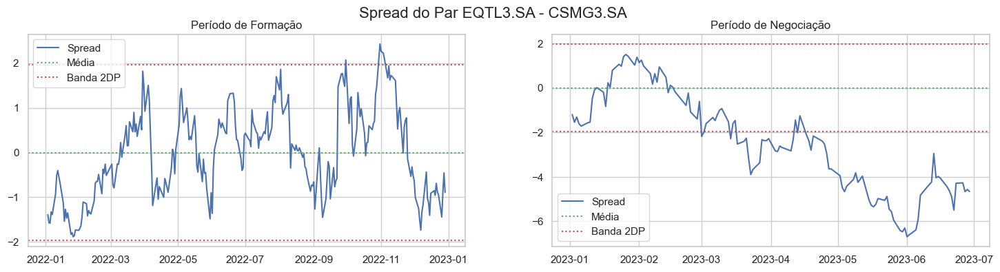

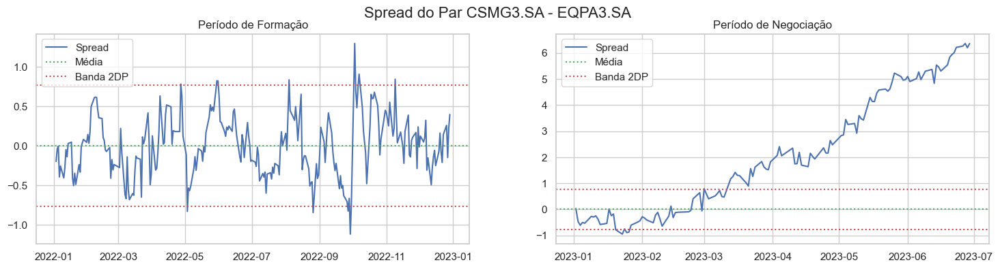

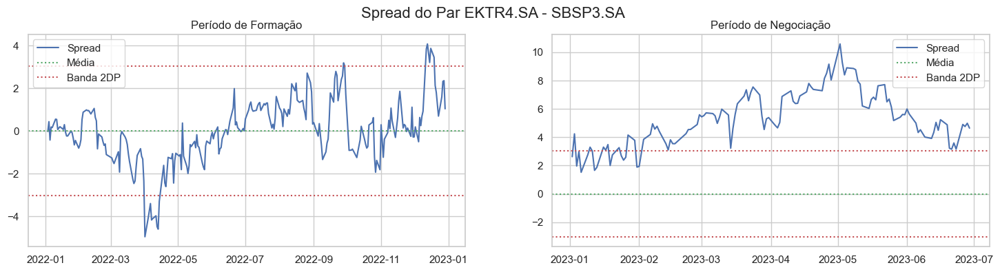

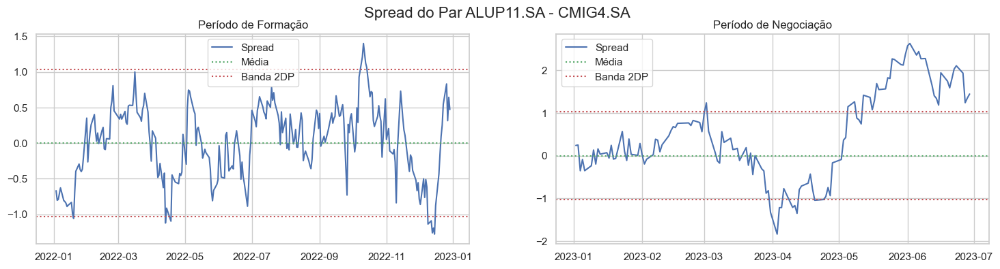

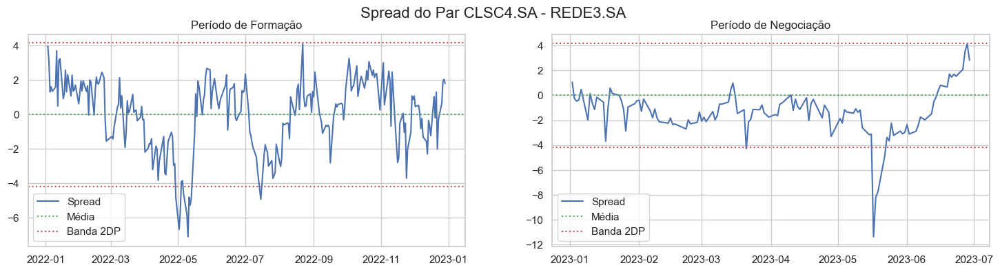

In [139]:
def plot_spreads(resultados_spreads_trading):
    """
    Plota os spreads de formação e de negociação para os pares selecionados.
    """
    for s1, s2, spread_trading, alpha, beta, media_spread, desvio_spread in resultados_spreads_trading:
        # Calculando o spread para o período de formação usando os valores armazenados
        spread_formacao = cotacoes_formacao_9[s1] - (alpha + beta * cotacoes_formacao_9[s2])

        # Criando gráficos lado a lado
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 4))
        fig.suptitle(f'Spread do Par {s1} - {s2}', fontsize=16)

        # Período de formação
        ax1.plot(spread_formacao, label='Spread')
        ax1.axhline(y=media_spread, color='g', linestyle='dotted', label='Média')
        ax1.axhline(y=media_spread + 2 * desvio_spread, color='r', linestyle='dotted', label='Banda 2DP')
        ax1.axhline(y=media_spread - 2 * desvio_spread, color='r', linestyle='dotted')
        ax1.set_title('Período de Formação')
        ax1.legend()

        # Período de negociação
        ax2.plot(spread_trading, label='Spread')
        ax2.axhline(y=media_spread, color='g', linestyle='dotted', label='Média')
        ax2.axhline(y=media_spread + 2 * desvio_spread, color='r', linestyle='dotted', label='Banda 2DP')
        ax2.axhline(y=media_spread - 2 * desvio_spread, color='r', linestyle='dotted')
        ax2.set_title('Período de Negociação')
        ax2.legend()

        plt.show()

# Chamando a função para os pares em resultados_spreads_trading_5
plot_spreads(resultados_spreads_trading_9)

#### **2.9.5. Definindo os Sinais da Estratégia**

In [140]:
resultados_z_scores_trading_9 = []

for acao1, acao2, spread_trading, alpha, beta, media_spread, desvio_spread in resultados_spreads_trading_9:
    z_score_trading = (spread_trading - media_spread) / desvio_spread
    resultados_z_scores_trading_9.append((acao1, acao2, z_score_trading))
    print(f"Par: {acao1} e {acao2} - Média do Z-score: {z_score_trading.mean():.4f}, Desvio Padrão do Z-score: {z_score_trading.std():.4f}\n")

Par: EQTL3.SA e CSMG3.SA - Média do Z-score: -2.4816, Desvio Padrão do Z-score: 2.2224

Par: CSMG3.SA e EQPA3.SA - Média do Z-score: 5.3436, Desvio Padrão do Z-score: 5.8595

Par: EKTR4.SA e SBSP3.SA - Média do Z-score: 3.4501, Desvio Padrão do Z-score: 1.2668

Par: ALUP11.SA e CMIG4.SA - Média do Z-score: 0.9355, Desvio Padrão do Z-score: 1.9880

Par: CLSC4.SA e REDE3.SA - Média do Z-score: -0.6445, Desvio Padrão do Z-score: 0.9212



In [141]:
sinais_trade_list_9 = []

for acao1, acao2, z_score_trading in resultados_z_scores_trading_9:
    sinais_trade = pd.DataFrame(index=z_score_trading.index)
    sinais_trade[f'Preços {acao1}'] = cotacoes_trading_9[acao1]
    sinais_trade[f'Preços {acao2}'] = cotacoes_trading_9[acao2]

    posicao_short_ativa = False
    posicao_long_ativa = False

    entradas_short = []
    entradas_long = []
    saidas_short = []
    saidas_long = []

    for i in range(len(sinais_trade)):
        if not posicao_short_ativa and not posicao_long_ativa:
            if (z_score_trading.iloc[i] > sinal_entrada) and (z_score_trading.shift(1).iloc[i] < sinal_entrada):
                entradas_short.append(True)
                entradas_long.append(False)
                posicao_short_ativa = True
            elif (z_score_trading.iloc[i] < -sinal_entrada) and (z_score_trading.shift(1).iloc[i] > -sinal_entrada):
                entradas_long.append(True)
                entradas_short.append(False)
                posicao_long_ativa = True
            else:
                entradas_short.append(False)
                entradas_long.append(False)
        else:
            entradas_short.append(False)
            entradas_long.append(False)

        if posicao_short_ativa:
            saida = (z_score_trading.iloc[i] < sinal_saida) and (z_score_trading.shift(1).iloc[i] > sinal_saida)
            saidas_short.append(saida)
            saidas_long.append(False)
            if saida:
                posicao_short_ativa = False
        elif posicao_long_ativa:
            saida = (z_score_trading.iloc[i] > -sinal_saida) and (z_score_trading.shift(1).iloc[i] < -sinal_saida)
            saidas_long.append(saida)
            saidas_short.append(False)
            if saida:
                posicao_long_ativa = False
        else:
            saidas_short.append(False)
            saidas_long.append(False)

    sinais_trade['Entrada Short'] = entradas_short
    sinais_trade['Entrada Long'] = entradas_long
    sinais_trade['Saida Short'] = saidas_short
    sinais_trade['Saida Long'] = saidas_long

    sinais_trade_list_9.append((acao1, acao2, z_score_trading, sinais_trade))

#### **2.9.6. Calculando os Retornos**

In [142]:
resultado_backtest_todos_pares_9 = []

for acao1, acao2, z_score_trading, sinais_trade in sinais_trade_list_9:
    resultado = pd.DataFrame(index=sinais_trade.index)
    resultado[f'{acao1}'] = cotacoes_trading_9[acao1]
    resultado[f'{acao2}'] = cotacoes_trading_9[acao2]
    resultado['CDI'] = indices_trading_9['CDI']
    resultado['Entrada Short'] = sinais_trade['Entrada Short']
    resultado['Saida Short'] = sinais_trade['Saida Short']
    resultado['Entrada Long'] = sinais_trade['Entrada Long']
    resultado['Saida Long'] = sinais_trade['Saida Long']

    retorno_acao1 = []
    retorno_acao2 = []

    posicao_short_ativa = False
    posicao_long_ativa = False

    for i in range(len(sinais_trade)):
        if sinais_trade['Entrada Short'].iloc[i]:
            posicao_short_ativa = True
            retorno_acao1.append(-0.001)
            retorno_acao2.append(-0.001)
        elif sinais_trade['Entrada Long'].iloc[i]:
            posicao_long_ativa = True
            retorno_acao1.append(-0.001)
            retorno_acao2.append(-0.001)
        elif posicao_short_ativa:
            if sinais_trade['Saida Short'].iloc[i]:
                retorno_acao1.append(-0.001)
                retorno_acao2.append(-0.001)
                posicao_short_ativa = False
            else:
                retorno_acao1.append(-(cotacoes_trading_9[acao1].iloc[i] / cotacoes_trading_9[acao1].iloc[i-1] - 1))
                retorno_acao2.append(cotacoes_trading_9[acao2].iloc[i] / cotacoes_trading_9[acao2].iloc[i-1] - 1)
        elif posicao_long_ativa:
            if sinais_trade['Saida Long'].iloc[i]:
                retorno_acao1.append(-0.001)
                retorno_acao2.append(-0.001)
                posicao_long_ativa = False
            else:
                retorno_acao1.append(cotacoes_trading_9[acao1].iloc[i] / cotacoes_trading_9[acao1].iloc[i-1] - 1)
                retorno_acao2.append(-(cotacoes_trading_9[acao2].iloc[i] / cotacoes_trading_9[acao2].iloc[i-1] - 1))
        else:
            retorno_acao1.append(resultado['CDI'].iloc[i])
            retorno_acao2.append(resultado['CDI'].iloc[i])

    resultado[f"Retorno {acao1}"] = retorno_acao1
    resultado[f"Retorno {acao2}"] = retorno_acao2

    resultado_backtest_todos_pares_9.append((acao1, acao2, z_score_trading, resultado))

In [143]:
# Lista para armazenar os retornos acumulados de cada par e da estratégia conjunta
resultados_retornos_9 = []

# Iterando sobre cada resultado do backtest em resultado_backtest_todos_pares
for acao1, acao2, z_score_trading, resultado in resultado_backtest_todos_pares_9:
    # Inicializando os retornos acumulados
    retorno_acumulado_acao1 = 1
    retorno_acumulado_acao2 = 1
    cdi_acumulado = 1
    retorno_acumulado_acao1_list = []
    retorno_acumulado_acao2_list = []
    cdi_acumulado_list = []
    retorno_acumulado_conjunto_list = []

    # Iterando sobre as datas do DataFrame para calcular os retornos acumulados
    for i in range(len(resultado)):
        # Calculando o retorno acumulado de nome1, nome2 e cdi
        retorno_acumulado_acao1 *= (1 + resultado[f"Retorno {acao1}"].iloc[i])
        retorno_acumulado_acao2 *= (1 + resultado[f"Retorno {acao2}"].iloc[i])
        cdi_acumulado *= (1 + resultado['CDI'].iloc[i])

        # Adicionando os valores à lista de retorno acumulado
        retorno_acumulado_acao1_list.append(retorno_acumulado_acao1)
        retorno_acumulado_acao2_list.append(retorno_acumulado_acao2)
        cdi_acumulado_list.append(cdi_acumulado)

        # Calculando o retorno acumulado conjunto (média dos acumulados)
        retorno_acumulado_conjunto = (retorno_acumulado_acao1 + retorno_acumulado_acao2) / 2
        retorno_acumulado_conjunto_list.append(retorno_acumulado_conjunto)

    # Adicionando os retornos acumulados ao DataFrame de resultado
    resultado[f"Retorno Acumulado {acao1}"] = retorno_acumulado_acao1_list
    resultado[f"Retorno Acumulado {acao2}"] = retorno_acumulado_acao2_list
    resultado['CDI Acumulado'] = cdi_acumulado_list
    resultado['Retorno Acumulado Conjunto'] = retorno_acumulado_conjunto_list

    # Adicionando o resultado do par à lista de resultados acumulados
    resultados_retornos_9.append((acao1, acao2, z_score_trading, resultado))

In [144]:
# Inicializando um DataFrame vazio com o índice de datas baseado no primeiro resultado
resultado_retornos_periodo_9 = pd.DataFrame(index=resultados_retornos_9[0][3].index)

# Adicionando as colunas de retorno acumulado conjunto de cada par
for acao1, acao2, z_score_trading, resultado in resultados_retornos_9:
    coluna_nome = f"{acao1}-{acao2} Retorno Acumulado Conjunto"
    resultado_retornos_periodo_9[coluna_nome] = resultado['Retorno Acumulado Conjunto']

# Calculando a média dos retornos acumulados de todos os pares para criar a coluna 'Retorno Acumulado da Estratégia'
resultado_retornos_periodo_9['Retorno Acumulado da Estratégia'] = resultado_retornos_periodo_9.mean(axis=1)

# Adicionando a coluna de 'CDI Acumulado' para comparação
resultado_retornos_periodo_9['CDI Acumulado'] = resultados_retornos_9[0][3]['CDI Acumulado']

# Exibindo o DataFrame resultante
display(resultado_retornos_periodo_9)

,EQTL3.SA-CSMG3.SA Retorno Acumulado Conjunto,CSMG3.SA-EQPA3.SA Retorno Acumulado Conjunto,EKTR4.SA-SBSP3.SA Retorno Acumulado Conjunto,ALUP11.SA-CMIG4.SA Retorno Acumulado Conjunto,CLSC4.SA-REDE3.SA Retorno Acumulado Conjunto,Retorno Acumulado da Estratégia,CDI Acumulado
Date,,,,,,,
2023-01-02,1.000508,1.000508,1.000508,1.000508,1.000508,1.000508,1.000508
2023-01-03,1.001016,1.001016,0.999507,1.001016,1.001016,1.000714,1.001016
2023-01-04,1.001524,1.001524,1.043763,1.001524,1.001524,1.009972,1.001524
2023-01-05,1.002033,1.002033,1.020372,1.002033,1.002033,1.005701,1.002033
2023-01-06,1.002542,1.002542,1.049630,1.002542,1.002542,1.011960,1.002542
...,...,...,...,...,...,...,...
2023-06-23,0.989397,0.874792,0.986375,1.019521,1.252725,1.024562,1.062285
2023-06-26,0.989174,0.869043,0.955288,1.021491,1.253362,1.017671,1.062825
2023-06-27,0.983199,0.870466,0.958492,1.034501,1.253998,1.020131,1.063364


#### **2.9.7. Visualizando os Retornos**

In [ ]:
# Definindo a quantidade de pares que queremos visualizar (ajuste conforme necessário)
num_pares_visualizar = 5

# Criando subplots para visualizar as curvas de equity dos primeiros pares cointegrados
fig, ax = plt.subplots(num_pares_visualizar, 1, figsize=(14, 4 * num_pares_visualizar))
fig.suptitle("Comparação de Retorno Acumulado da Estratégia vs CDI Acumulado", fontsize=16)

# Iterando sobre os pares e plotando
for i, (acao1, acao2, z_score_trading, resultado) in enumerate(resultados_retornos_9[:num_pares_visualizar]):
    # Plotando o Retorno Acumulado Conjunto e CDI Acumulado
    ax[i].plot(resultado.index, resultado['Retorno Acumulado Conjunto'], color='purple', label='Retorno Acumulado da Estratégia')
    ax[i].plot(resultado.index, resultado['CDI Acumulado'], color='blue', label='CDI Acumulado')
    
    # Título e configurações do gráfico
    ax[i].set_title(f"Retorno Acumulado para o Par {acao1} e {acao2}", fontsize=14)
    ax[i].set_xlabel("Data")
    ax[i].set_ylabel("Retorno Acumulado")
    ax[i].legend()

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

In [ ]:
# Plotando o gráfico de comparação
plt.figure(figsize=(14, 7))

# Plotando a curva de Retorno Acumulado da Estratégia
plt.plot(resultado_retornos_periodo_9.index, resultado_retornos_periodo_9['Retorno Acumulado da Estratégia'], label='Retorno Acumulado da Estratégia', color='#220042')

# Plotando a curva de CDI Acumulado
plt.plot(resultado_retornos_periodo_9.index, resultado_retornos_periodo_9['CDI Acumulado'], label='CDI Acumulado', color='b')

# Configurando o título e os rótulos
plt.title('Comparação do Retorno Acumulado da Estratégia e CDI Acumulado no Período 9', fontsize=16)
plt.xlabel('Data', fontsize=12)
plt.ylabel('Retorno Acumulado', fontsize=12)
plt.legend()

# Exibindo o gráfico
plt.show()

In [ ]:
fig, ax = plt.subplots(3, 2, figsize=(20, 25))

for i, (acao1, acao2, z_score_trading, resultado) in enumerate(resultados_retornos_9):
    row = i // 2
    col = i % 2

    ax[row, col].plot(z_score_trading.index, z_score_trading, color='#8477ab', label='Z-Score Móvel da Razão', zorder=1)
    ax[row, col].axhline(0, color='black', zorder=2)
    ax[row, col].axhline(2.0, color='green', linestyle='--', zorder=2)
    ax[row, col].axhline(-2.0, color='red', linestyle='--', zorder=2)

    entradas_short = resultado[resultado['Entrada Short']]
    entradas_long = resultado[resultado['Entrada Long']]
    ax[row, col].scatter(entradas_short.index, z_score_trading.loc[entradas_short.index], color='green', s=50, zorder=3)
    ax[row, col].scatter(entradas_long.index, z_score_trading.loc[entradas_long.index], color='green', s=50, zorder=3)

    saidas_short = resultado[resultado['Saida Short']]
    saidas_long = resultado[resultado['Saida Long']]
    ax[row, col].scatter(saidas_short.index, z_score_trading.loc[saidas_short.index], color='red', s=50, zorder=3)
    ax[row, col].scatter(saidas_long.index, z_score_trading.loc[saidas_long.index], color='red', s=50, zorder=3)

    ax[row, col].set_title(f"Z-Score Trading para {acao1} e {acao2}", fontsize=14)
    ax[row, col].set_xlabel("Data")
    ax[row, col].set_ylabel("Z-Score")
    ax[row, col].legend()

plt.tight_layout()
plt.show()

### **2.10. Período 10**

#### **2.10.1. Cotações das Ações**

In [145]:
cotacoes_formacao_10 = yf.download(acoes_escolhidas, start='2022-07-01', end='2023-06-30')['Adj Close']
cotacoes_trading_10 = yf.download(acoes_escolhidas, start='2023-07-01', end='2023-12-31')['Adj Close']

[*********************100%%**********************]  26 of 26 completed

1 Failed download:
['TRPL4.SA']: Exception('%ticker%: No data found, symbol may be delisted')
[*********************100%%**********************]  26 of 26 completed

1 Failed download:
['TRPL4.SA']: Exception('%ticker%: No data found, symbol may be delisted')


In [146]:
cotacoes_formacao_10 = cotacoes_formacao_10.dropna(axis=1)
cotacoes_trading_10 = cotacoes_trading_10.dropna(axis=1)

In [147]:
# Garantindo que ambos os períodos tenham as mesmas colunas
acoes_intersecao_10 = cotacoes_formacao_10.columns.intersection(cotacoes_trading_10.columns)
cotacoes_formacao_10 = cotacoes_formacao_10[acoes_intersecao_10]
cotacoes_trading_10 = cotacoes_trading_10[acoes_intersecao_10]

# Exibindo as colunas restantes para confirmação
cotacoes_formacao_10.columns, cotacoes_trading_10.columns

(Index(['ALUP11.SA', 'AMBP3.SA', 'CEBR3.SA', 'CGAS3.SA', 'CLSC4.SA', 'CMIG4.SA',
        'COCE5.SA', 'CPFE3.SA', 'CPLE6.SA', 'CSMG3.SA', 'EGIE3.SA', 'EKTR4.SA',
        'ELET3.SA', 'EMAE4.SA', 'ENEV3.SA', 'ENGI11.SA', 'EQPA3.SA', 'EQTL3.SA',
        'GEPA4.SA', 'LIGT3.SA', 'NEOE3.SA', 'REDE3.SA', 'SAPR11.SA', 'SBSP3.SA',
        'TAEE11.SA'],
       dtype='object', name='Ticker'),
 Index(['ALUP11.SA', 'AMBP3.SA', 'CEBR3.SA', 'CGAS3.SA', 'CLSC4.SA', 'CMIG4.SA',
        'COCE5.SA', 'CPFE3.SA', 'CPLE6.SA', 'CSMG3.SA', 'EGIE3.SA', 'EKTR4.SA',
        'ELET3.SA', 'EMAE4.SA', 'ENEV3.SA', 'ENGI11.SA', 'EQPA3.SA', 'EQTL3.SA',
        'GEPA4.SA', 'LIGT3.SA', 'NEOE3.SA', 'REDE3.SA', 'SAPR11.SA', 'SBSP3.SA',
        'TAEE11.SA'],
       dtype='object', name='Ticker'))

In [148]:
# Calculando os retornos cumulativos normalizados para o período de formação
cumret_formacao_10 = np.log(cotacoes_formacao_10).diff().cumsum() + 1
cumret_formacao_10.dropna(inplace=True)

# Calculando os retornos cumulativos normalizados para o período de trading
cumret_trading_10 = np.log(cotacoes_trading_10).diff().cumsum() + 1
cumret_trading_10.dropna(inplace=True)

#### **2.10.2. Dados do CDI**

In [149]:
cdi_trading_10 = sgs.get({'CDI': 12}, start='2023-07-01', end='2023-12-31')

# Convertendo o CDI de % diária para formato decimal
cdi_trading_10['CDI'] = cdi_trading_10['CDI'] / 100

# Ajustando o índice para ser compatível com os resultados da estratégia
cdi_trading_10.index = pd.to_datetime(cdi_trading_10.index)

indices_trading_10 = pd.DataFrame(index = cotacoes_trading_10.index)
indices_trading_10['CDI'] = cdi_trading_10['CDI']

#### **2.10.3. Seleção de Pares**

In [150]:
# Usando preços ajustados para o teste de cointegração
pares_cointegrados_10 = test_cointegration(cotacoes_formacao_10)

# Selecionar os 5 pares cointegrados com menores distâncias
top_pairs_10 = select_top_pairs(pares_cointegrados_10, cotacoes_formacao_10, top_n=5)

# Exibir resultados
print("Top 5 pares cointegrados com menores distâncias:")
for s1, s2, p_value, distance in top_pairs_10:
    print(f"{s1} - {s2} | p-valor: {p_value:.4f} | Distância Euclidiana: {distance:.4f}")

Top 5 pares cointegrados com menores distâncias:
COCE5.SA - EGIE3.SA | p-valor: 0.0418 | Distância Euclidiana: 0.7328
ENGI11.SA - NEOE3.SA | p-valor: 0.0316 | Distância Euclidiana: 0.8233
CPFE3.SA - CLSC4.SA | p-valor: 0.0005 | Distância Euclidiana: 0.8245
COCE5.SA - SAPR11.SA | p-valor: 0.0351 | Distância Euclidiana: 0.8795
ENGI11.SA - REDE3.SA | p-valor: 0.0060 | Distância Euclidiana: 0.9121


#### **2.10.4. Calculando os Spreads**

In [151]:
# Lista para armazenar os resultados dos spreads no período de trading
resultados_spreads_trading_10 = []

# Iterando sobre os pares selecionados no 'top_pairs'
for s1, s2, p_value, distance in top_pairs_10:
    # Calculando o spread no período de formação para estimar alpha e beta
    serie1_formacao = cotacoes_formacao_10[s1]
    serie2_formacao = cotacoes_formacao_10[s2]
    
    spread_formacao, alpha, beta = calcular_spread(serie1_formacao, serie2_formacao)
    
    # Calculando o spread no período de trading usando os valores de alpha e beta do período de formação
    serie1_trading = cotacoes_trading_10[s1]
    serie2_trading = cotacoes_trading_10[s2]
    
    spread_trading = serie1_trading - (alpha + beta * serie2_trading)
    
    # Armazenando os resultados para o período de trading
    media_spread = spread_formacao.mean()
    desvio_spread = spread_formacao.std()
    
    resultados_spreads_trading_10.append((s1, s2, spread_trading, alpha, beta, media_spread, desvio_spread))

# Exibindo um exemplo dos resultados para verificação
for resultado in resultados_spreads_trading_10[:5]:  # Mostrando apenas os 5 primeiros pares para verificação
    print(f"Par: {resultado[0]} - {resultado[1]}")
    print(f"Alpha: {resultado[3]:.4f}, Beta: {resultado[4]:.4f}")
    print(f"Média do Spread de Formação: {resultado[5]:.4f}, Desvio Padrão do Spread de Formação: {resultado[6]:.4f}")
    print(f"Spread de Trading (primeiros valores):\n{resultado[2].head()}\n")

Par: COCE5.SA - EGIE3.SA
Alpha: -5.3022, Beta: 1.4167
Média do Spread de Formação: 0.0000, Desvio Padrão do Spread de Formação: 2.0148
Spread de Trading (primeiros valores):
Date
2023-07-03    2.670800
2023-07-04    2.923688
2023-07-05    2.068423
2023-07-06    1.650799
2023-07-07    0.736999
dtype: float64

Par: ENGI11.SA - NEOE3.SA
Alpha: 18.2673, Beta: 1.5494
Média do Spread de Formação: 0.0000, Desvio Padrão do Spread de Formação: 1.6007
Spread de Trading (primeiros valores):
Date
2023-07-03   -0.635490
2023-07-04   -1.201962
2023-07-05   -0.946877
2023-07-06   -1.240288
2023-07-07   -1.425332
dtype: float64

Par: CPFE3.SA - CLSC4.SA
Alpha: 9.5402, Beta: 0.4610
Média do Spread de Formação: -0.0000, Desvio Padrão do Spread de Formação: 0.8970
Spread de Trading (primeiros valores):
Date
2023-07-03    0.247724
2023-07-04    0.178517
2023-07-05    0.619275
2023-07-06    1.196153
2023-07-07    1.309405
dtype: float64

Par: COCE5.SA - SAPR11.SA
Alpha: 8.1836, Beta: 2.3178
Média do Spread

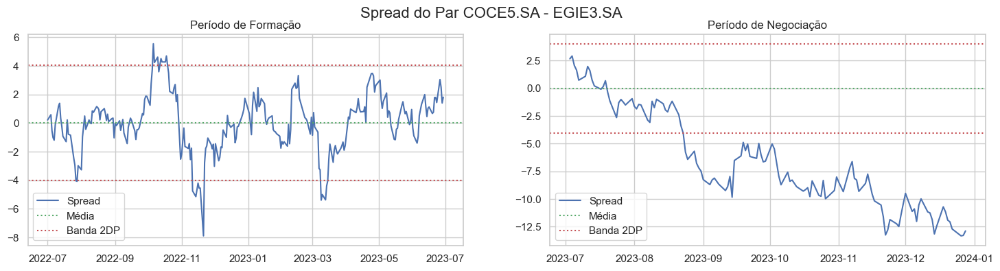

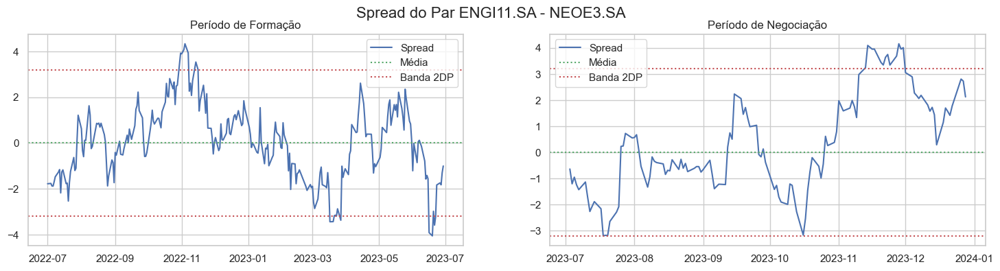

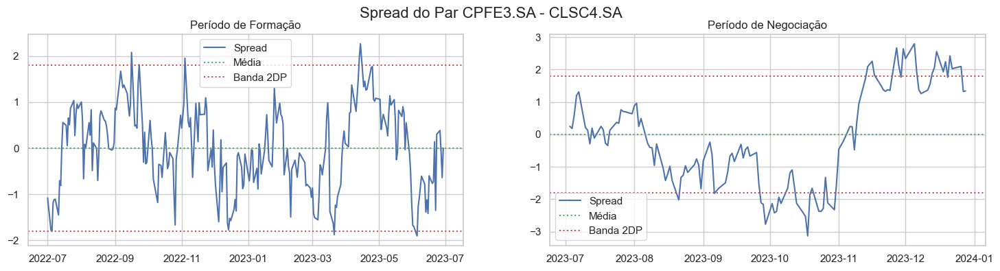

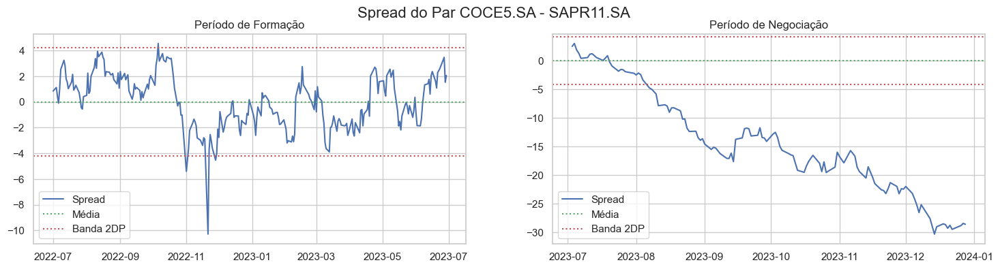

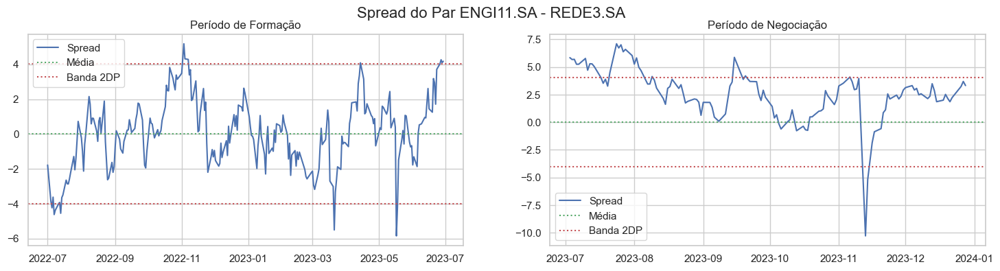

In [152]:
def plot_spreads(resultados_spreads_trading):
    """
    Plota os spreads de formação e de negociação para os pares selecionados.
    """
    for s1, s2, spread_trading, alpha, beta, media_spread, desvio_spread in resultados_spreads_trading:
        # Calculando o spread para o período de formação usando os valores armazenados
        spread_formacao = cotacoes_formacao_10[s1] - (alpha + beta * cotacoes_formacao_10[s2])

        # Criando gráficos lado a lado
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 4))
        fig.suptitle(f'Spread do Par {s1} - {s2}', fontsize=16)

        # Período de formação
        ax1.plot(spread_formacao, label='Spread')
        ax1.axhline(y=media_spread, color='g', linestyle='dotted', label='Média')
        ax1.axhline(y=media_spread + 2 * desvio_spread, color='r', linestyle='dotted', label='Banda 2DP')
        ax1.axhline(y=media_spread - 2 * desvio_spread, color='r', linestyle='dotted')
        ax1.set_title('Período de Formação')
        ax1.legend()

        # Período de negociação
        ax2.plot(spread_trading, label='Spread')
        ax2.axhline(y=media_spread, color='g', linestyle='dotted', label='Média')
        ax2.axhline(y=media_spread + 2 * desvio_spread, color='r', linestyle='dotted', label='Banda 2DP')
        ax2.axhline(y=media_spread - 2 * desvio_spread, color='r', linestyle='dotted')
        ax2.set_title('Período de Negociação')
        ax2.legend()

        plt.show()

# Chamando a função para os pares em resultados_spreads_trading_5
plot_spreads(resultados_spreads_trading_10)

#### **2.10.5. Definindo os Sinais da Estratégia**

In [153]:
resultados_z_scores_trading_10 = []

for acao1, acao2, spread_trading, alpha, beta, media_spread, desvio_spread in resultados_spreads_trading_10:
    z_score_trading = (spread_trading - media_spread) / desvio_spread
    resultados_z_scores_trading_10.append((acao1, acao2, z_score_trading))
    print(f"Par: {acao1} e {acao2} - Média do Z-score: {z_score_trading.mean():.4f}, Desvio Padrão do Z-score: {z_score_trading.std():.4f}\n")

Par: COCE5.SA e EGIE3.SA - Média do Z-score: -3.2430, Desvio Padrão do Z-score: 2.1926

Par: ENGI11.SA e NEOE3.SA - Média do Z-score: 0.2053, Desvio Padrão do Z-score: 1.1691

Par: CPFE3.SA e CLSC4.SA - Média do Z-score: -0.1181, Desvio Padrão do Z-score: 1.6871

Par: COCE5.SA e SAPR11.SA - Média do Z-score: -6.7214, Desvio Padrão do Z-score: 4.2984

Par: ENGI11.SA e REDE3.SA - Média do Z-score: 1.3099, Desvio Padrão do Z-score: 1.1527



In [154]:
sinais_trade_list_10 = []

for acao1, acao2, z_score_trading in resultados_z_scores_trading_10:
    sinais_trade = pd.DataFrame(index=z_score_trading.index)
    sinais_trade[f'Preços {acao1}'] = cotacoes_trading_10[acao1]
    sinais_trade[f'Preços {acao2}'] = cotacoes_trading_10[acao2]

    posicao_short_ativa = False
    posicao_long_ativa = False

    entradas_short = []
    entradas_long = []
    saidas_short = []
    saidas_long = []

    for i in range(len(sinais_trade)):
        if not posicao_short_ativa and not posicao_long_ativa:
            if (z_score_trading.iloc[i] > sinal_entrada) and (z_score_trading.shift(1).iloc[i] < sinal_entrada):
                entradas_short.append(True)
                entradas_long.append(False)
                posicao_short_ativa = True
            elif (z_score_trading.iloc[i] < -sinal_entrada) and (z_score_trading.shift(1).iloc[i] > -sinal_entrada):
                entradas_long.append(True)
                entradas_short.append(False)
                posicao_long_ativa = True
            else:
                entradas_short.append(False)
                entradas_long.append(False)
        else:
            entradas_short.append(False)
            entradas_long.append(False)

        if posicao_short_ativa:
            saida = (z_score_trading.iloc[i] < sinal_saida) and (z_score_trading.shift(1).iloc[i] > sinal_saida)
            saidas_short.append(saida)
            saidas_long.append(False)
            if saida:
                posicao_short_ativa = False
        elif posicao_long_ativa:
            saida = (z_score_trading.iloc[i] > -sinal_saida) and (z_score_trading.shift(1).iloc[i] < -sinal_saida)
            saidas_long.append(saida)
            saidas_short.append(False)
            if saida:
                posicao_long_ativa = False
        else:
            saidas_short.append(False)
            saidas_long.append(False)

    sinais_trade['Entrada Short'] = entradas_short
    sinais_trade['Entrada Long'] = entradas_long
    sinais_trade['Saida Short'] = saidas_short
    sinais_trade['Saida Long'] = saidas_long

    sinais_trade_list_10.append((acao1, acao2, z_score_trading, sinais_trade))

#### **2.10.6. Calculando os Retornos**

In [155]:
resultado_backtest_todos_pares_10 = []

for acao1, acao2, z_score_trading, sinais_trade in sinais_trade_list_10:
    resultado = pd.DataFrame(index=sinais_trade.index)
    resultado[f'{acao1}'] = cotacoes_trading_10[acao1]
    resultado[f'{acao2}'] = cotacoes_trading_10[acao2]
    resultado['CDI'] = indices_trading_10['CDI']
    resultado['Entrada Short'] = sinais_trade['Entrada Short']
    resultado['Saida Short'] = sinais_trade['Saida Short']
    resultado['Entrada Long'] = sinais_trade['Entrada Long']
    resultado['Saida Long'] = sinais_trade['Saida Long']

    retorno_acao1 = []
    retorno_acao2 = []

    posicao_short_ativa = False
    posicao_long_ativa = False

    for i in range(len(sinais_trade)):
        if sinais_trade['Entrada Short'].iloc[i]:
            posicao_short_ativa = True
            retorno_acao1.append(-0.001)
            retorno_acao2.append(-0.001)
        elif sinais_trade['Entrada Long'].iloc[i]:
            posicao_long_ativa = True
            retorno_acao1.append(-0.001)
            retorno_acao2.append(-0.001)
        elif posicao_short_ativa:
            if sinais_trade['Saida Short'].iloc[i]:
                retorno_acao1.append(-0.001)
                retorno_acao2.append(-0.001)
                posicao_short_ativa = False
            else:
                retorno_acao1.append(-(cotacoes_trading_10[acao1].iloc[i] / cotacoes_trading_10[acao1].iloc[i-1] - 1))
                retorno_acao2.append(cotacoes_trading_10[acao2].iloc[i] / cotacoes_trading_10[acao2].iloc[i-1] - 1)
        elif posicao_long_ativa:
            if sinais_trade['Saida Long'].iloc[i]:
                retorno_acao1.append(-0.001)
                retorno_acao2.append(-0.001)
                posicao_long_ativa = False
            else:
                retorno_acao1.append(cotacoes_trading_10[acao1].iloc[i] / cotacoes_trading_10[acao1].iloc[i-1] - 1)
                retorno_acao2.append(-(cotacoes_trading_10[acao2].iloc[i] / cotacoes_trading_10[acao2].iloc[i-1] - 1))
        else:
            retorno_acao1.append(resultado['CDI'].iloc[i])
            retorno_acao2.append(resultado['CDI'].iloc[i])

    resultado[f"Retorno {acao1}"] = retorno_acao1
    resultado[f"Retorno {acao2}"] = retorno_acao2

    resultado_backtest_todos_pares_10.append((acao1, acao2, z_score_trading, resultado))

In [156]:
# Lista para armazenar os retornos acumulados de cada par e da estratégia conjunta
resultados_retornos_10 = []

# Iterando sobre cada resultado do backtest em resultado_backtest_todos_pares
for acao1, acao2, z_score_trading, resultado in resultado_backtest_todos_pares_10:
    # Inicializando os retornos acumulados
    retorno_acumulado_acao1 = 1
    retorno_acumulado_acao2 = 1
    cdi_acumulado = 1
    retorno_acumulado_acao1_list = []
    retorno_acumulado_acao2_list = []
    cdi_acumulado_list = []
    retorno_acumulado_conjunto_list = []

    # Iterando sobre as datas do DataFrame para calcular os retornos acumulados
    for i in range(len(resultado)):
        # Calculando o retorno acumulado de nome1, nome2 e cdi
        retorno_acumulado_acao1 *= (1 + resultado[f"Retorno {acao1}"].iloc[i])
        retorno_acumulado_acao2 *= (1 + resultado[f"Retorno {acao2}"].iloc[i])
        cdi_acumulado *= (1 + resultado['CDI'].iloc[i])

        # Adicionando os valores à lista de retorno acumulado
        retorno_acumulado_acao1_list.append(retorno_acumulado_acao1)
        retorno_acumulado_acao2_list.append(retorno_acumulado_acao2)
        cdi_acumulado_list.append(cdi_acumulado)

        # Calculando o retorno acumulado conjunto (média dos acumulados)
        retorno_acumulado_conjunto = (retorno_acumulado_acao1 + retorno_acumulado_acao2) / 2
        retorno_acumulado_conjunto_list.append(retorno_acumulado_conjunto)

    # Adicionando os retornos acumulados ao DataFrame de resultado
    resultado[f"Retorno Acumulado {acao1}"] = retorno_acumulado_acao1_list
    resultado[f"Retorno Acumulado {acao2}"] = retorno_acumulado_acao2_list
    resultado['CDI Acumulado'] = cdi_acumulado_list
    resultado['Retorno Acumulado Conjunto'] = retorno_acumulado_conjunto_list

    # Adicionando o resultado do par à lista de resultados acumulados
    resultados_retornos_10.append((acao1, acao2, z_score_trading, resultado))

In [157]:
# Inicializando um DataFrame vazio com o índice de datas baseado no primeiro resultado
resultado_retornos_periodo_10 = pd.DataFrame(index=resultados_retornos_10[0][3].index)

# Adicionando as colunas de retorno acumulado conjunto de cada par
for acao1, acao2, z_score_trading, resultado in resultados_retornos_10:
    coluna_nome = f"{acao1}-{acao2} Retorno Acumulado Conjunto"
    resultado_retornos_periodo_10[coluna_nome] = resultado['Retorno Acumulado Conjunto']

# Calculando a média dos retornos acumulados de todos os pares para criar a coluna 'Retorno Acumulado da Estratégia'
resultado_retornos_periodo_10['Retorno Acumulado da Estratégia'] = resultado_retornos_periodo_10.mean(axis=1)

# Adicionando a coluna de 'CDI Acumulado' para comparação
resultado_retornos_periodo_10['CDI Acumulado'] = resultados_retornos_10[0][3]['CDI Acumulado']

# Exibindo o DataFrame resultante
display(resultado_retornos_periodo_10)

,COCE5.SA-EGIE3.SA Retorno Acumulado Conjunto,ENGI11.SA-NEOE3.SA Retorno Acumulado Conjunto,CPFE3.SA-CLSC4.SA Retorno Acumulado Conjunto,COCE5.SA-SAPR11.SA Retorno Acumulado Conjunto,ENGI11.SA-REDE3.SA Retorno Acumulado Conjunto,Retorno Acumulado da Estratégia,CDI Acumulado
Date,,,,,,,
2023-07-03,1.000508,1.000508,1.000508,1.000508,1.000508,1.000508,1.000508
2023-07-04,1.001016,1.001016,1.001016,1.001016,1.001016,1.001016,1.001016
2023-07-05,1.001524,1.001524,1.001524,1.001524,1.001524,1.001524,1.001524
2023-07-06,1.002033,1.002033,1.002033,1.002033,1.002033,1.002033,1.002033
2023-07-07,1.002542,1.002542,1.002542,1.002542,1.002542,1.002542,1.002542
...,...,...,...,...,...,...,...
2023-12-21,0.934703,1.126741,1.089743,0.793435,1.078216,1.004568,1.059099
2023-12-22,0.928162,1.127234,1.099220,0.787262,1.078688,1.004113,1.059563
2023-12-26,0.922172,1.126107,1.096450,0.789297,1.079160,1.002637,1.060026


#### **2.10.7. Visualizando os Retornos**

In [ ]:
# Definindo a quantidade de pares que queremos visualizar (ajuste conforme necessário)
num_pares_visualizar = 5

# Criando subplots para visualizar as curvas de equity dos primeiros pares cointegrados
fig, ax = plt.subplots(num_pares_visualizar, 1, figsize=(14, 4 * num_pares_visualizar))
fig.suptitle("Comparação de Retorno Acumulado da Estratégia vs CDI Acumulado", fontsize=16)

# Iterando sobre os pares e plotando
for i, (acao1, acao2, z_score_trading, resultado) in enumerate(resultados_retornos_10[:num_pares_visualizar]):
    # Plotando o Retorno Acumulado Conjunto e CDI Acumulado
    ax[i].plot(resultado.index, resultado['Retorno Acumulado Conjunto'], color='purple', label='Retorno Acumulado da Estratégia')
    ax[i].plot(resultado.index, resultado['CDI Acumulado'], color='blue', label='CDI Acumulado')
    
    # Título e configurações do gráfico
    ax[i].set_title(f"Retorno Acumulado para o Par {acao1} e {acao2}", fontsize=14)
    ax[i].set_xlabel("Data")
    ax[i].set_ylabel("Retorno Acumulado")
    ax[i].legend()

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

In [ ]:
# Plotando o gráfico de comparação
plt.figure(figsize=(14, 7))

# Plotando a curva de Retorno Acumulado da Estratégia
plt.plot(resultado_retornos_periodo_10.index, resultado_retornos_periodo_10['Retorno Acumulado da Estratégia'], label='Retorno Acumulado da Estratégia', color='#220042')

# Plotando a curva de CDI Acumulado
plt.plot(resultado_retornos_periodo_10.index, resultado_retornos_periodo_10['CDI Acumulado'], label='CDI Acumulado', color='b')

# Configurando o título e os rótulos
plt.title('Comparação do Retorno Acumulado da Estratégia e CDI Acumulado no Período 10', fontsize=16)
plt.xlabel('Data', fontsize=12)
plt.ylabel('Retorno Acumulado', fontsize=12)
plt.legend()

# Exibindo o gráfico
plt.show()

In [ ]:
fig, ax = plt.subplots(3, 2, figsize=(20, 25))

for i, (acao1, acao2, z_score_trading, resultado) in enumerate(resultados_retornos_10):
    row = i // 2
    col = i % 2

    ax[row, col].plot(z_score_trading.index, z_score_trading, color='#8477ab', label='Z-Score Móvel da Razão', zorder=1)
    ax[row, col].axhline(0, color='black', zorder=2)
    ax[row, col].axhline(2.0, color='green', linestyle='--', zorder=2)
    ax[row, col].axhline(-2.0, color='red', linestyle='--', zorder=2)

    entradas_short = resultado[resultado['Entrada Short']]
    entradas_long = resultado[resultado['Entrada Long']]
    ax[row, col].scatter(entradas_short.index, z_score_trading.loc[entradas_short.index], color='green', s=50, zorder=3)
    ax[row, col].scatter(entradas_long.index, z_score_trading.loc[entradas_long.index], color='green', s=50, zorder=3)

    saidas_short = resultado[resultado['Saida Short']]
    saidas_long = resultado[resultado['Saida Long']]
    ax[row, col].scatter(saidas_short.index, z_score_trading.loc[saidas_short.index], color='red', s=50, zorder=3)
    ax[row, col].scatter(saidas_long.index, z_score_trading.loc[saidas_long.index], color='red', s=50, zorder=3)

    ax[row, col].set_title(f"Z-Score Trading para {acao1} e {acao2}", fontsize=14)
    ax[row, col].set_xlabel("Data")
    ax[row, col].set_ylabel("Z-Score")
    ax[row, col].legend()

plt.tight_layout()
plt.show()

## **3. Retorno Total da Estratégia**

In [158]:
# Lista para armazenar os dados de retorno diário do CDI e retorno diário conjunto
dados_empilhados = []

# Iterando sobre todas as listas de resultado_backtest_todos_pares
for resultado_backtest in [
    resultado_backtest_todos_pares_1,
    resultado_backtest_todos_pares_2,
    resultado_backtest_todos_pares_3,
    resultado_backtest_todos_pares_4,
    resultado_backtest_todos_pares_5,
    resultado_backtest_todos_pares_6,
    resultado_backtest_todos_pares_7,
    resultado_backtest_todos_pares_8,
    resultado_backtest_todos_pares_9,
    resultado_backtest_todos_pares_10,
]:
    # Inicializando listas temporárias para armazenar os retornos diários dos 5 pares
    retornos_diarios_conjuntos = []
    retornos_diarios_cdi = None

    # Iterando sobre cada par na lista
    for _, _, _, resultado in resultado_backtest:
        # Extraindo o retorno diário do CDI e retorno diário conjunto
        if retornos_diarios_cdi is None:
            retornos_diarios_cdi = resultado['CDI']

        # Calculando o retorno diário conjunto como a média entre as ações do par
        retorno_diario_conjunto = (
            resultado[f"Retorno {resultado.columns[0]}"] + resultado[f"Retorno {resultado.columns[1]}"]
        ) / 2
        retornos_diarios_conjuntos.append(retorno_diario_conjunto)

    # Calculando a média dos retornos diários entre os pares
    media_retorno_diario_conjunto = pd.concat(retornos_diarios_conjuntos, axis=1).mean(axis=1)

    # Empilhando os dados no formato desejado
    dados_empilhados.append(pd.DataFrame({
        'Retorno Diário CDI': retornos_diarios_cdi.values,
        'Retorno Diário Conjunto': media_retorno_diario_conjunto.values
    }, index=retornos_diarios_cdi.index))

# Concatenando todos os períodos em um único DataFrame
resultado_geral = pd.concat(dados_empilhados)

In [ ]:
resultado_backtest_todos_pares_1

In [159]:
import pandas as pd

# Lista para armazenar os DataFrames com os retornos diários do CDI e do período
retornos_diarios_periodos = []

# Iterando sobre as 10 listas de resultado_backtest_todos_pares
for resultado_backtest in [
    resultado_backtest_todos_pares_1,
    resultado_backtest_todos_pares_2,
    resultado_backtest_todos_pares_3,
    resultado_backtest_todos_pares_4,
    resultado_backtest_todos_pares_5,
    resultado_backtest_todos_pares_6,
    resultado_backtest_todos_pares_7,
    resultado_backtest_todos_pares_8,
    resultado_backtest_todos_pares_9,
    resultado_backtest_todos_pares_10,
]:
    # Lista para armazenar os retornos diários acumulados conjuntos dos 5 pares
    retornos_diarios_conjuntos = []
    retornos_diarios_cdi = None

    # Iterando sobre cada par na lista
    for _, _, _, resultado in resultado_backtest:
        # Pegando a série de retorno acumulado diário do CDI (que é a mesma para todos os pares do período)
        if retornos_diarios_cdi is None:
            retornos_diarios_cdi = resultado['CDI Acumulado']

        # Pegando a série de retorno acumulado diário conjunto para o par
        retornos_diarios_conjuntos.append(resultado['Retorno Acumulado Conjunto'])

    # Calculando a média dos retornos acumulados diários entre os 5 pares
    media_retorno_diario_conjunto = pd.concat(retornos_diarios_conjuntos, axis=1).mean(axis=1)

    # Criando o DataFrame com os retornos diários do período
    df_retorno_diario = pd.DataFrame({
        'Retorno Diário CDI': retornos_diarios_cdi.values,
        'Retorno Diário Período': media_retorno_diario_conjunto.values
    }, index=retornos_diarios_cdi.index)

    # Adicionando o DataFrame à lista de retornos diários dos períodos
    retornos_diarios_periodos.append(df_retorno_diario)

# Agora `retornos_diarios_periodos` contém 10 DataFrames, um para cada período de negociação.

In [160]:
# Criando uma cópia da lista original para armazenar os retornos acumulados
retornos_diarios_acumulados = retornos_diarios_periodos.copy()

# Inicializando o retorno acumulado com o primeiro período
for i in range(1, len(retornos_diarios_acumulados)):
    # Pegamos a última linha do período anterior
    ultima_linha_anterior = retornos_diarios_acumulados[i - 1].iloc[-1]

    # Multiplicamos todas as linhas do período atual pela última linha do período anterior
    retornos_diarios_acumulados[i] = retornos_diarios_acumulados[i] * (ultima_linha_anterior)

# Agora `retornos_diarios_acumulados` contém os retornos diários acumulados ao longo dos 10 períodos.

In [161]:
# Concatenando os 10 DataFrames acumulados em um único DataFrame final
df_final = pd.concat(retornos_diarios_acumulados)

# Renomeando as colunas para "CDI Acumulado" e "Retorno Acumulado"
df_final.columns = ["CDI Acumulado", "Retorno Acumulado"]

# Exibindo o DataFrame final
print(df_final)

            CDI Acumulado  Retorno Acumulado
Date                                        
2019-01-02       1.000246           1.000246
2019-01-03       1.000492           1.000492
2019-01-04       1.000739           1.000739
2019-01-07       1.000985           1.000486
2019-01-08       1.001232           0.998410
...                   ...                ...
2023-12-21       1.435688           1.044106
2023-12-22       1.436315           1.043634
2023-12-26       1.436944           1.042100
2023-12-27       1.437572           1.048331
2023-12-28       1.438201           1.054207

[1237 rows x 2 columns]


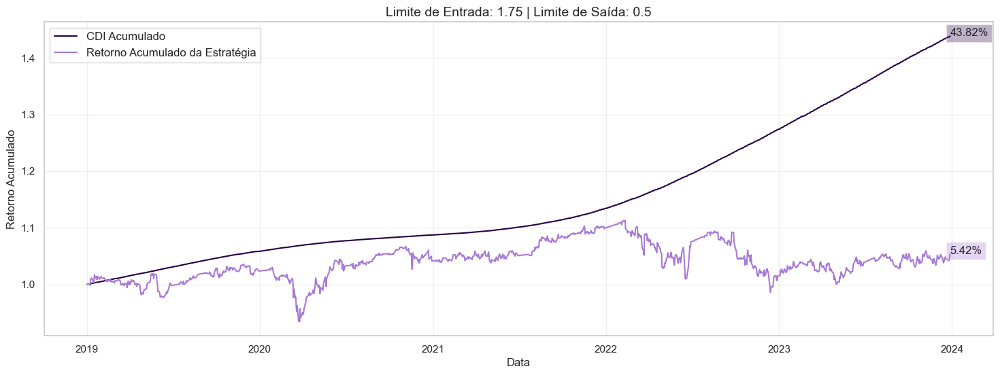

In [162]:
# Criando a figura e o gráfico
plt.figure(figsize=(18, 6))

# Plotando as séries de retorno acumulado
plt.plot(df_final.index, df_final["CDI Acumulado"], label="CDI Acumulado", color="#260044")
plt.plot(df_final.index, df_final["Retorno Acumulado"], label="Retorno Acumulado da Estratégia", color="#A879D4")

# Configurações do gráfico
plt.xlabel("Data", fontsize=12)
plt.ylabel("Retorno Acumulado", fontsize=12)
plt.title("Limite de Entrada: 1.75 | Limite de Saída: 0.5", fontsize=14)
plt.legend(fontsize=12)
plt.grid(alpha=0.3)

# Obtendo os valores finais das colunas em percentual
cdi_final = (df_final["CDI Acumulado"].iloc[-1] - 1) * 100
retorno_final = (df_final["Retorno Acumulado"].iloc[-1] - 1) * 100

# Adicionando retângulos ao final das linhas
plt.text(df_final.index[-1], df_final["CDI Acumulado"].iloc[-1],
         f"{cdi_final:.2f}%", fontsize=12, bbox=dict(facecolor='#260044', alpha=0.3))

plt.text(df_final.index[-1], df_final["Retorno Acumulado"].iloc[-1],
         f"{retorno_final:.2f}%", fontsize=12, bbox=dict(facecolor='#A879D4', alpha=0.3))

# Salvando a imagem em alta qualidade
plt.savefig("resultado_1.75_0.5.png", dpi=300, bbox_inches="tight")

# Exibir o gráfico
plt.show()

In [163]:
# Gerando a string com os valores formatados
resultado_final = f"Retorno final do CDI foi: {cdi_final:.4f}%\nRetorno Final da Estratégia foi: {retorno_final:.4f}%"

# Exibindo o resultado
print(resultado_final)

Retorno final do CDI foi: 43.8201%
Retorno Final da Estratégia foi: 5.4207%


## **EXTRA**

In [ ]:
import yfinance as yf
import matplotlib.pyplot as plt

# Baixando os dados
dados = yf.download('ENGI11.SA', start='2018-07-01', end='2019-06-30')['Adj Close']

# Calculando os retornos
retornos = dados.pct_change().dropna()

# Configurando os gráficos
fig, ax = plt.subplots(2, 1, figsize=(10, 6))

# Gráfico dos preços ajustados
ax[0].plot(dados.index, dados, label='Preços Ajustados', color='#05b4d4')
ax[0].set_title('Preços Ajustados da ENGI11.SA')
ax[0].set_ylabel('Preço')
ax[0].grid(alpha=0.3)
ax[0].legend()

# Gráfico dos retornos com linha na média
ax[1].plot(retornos.index, retornos, label='Retornos Diários', color='#05b4d4')
ax[1].axhline(retornos.mean(), color='#fc6708', linestyle='--', label=f'Média: {retornos.mean():.4f}')
ax[1].set_title('Retornos Diários da ENGI11.SA')
ax[1].set_ylabel('Retorno')
ax[1].grid(alpha=0.3)
ax[1].legend()

# Ajustando o layout
plt.tight_layout()
plt.show()

In [ ]:
import yfinance as yf
import matplotlib.pyplot as plt

# Baixando os dados
dados = yf.download('TAEE11.SA', start='2018-07-01', end='2019-06-30')['Adj Close']

# Calculando os retornos
retornos = dados.pct_change().dropna()

# Configurando os gráficos
fig, ax = plt.subplots(2, 1, figsize=(10, 6))

# Gráfico dos preços ajustados
ax[0].plot(dados.index, dados, label='Preços Ajustados', color='#0b2d65')
ax[0].set_title('Preços Ajustados da TAEE11.SA')
ax[0].set_ylabel('Preço')
ax[0].grid(alpha=0.3)
ax[0].legend()

# Gráfico dos retornos com linha na média
ax[1].plot(retornos.index, retornos, label='Retornos Diários', color='#0b2d65')
ax[1].axhline(retornos.mean(), color='#f7640b', linestyle='--', label=f'Média: {retornos.mean():.4f}')
ax[1].set_title('Retornos Diários da TAEE11.SA')
ax[1].set_ylabel('Retorno')
ax[1].grid(alpha=0.3)
ax[1].legend()

# Ajustando o layout
plt.tight_layout()
plt.show()

In [ ]:
# Baixar os dados
start_date = '2018-07-01'
end_date = '2019-06-30'
acoes = ['ENGI11.SA', 'TAEE11.SA']

dados = yf.download(acoes, start=start_date, end=end_date)['Adj Close']

# Teste ADF para preços e retornos
def teste_adf(series, nome_serie):
    resultado = adfuller(series.dropna())
    p_valor = resultado[1]
    print(f"Teste ADF para {nome_serie}:")
    print(f"Estatística de Teste: {resultado[0]:.10f}")
    print(f"p-valor: {p_valor}")
    print("H0: A série NÃO é estacionária (possui raiz unitária).")
    print("H1: A série é estacionária.\n")
    return p_valor

# Teste de Cointegração Engle-Granger
def teste_coint(series1, series2, nome1, nome2):
    resultado = coint(series1, series2)
    p_valor = resultado[1]
    print(f"Teste de Cointegração entre {nome1} e {nome2}:")
    print(f"Estatística de Teste: {resultado[0]:.10f}")
    print(f"p-valor: {p_valor:.10f}")
    print("H0: As séries NÃO são cointegradas.")
    print("H1: As séries são cointegradas.\n")
    return p_valor

# Aplicar os testes
for acao in acoes:
    print(f"--- Testes para {acao} ---")
    teste_adf(dados[acao], f"Preços de {acao}")
    retornos = dados[acao].pct_change().dropna()
    teste_adf(retornos, f"Retornos de {acao}")

print("--- Teste de Cointegração ---")
teste_coint(dados['ENGI11.SA'], dados['TAEE11.SA'], 'ENGI11.SA', 'TAEE11.SA')

In [ ]:
# Carregando os dados das séries
dados = dados[['ENGI11.SA', 'TAEE11.SA']]  # Certifique-se de que os dados estão corretamente selecionados

# Estimando alpha e beta usando OLS
X = sm.add_constant(dados['TAEE11.SA'])  # Adicionando o termo de intercepto (constante)
modelo = sm.OLS(dados['ENGI11.SA'], X).fit()
alpha = modelo.params[0]
beta = modelo.params[1]

# Calculando o spread
spread = dados['ENGI11.SA'] - (alpha + beta * dados['TAEE11.SA'])
media_spread = spread.mean()

# Normalizando os preços
precos_normalizados = dados / dados.iloc[0]

In [ ]:
# Configurando os gráficos com subplots
fig, ax = plt.subplots(2, 1, figsize=(10, 6))

# Gráfico 1: Preços normalizados
ax[0].plot(precos_normalizados['ENGI11.SA'], label='ENGI11.SA', color='#05b4d4')
ax[0].plot(precos_normalizados['TAEE11.SA'], label='TAEE11.SA', color='#0b2d65')
ax[0].set_title('Preços Normalizados')
ax[0].set_xlabel('Data')
ax[0].set_ylabel('Preço Normalizado')
ax[0].legend()
ax[0].grid(alpha=0.3)

# Gráfico 2: Spread entre as duas séries
ax[1].plot(spread, label='Spread (ENGI11.SA - TAEE11.SA)', color='#220042')
ax[1].axhline(media_spread, color='orange', linestyle='--', label='Média do Spread')
ax[1].set_title('Spread - ENGI11.SA e TAEE11.SA')
ax[1].set_xlabel('Data')
ax[1].set_ylabel('Spread')
ax[1].legend()
ax[1].grid(alpha=0.3)

# Ajustando o layout para evitar sobreposição
plt.tight_layout()
plt.show()

# Exibindo os valores de alpha e beta calculados
print(f"Alpha: {alpha:.4f}, Beta: {beta:.4f}")


## **GRÁFICOS PARA O ARTIGO ACADÊMICO**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Definição dos períodos de negociação (t = 1 a t = 10) e semestres
negociacao_periodos = [f"t = {i}" for i in range(1, 11)]
anos = ["2018.1", "2018.2", "2019.1", "2019.2", "2020.1", "2020.2", 
        "2021.1", "2021.2", "2022.1", "2022.2", "2023.1", "2023.2"]

# Criando a matriz 12x10 onde 1 representa Formação e 2 representa Negociação
matriz = np.zeros((10, 12))

# Preenchendo os períodos de Formação (1) e Negociação (2)
for i in range(10):
    matriz[i, i] = 1       # Primeiro quadrado de formação
    matriz[i, i + 1] = 1   # Segundo quadrado de formação
    matriz[i, i + 2] = 2   # Terceiro quadrado para negociação

# Criando o gráfico
fig, ax = plt.subplots(figsize=(10, 8))

# Mapeando cores
cmap = {0: "white", 1: "#260044", 2: "#A879D4"}
colors = np.vectorize(cmap.get)(matriz)

# Criando a grade
for i in range(10):
    for j in range(12):
        ax.add_patch(plt.Rectangle((j, 9 - i), 1, 1, color=colors[i, j], edgecolor='black', linewidth=0.5))

# Configuração dos eixos
ax.set_xticks(np.arange(12) + 0.5)
ax.set_xticklabels(anos, rotation=90, ha="center")
ax.set_yticks(np.arange(10) + 0.5)
ax.set_yticklabels(negociacao_periodos[::-1])  # Invertendo para alinhar corretamente

# Adicionando rótulos nos eixos
ax.set_xlabel("Semestre", fontsize=12, labelpad=10)
ax.set_ylabel("Período (t)", fontsize=12, labelpad=10)

# Adicionando a legenda abaixo do gráfico
from matplotlib.patches import Patch
legenda = [Patch(color="#260044", label="Período de Formação"),
           Patch(color="#A879D4", label="Período de Negociação")]
ax.legend(handles=legenda, loc="upper center", bbox_to_anchor=(0.5, 1.08), ncol=2, fontsize=12)

# Removendo título (será adicionado no LaTeX)
# Removendo eixos e adicionando a grade
ax.set_xticks(np.arange(13), minor=True)
ax.set_yticks(np.arange(11), minor=True)
ax.grid(which="minor", color="black", linestyle='-', linewidth=0.5)
ax.set_xlim(0, 12)
ax.set_ylim(0, 10)

# Salvando a imagem em alta qualidade
#plt.savefig("periodos_formacao_negociacao.png", dpi=300, bbox_inches="tight")

# Exibir gráfico
plt.show()

In [ ]:
import yfinance as yf
import matplotlib.pyplot as plt

# Baixando os dados
dados1 = yf.download('ENGI11.SA', start='2018-07-01', end='2019-06-30')['Adj Close']
dados2 = yf.download('TAEE11.SA', start='2018-07-01', end='2019-06-30')['Adj Close']

# Calculando os retornos
retornos1 = dados1.pct_change().dropna()
retornos2 = dados2.pct_change().dropna()

# Configurando os gráficos
fig, ax = plt.subplots(1, 2, figsize=(18, 4))

# Gráfico dos preços ajustados
ax[0].plot(dados1.index, dados1, label='Preço Ajustado', color='#260044')
ax[0].set_title('ENGI11.SA')
ax[0].set_ylabel('Preço')
ax[0].grid(alpha=0.3)
ax[0].legend()

# Gráfico dos preços ajustados
ax[1].plot(dados2.index, dados2, label='Preço Ajustado', color='#A879D4')
ax[1].set_title('TAEE11.SA')
ax[1].set_ylabel('Preço')
ax[1].grid(alpha=0.3)
ax[1].legend()

# Salvando a imagem em alta qualidade
#plt.savefig("PreçosAjustados.png", dpi=300, bbox_inches="tight")

# Ajustando o layout
plt.tight_layout()
plt.show()

In [ ]:
import yfinance as yf
import matplotlib.pyplot as plt

# Baixando os dados
dados1 = yf.download('ENGI11.SA', start='2018-07-01', end='2019-06-30')['Adj Close']
dados2 = yf.download('TAEE11.SA', start='2018-07-01', end='2019-06-30')['Adj Close']

# Calculando os retornos
retornos1 = dados1.pct_change().dropna()
retornos2 = dados2.pct_change().dropna()

# Configurando os gráficos
fig, ax = plt.subplots(1, 2, figsize=(18, 4))

# Gráfico dos retornos com linha na média
ax[0].plot(retornos1.index, retornos1, label='Retorno Diário', color='#260044')
ax[0].axhline(retornos1.mean(), color='gold', linestyle='--', label=f'Média: {retornos1.mean():.4f}')
ax[0].set_title('ENGI11.SA')
ax[0].set_ylabel('Retorno')
ax[0].grid(alpha=0.3)
ax[0].legend()

# Gráfico dos retornos com linha na média
ax[1].plot(retornos2.index, retornos2, label='Retorno Diário', color='#A879D4')
ax[1].axhline(retornos2.mean(), color='gold', linestyle='--', label=f'Média: {retornos2.mean():.4f}')
ax[1].set_title('TAEE11.SA')
ax[1].set_ylabel('Retorno')
ax[1].grid(alpha=0.3)
ax[1].legend()

# Salvando a imagem em alta qualidade
#plt.savefig("RetornosDiarios.png", dpi=300, bbox_inches="tight")

# Ajustando o layout
plt.tight_layout()
plt.show()

In [ ]:
# Baixar os dados
start_date = '2018-07-01'
end_date = '2019-06-30'
acoes = ['ENGI11.SA', 'TAEE11.SA']

dados = yf.download(acoes, start=start_date, end=end_date)['Adj Close']

# Carregando os dados das séries
dados = dados[['ENGI11.SA', 'TAEE11.SA']]  # Certifique-se de que os dados estão corretamente selecionados

# Estimando alpha e beta usando OLS
X = sm.add_constant(dados['TAEE11.SA'])  # Adicionando o termo de intercepto (constante)
modelo = sm.OLS(dados['ENGI11.SA'], X).fit()
alpha = modelo.params[0]
beta = modelo.params[1]

# Calculando o spread
spread = dados['ENGI11.SA'] - (alpha + beta * dados['TAEE11.SA'])
media_spread = spread.mean()

# Normalizando os preços
precos_normalizados = dados / dados.iloc[0]

# Configurando os gráficos
fig, ax = plt.subplots(1, 2, figsize=(18, 4))

# Gráfico 1: Preços normalizados
ax[0].plot(precos_normalizados['ENGI11.SA'], label='ENGI11.SA', color='#260044')
ax[0].plot(precos_normalizados['TAEE11.SA'], label='TAEE11.SA', color='#A879D4')
ax[0].set_title('Preços Normalizados')
ax[0].set_xlabel('Data')
ax[0].set_ylabel('Preço Normalizado')
ax[0].legend()
ax[0].grid(alpha=0.3)

# Gráfico 2: Spread entre as duas séries
ax[1].plot(spread, label='Spread (ENGI11.SA - TAEE11.SA)', color='#000645')
ax[1].axhline(media_spread, color='gold', linestyle='--', label='Média do Spread')
ax[1].set_title('Spread - ENGI11.SA e TAEE11.SA')
ax[1].set_xlabel('Data')
ax[1].set_ylabel('Spread')
ax[1].legend()
ax[1].grid(alpha=0.3)

# Salvando a imagem em alta qualidade
#plt.savefig("ExemploEngleGranger.png", dpi=300, bbox_inches="tight")

# Ajustando o layout
plt.tight_layout()
plt.show()

In [ ]:
# Baixar os dados
start_date = '2019-07-01'
end_date = '2019-12-31'
acoes = ['ENGI11.SA', 'TAEE11.SA']

dados = yf.download(acoes, start=start_date, end=end_date)['Adj Close']

# Carregando os dados das séries
dados = dados[['ENGI11.SA', 'TAEE11.SA']]  # Certifique-se de que os dados estão corretamente selecionados

spread_neg = dados['ENGI11.SA'] - (alpha + beta * dados['TAEE11.SA'])

desvio_spread = spread.std()

z_score = (spread_neg - media_spread) / desvio_spread

z_score_media = z_score.mean()

# Configurando os gráficos
fig, ax = plt.subplots(1, 2, figsize=(18, 4))

# Gráfico 2: Spread entre as duas séries
ax[0].plot(spread_neg, label='Spread (ENGI11.SA - TAEE11.SA)', color='#260044')
ax[0].axhline(media_spread, color='gold', linestyle='--', label='Média do Spread')
ax[0].set_title('Spread - ENGI11.SA e TAEE11.SA')
ax[0].set_xlabel('Data')
ax[0].set_ylabel('Spread')
ax[0].legend()
ax[0].grid(alpha=0.3)

# Gráfico 2: Spread entre as duas séries
ax[1].plot(z_score, label='Z-score (ENGI11.SA - TAEE11.SA)', color='#A879D4')
ax[1].axhline(media_spread, color='gold', linestyle='--', label='Média do Spread')
ax[1].set_title('Z-score - ENGI11.SA e TAEE11.SA')
ax[1].set_xlabel('Data')
ax[1].set_ylabel('Z-score')
ax[1].legend()
ax[1].grid(alpha=0.3)

# Salvando a imagem em alta qualidade
#plt.savefig("ExemploZscore.png", dpi=300, bbox_inches="tight")

# Ajustando o layout
plt.tight_layout()
plt.show()

In [ ]:
# Selecionando apenas o primeiro par da lista resultados_retornos_2
acao1, acao2, z_score_trading, resultado = resultados_retornos_2[0]

# Criando o gráfico
plt.figure(figsize=(18, 4))

# Plotando o z-score trading
plt.plot(z_score_trading.index, z_score_trading, color='#260044', label='Z-Score do Spread', zorder=1)

# Adicionando as linhas de referência
plt.axhline(0.5, color='red', linestyle='--', zorder=2)
plt.axhline(-0.5, color='red', linestyle='--', zorder=2)
plt.axhline(2.0, color='green', linestyle='--', zorder=2)
plt.axhline(-2.0, color='green', linestyle='--', zorder=2)

# Adicionando pontos verdes para Entrada Short e Long
entradas_short = resultado[resultado['Entrada Short']]
entradas_long = resultado[resultado['Entrada Long']]
plt.scatter(entradas_short.index, z_score_trading.loc[entradas_short.index], color='green', s=50, label='Entrada Short/Long', zorder=3)
plt.scatter(entradas_long.index, z_score_trading.loc[entradas_long.index], color='green', s=50, zorder=3)

# Adicionando pontos vermelhos para Saída Short e Long
saidas_short = resultado[resultado['Saida Short']]
saidas_long = resultado[resultado['Saida Long']]
plt.scatter(saidas_short.index, z_score_trading.loc[saidas_short.index], color='red', s=50, label='Saída Short/Long', zorder=3)
plt.scatter(saidas_long.index, z_score_trading.loc[saidas_long.index], color='red', s=50, zorder=3)

# Configurando os detalhes do gráfico
plt.xlabel("Data", fontsize=12)
plt.ylabel("Z-Score", fontsize=12)
plt.legend(fontsize=10)
plt.grid(alpha=0.3)

# Salvando a imagem em alta qualidade
#plt.savefig("ExemploOrdens.png", dpi=300, bbox_inches="tight")

# Mostrando o gráfico
plt.show()